In [ ]:
import pandas as pd

sample_info = pd.read_csv("/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/RNAseq_RISK_BrainRegions_STasaki/data/sample_info.tsv", sep="\t")
pheno_df = pd.read_excel("/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/MetaData/files/dataset_1593_cross-sectional_08-13-2025.xlsx")


/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [ ]:
pheno_df.columns

Index(['projid', 'study', 'scaled_to', 'apoe_genotype', 'age_first_ad_dx',
       'cogdx', 'age_bl', 'age_death', 'died', 'educ', 'marital_now_bl',
       'msex', 'race7', 'spanish', 'alcohol_g_bl', 'ldai_bl', 'smoking_bl',
       'cancer_bl', 'headinjrloc_bl', 'med_con_sum_bl', 'thyroid_bl',
       'a_score_st4', 'ad_adnc', 'adnc', 'b_score', 'braaksc', 'c_score',
       'ceradsc', 'gpath', 'pmi', 'amylsqrt_est_8reg', 'hip_scl_yn_mid',
       'lewydx_st4', 'tangsqrt_est_8reg', 'tdp_st4', 'arteriol_scler',
       'caa_4gp', 'cvda_4gp2', 'ci_num2_gct', 'ci_num2_mct', 'early_hh_ses',
       'income_bl'],
      dtype='object')

In [ ]:
sample_info.columns

Index(['IID', 'FID', 'SAMPLE.ID', 'RegionName', 'Batch', 'TOTAL_READS',
       'PF_READS', 'PCT_PF_READS', 'PF_NOISE_READS', 'PF_READS_ALIGNED',
       ...
       'Center', 'DateSampleExtracted', 'msex', 'cnt.ratio.mRNA',
       'mt.ratio.mRNA', 'cnt.ratio.premRNA', 'mt.ratio.premRNA', 'Project',
       'Projid', 'pmi'],
      dtype='object', length=120)

In [ ]:
samples_by_phenotype = pd.merge(sample_info, pheno_df, left_on="IID", right_on="projid", how="left")

In [ ]:
samples_by_phenotype = samples_by_phenotype[["IID", "FID", "RegionName", "Batch", "projid", "cogdx", "SAMPLE.ID"]]

In [ ]:
# Count distinct IID that have 3 or more samples and are not missing in the projid column
have_proj_id = samples_by_phenotype['projid'].notnull()
projid_1_5 = have_proj_id & (samples_by_phenotype['cogdx'].isin([1, 2, 3, 4, 5]))
distinct_iid_count = samples_by_phenotype[projid_1_5]['IID'].value_counts()
filtered_iid3 = distinct_iid_count[distinct_iid_count >= 3]

In [ ]:
filtered_iid3

IID
246264      3
38131115    3
37178462    3
37251992    3
37393077    3
           ..
10557081    3
20537160    3
10551157    3
20506587    3
20559562    3
Name: count, Length: 450, dtype: int64

In [ ]:
# Count distinct IID that have 3 or more samples
distinct_iid_count = samples_by_phenotype['IID'].value_counts()
filtered_iid = distinct_iid_count[distinct_iid_count >= 3]

In [ ]:
filtered_iid

IID
246264      3
39125441    3
37393077    3
37436329    3
37439930    3
           ..
20611993    3
20569910    3
10551157    3
20561642    3
9391376     3
Name: count, Length: 464, dtype: int64

In [ ]:
# Count distinct IID that have 3 or more samples and are not missing in the projid column
filtered_iid2 = filtered_iid[filtered_iid.index.notnull()]

In [ ]:
filtered_iid2

IID
246264      3
39125441    3
37393077    3
37436329    3
37439930    3
           ..
20611993    3
20569910    3
10551157    3
20561642    3
9391376     3
Name: count, Length: 464, dtype: int64

Visualizations of Modules from ROSMAP

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_18516/810669120.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clusters[c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0)


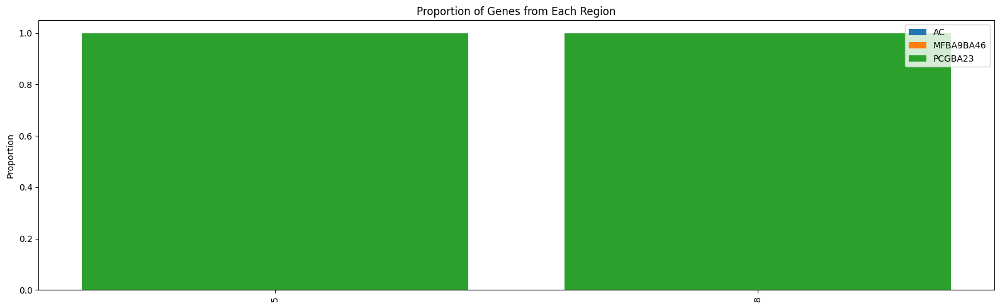

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import plotly.express as px
import plotly.graph_objects as go

KEGG_CSV = "/Volumes/Transcend/ROSMAP_WGCNA/kegg_rosmap_brains_se2_res1.csv"
kegg_ids = pd.read_csv(KEGG_CSV, engine="python", on_bad_lines="skip")["Cluster"].unique().tolist()

cluster_details_full = pd.read_csv("/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/RNAseq_RISK_BrainRegions_STasaki/outputs/speakeasy_clusters/speakeasy_clusters_details_1.csv", sep=",")

cluster_details_full_ct = cluster_details_full[cluster_details_full['Cluster Type'] == 'TS']

cluster_details_full_ct = cluster_details_full_ct[cluster_details_full_ct['Cluster ID'].isin(kegg_ids)]

clusters = cluster_details_full_ct[["Cluster ID", "AC", "MFBA9BA46", "PCGBA23"]]

for c in ["AC", "MFBA9BA46", "PCGBA23"]:
    clusters[c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0)

clusters = clusters.sort_values(by="Cluster ID").reset_index(drop=True)

counts = clusters[["AC", "MFBA9BA46", "PCGBA23"]]
props = counts.div(counts.sum(axis=1).replace(0, np.nan), axis=0).fillna(0)
props.insert(0, 'Cluster ID', clusters['Cluster ID'].astype(int).values)

fig, ax = plt.subplots(figsize=(16,5))
x = np.arange(len(props))
ax.bar(x, props['AC'], label='AC')
ax.bar(x, props['MFBA9BA46'], bottom=props['AC'], label='MFBA9BA46')
ax.bar(x, props['PCGBA23'], bottom=props["AC"] + props["MFBA9BA46"], label='PCGBA23')
ax.set_xticks(x)
ax.set_xticklabels(props['Cluster ID'].astype(str).tolist(), rotation=90)   
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Genes from Each Region')
ax.legend(loc='upper right')
fig.tight_layout()
fig.savefig("rosmap_se2_res1gene_proportionsTS.png", dpi=220, bbox_inches='tight')
plt.show()

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_9341/199803501.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clusters[c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0)


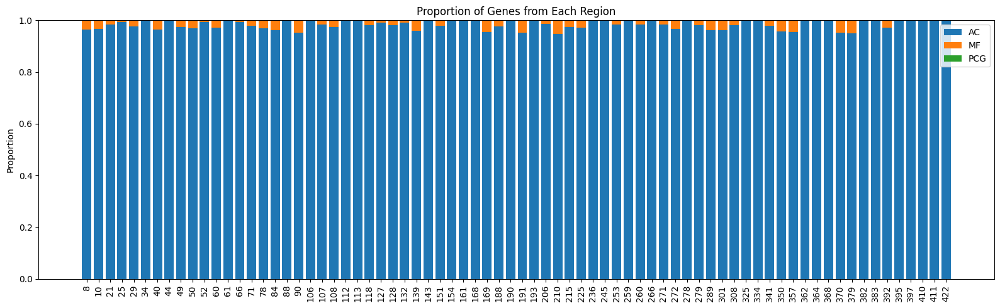

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import plotly.express as px
import plotly.graph_objects as go

go_CSV = "go_bp_tab_rosmap_full.csv"
go_ids = pd.read_csv(go_CSV, engine="python", on_bad_lines="skip")["module"].unique().tolist()

cluster_details_full = pd.read_csv("/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv", sep="\t")

cluster_details_full_ct = cluster_details_full[cluster_details_full['Cluster Type'] == 'TS']



cluster_details_full_ct = cluster_details_full_ct[cluster_details_full_ct['Cluster ID'].isin(go_ids)]

clusters = cluster_details_full_ct[["Cluster ID", "AC", "MF", "PCG"]]

for c in ["AC", "MF", "PCG"]:
    clusters[c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0)

clusters = clusters.sort_values(by="Cluster ID").reset_index(drop=True)

counts = clusters[["AC", "MF", "PCG"]]
props = counts.div(counts.sum(axis=1).replace(0, np.nan), axis=0).fillna(0)
props.insert(0, 'Cluster ID', clusters['Cluster ID'].astype(int).values)

fig, ax = plt.subplots(figsize=(16,5))
x = np.arange(len(props))
ax.bar(x, props['AC'], label='AC')
ax.bar(x, props['MF'], bottom=props['AC'], label='MF')
ax.bar(x, props['PCG'], bottom=props["AC"] + props["MF"], label='PCG')
ax.set_xticks(x)
ax.set_xticklabels(props['Cluster ID'].astype(str).tolist(), rotation=90)   
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Genes from Each Region')
ax.legend(loc='upper right')
fig.tight_layout()
fig.savefig("rosmap_gene_proportionsTSGO.png", dpi=220, bbox_inches='tight')
plt.show()

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_18516/1251450696.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clusters[c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0)


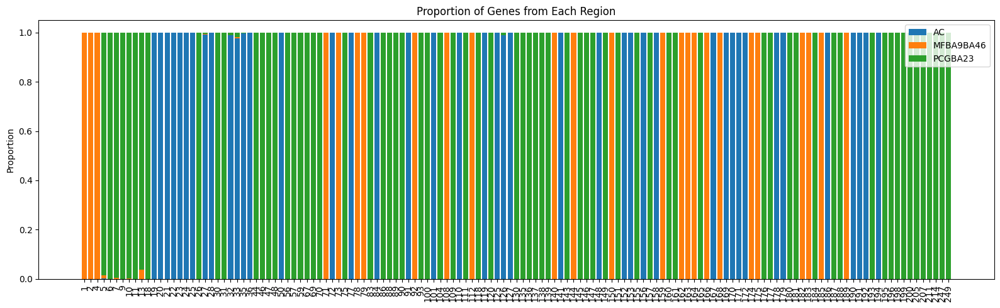

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import plotly.express as px
import plotly.graph_objects as go

cluster_details_full = pd.read_csv("/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/RNAseq_RISK_BrainRegions_STasaki/outputs/speakeasy_clusters/speakeasy_clusters_details_3.tsv", sep="\t")

cluster_details_full_ct = cluster_details_full[cluster_details_full['Cluster Type'] == 'TS']

clusters = cluster_details_full_ct[["Cluster ID", "AC", "MFBA9BA46", "PCGBA23"]]

for c in ["AC", "MFBA9BA46", "PCGBA23"]:
    clusters[c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0)

clusters = clusters.sort_values(by="Cluster ID").reset_index(drop=True)

counts = clusters[["AC", "MFBA9BA46", "PCGBA23"]]
props = counts.div(counts.sum(axis=1).replace(0, np.nan), axis=0).fillna(0)
props.insert(0, 'Cluster ID', clusters['Cluster ID'].astype(int).values)

fig, ax = plt.subplots(figsize=(16,5))
x = np.arange(len(props))
ax.bar(x, props['AC'], label='AC')
ax.bar(x, props['MFBA9BA46'], bottom=props['AC'], label='MFBA9BA46')
ax.bar(x, props['PCGBA23'], bottom=props["AC"] + props["MFBA9BA46"], label='PCGBA23')
ax.set_xticks(x)
ax.set_xticklabels(props['Cluster ID'].astype(str).tolist(), rotation=90)   
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Genes from Each Region')
ax.legend(loc='upper right')
fig.tight_layout()
fig.savefig("rosmap_se2_res3_gene_V4_proportionsTS.png", dpi=220, bbox_inches='tight')
plt.show()

In [ ]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

def prepare_ts_summary(cluster_details_path, cluster_type='TS', drop_clusters=None):
    df = pd.read_csv(cluster_details_path, sep="\t")
    df = df[df['Cluster Type'] == cluster_type].copy()
    
    if drop_clusters:
        df = df[~df['Cluster ID'].isin(drop_clusters)]
    for c in ["AC","MF","PCG"]:
        df[c] = pd.to_numeric(df[c], errors='coerce').fillna(0).astype(int)
    df["total"] = df[["AC","MF","PCG"]].sum(axis=1)
    for c in ["AC","MF","PCG"]:
        df[c+"_share"] = df[c] / df["total"].where(df["total"]>0, np.nan)
    df["dominant"] = df[["AC","MF","PCG"]].idxmax(axis=1)
    return df.sort_values("Cluster ID").reset_index(drop=True)

def plot_ts_compact_paged(summary_df,
                          order="total_desc",          # 'total_desc' / 'cluster_id' / 'dominant_then_total' / 'external'
                          external_order=None,         # רשימת Cluster ID לסדר חיצוני (למשל col_order מההיטמאפ)
                          modules_per_page=48,         # כמה מודולים בעמוד
                          filename="ts_modules_compact.pdf",
                          show_top_labels=False,       # לכתוב טקסט של totals מעל רק לטופ (או False)
                          top_label_k=10,              # כמה לתייג אם show_top_labels=True
                          cmap="Blues"):
    # --- בוחרים סדר מודולים ---
    if order == "external" and external_order is not None:
        order_list = [int(x) for x in external_order if int(x) in set(summary_df["Cluster ID"])]
    elif order == "cluster_id":
        order_list = summary_df.sort_values("Cluster ID")["Cluster ID"].tolist()
    elif order == "dominant_then_total":
        order_list = (summary_df.sort_values(["dominant","total"], ascending=[True, False])
                                ["Cluster ID"].tolist())
    else:  # total_desc (ברירת מחדל)
        order_list = summary_df.sort_values("total", ascending=False)["Cluster ID"].tolist()

    # --- עימוד ---
    pages = max(1, math.ceil(len(order_list)/modules_per_page))
    with PdfPages(filename) as pdf:
        for p in range(pages):
            mods = order_list[p*modules_per_page : (p+1)*modules_per_page]
            sub = (summary_df[summary_df["Cluster ID"].isin(mods)]
                   .set_index("Cluster ID").loc[mods])

            # נתוני heatmap של ההרכב (יחסים)
            comp = sub[["AC_share","MF_share","PCG_share"]].T.values
            comp = np.nan_to_num(comp, nan=0.0)

            # גרף: 2 שורות (Heatmap + עמודות totals)
            # רוחב דינאמי לפי #מודולים (שומר על קריאות בפאוורפוינט)
            w = max(12, min(30, 0.30*len(mods)))
            fig = plt.figure(figsize=(w, 6.5), constrained_layout=False)
            gs = fig.add_gridspec(nrows=3, ncols=1, height_ratios=[0.35,0.06, 0.65], hspace=0.15)

            # --- Heatmap של הרכב (3 x N) ---
            ax_hm = fig.add_subplot(gs[0,0])
            im = ax_hm.imshow(comp, aspect="auto", vmin=0.0, vmax=1.0, cmap=cmap)
            ax_hm.set_yticks([0,1,2]); ax_hm.set_yticklabels(["AC","MF","PCG"])
            ax_hm.set_xticks(range(len(mods))); ax_hm.set_xticklabels([str(m) for m in mods], rotation=90)
            ax_hm.set_title("Module composition (fractions) — aligned to totals below")
            # פס צבע קטן לימין
            cax = fig.add_axes([ax_hm.get_position().x1+0.005, ax_hm.get_position().y0, 0.012, ax_hm.get_position().height])
            cb = plt.colorbar(im, cax=cax); cb.ax.tick_params(labelsize=8)

            ax_gap = fig.add_subplot(gs[1,0])
            ax_gap.axis("off")

            # --- עמודות totals (מיושרות בדיוק לאותו סדר) ---
            ax_bar = fig.add_subplot(gs[2,0])
            x = np.arange(len(mods))
            bars = ax_bar.bar(x, sub["total"].values, color="#4477AA", width=0.9)
            ax_bar.set_xticks(x); ax_bar.set_xticklabels([str(m) for m in mods], rotation=90)
            ax_bar.set_ylabel("Total genes")
            ax_bar.set_title("Module size (total gene count)")

            # תיוג totals רק לטופ-K (אופציונלי)
            if show_top_labels:
                top_idx = np.argsort(sub["total"].values)[-top_label_k:]
                for i in top_idx:
                    ax_bar.text(x[i], sub["total"].values[i]+0.02*sub["total"].max(),
                                str(int(sub["total"].values[i])),
                                ha="center", va="bottom", fontsize=8)

            fig.suptitle(f"TS modules — page {p+1}/{pages}", y=0.99, fontsize=12)
            plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.96])
            pdf.savefig(fig, dpi=300)
            plt.close(fig)

    print(f"Saved compact, paginated summary to: {filename}")


In [ ]:
summary_ts = prepare_ts_summary(
    "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv",
    cluster_type="CT", drop_clusters=[1]
)

# 1) קומפקטי בעימוד, 48 מודולים לשקופית, מסודר בירידה לפי סה״כ:
plot_ts_compact_paged(summary_ts, order="total_desc",
                      modules_per_page=100, filename="ct_compact_page1.pdf",
                      show_top_labels=True, top_label_k=99999999)

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_20079/2073275581.py:87: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.96])


Saved compact, paginated summary to: ct_compact_page1.pdf


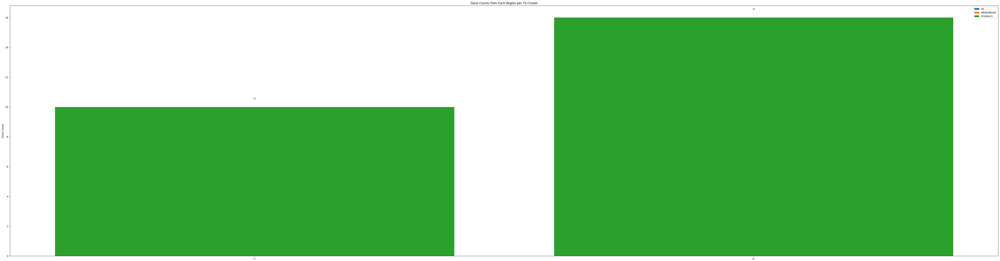

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
cluster_details_full = pd.read_csv(
    "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/RNAseq_RISK_BrainRegions_STasaki/outputs/speakeasy_clusters/speakeasy_clusters_details_1.csv",
    sep=","
)

kegg_ids = pd.read_csv("/Volumes/Transcend/ROSMAP_WGCNA/kegg_rosmap_brains_se2_res1.csv", engine="python", on_bad_lines="skip")["Cluster"].unique().tolist()

cluster_details_full_ct = cluster_details_full[cluster_details_full['Cluster Type'] == 'TS']
clusters = cluster_details_full_ct[["Cluster ID", "AC", "MFBA9BA46", "PCGBA23"]].copy()

# include only modules that is in kegg_ids
clusters = clusters[clusters["Cluster ID"].isin(kegg_ids)]
# drop cluster num 1
# clusters = clusters[clusters["Cluster ID"] != 1]

for c in ["AC", "MFBA9BA46", "PCGBA23"]:
    clusters.loc[:, c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0).astype(int)

clusters = clusters.sort_values(by="Cluster ID").reset_index(drop=True)

counts = clusters[["AC", "MFBA9BA46", "PCGBA23"]].copy()

fig, ax = plt.subplots(figsize=(57, 15))
x = np.arange(len(clusters))
bar_ac = ax.bar(x, counts["AC"], label="AC")
bar_mf = ax.bar(x, counts["MFBA9BA46"], bottom=counts["AC"], label="MFBA9BA46")
bar_pcg = ax.bar(x, counts["PCGBA23"], bottom=counts["AC"] + counts["MFBA9BA46"], label="PCGBA23")
totals = counts.sum(axis=1).values
for xi, total in zip(x, totals):
    ax.text(xi, total + 0.5, str(int(total)), ha="center", va="bottom", fontsize=8)
ax.set_xticks(x)
ax.set_xticklabels(clusters["Cluster ID"].astype(str).tolist(), rotation=90)
ax.set_ylabel("Gene Count")
ax.set_title("Gene Counts from Each Region per TS Cluster")
ax.legend(loc="upper right")
fig.tight_layout()
fig.savefig("rosmap_se2_res1_gene_countsTS_V4.png", dpi=480, bbox_inches="tight")
plt.show()

In [ ]:
cluster_details_full = pd.read_csv(
    "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv",
    sep="\t"
)

kegg_ids = pd.read_csv("/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full.csv", engine="python", on_bad_lines="skip")["Cluster"].unique().tolist()

cluster_details_full_ct = cluster_details_full[cluster_details_full['Cluster Type'] == 'CT']
clusters = cluster_details_full_ct[["Cluster ID", "AC", "MF", "PCG"]].copy()

# include only modules that is in kegg_ids
clusters = clusters[clusters["Cluster ID"].isin(kegg_ids)]

In [ ]:
clusters.shape

(82, 4)

Index(['Resolution', 'Cluster ID', 'Cluster Size', 'Cluster Type',
       'Dominant Tissue', 'Dominant Prop', 'Cluster Tissues', 'AC',
       'MFBA9BA46', 'PCGBA23'],
      dtype='object')


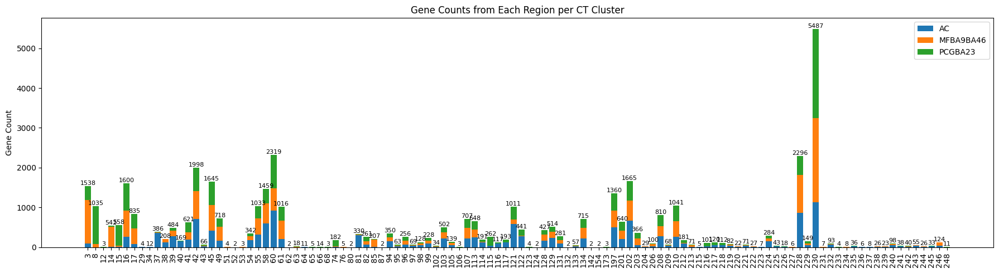

In [18]:

cluster_details_5000 = pd.read_csv(
    "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/RNAseq_RISK_BrainRegions_STasaki/outputs/speakeasy_clusters/speakeasy_clusters_details_3.tsv",
    sep="\t"
)
print(cluster_details_5000.columns)
cluster_details_5000_ct = cluster_details_5000[cluster_details_5000['Cluster Type'] == 'CT']
clusters = cluster_details_5000_ct[["Cluster ID", "AC", "MFBA9BA46", "PCGBA23"]].copy()

for c in ["AC", "MFBA9BA46", "PCGBA23"]:
    clusters.loc[:, c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0).astype(int)

clusters = clusters.sort_values(by="Cluster ID").reset_index(drop=True)

counts = clusters[["AC", "MFBA9BA46", "PCGBA23"]].copy()

fig, ax = plt.subplots(figsize=(18, 5))
x = np.arange(len(clusters))
bar_ac = ax.bar(x, counts["AC"], label="AC")
bar_mf = ax.bar(x, counts["MFBA9BA46"], bottom=counts["AC"], label="MFBA9BA46")
bar_pcg = ax.bar(x, counts["PCGBA23"], bottom=counts["AC"] + counts["MFBA9BA46"], label="PCGBA23")
totals = counts.sum(axis=1).values
for xi, total in zip(x, totals):
    ax.text(xi, total + 0.5, str(int(total)), ha="center", va="bottom", fontsize=8)
ax.set_xticks(x)
ax.set_xticklabels(clusters["Cluster ID"].astype(str).tolist(), rotation=90)
ax.set_ylabel("Gene Count")
ax.set_title("Gene Counts from Each Region per CT Cluster")
ax.legend(loc="upper right")
fig.tight_layout()
fig.savefig("rosmap_se2_res3gene_counts_top5000.png", dpi=220, bbox_inches="tight")
plt.show()

GO Visualizations

In [ ]:
GO_PMAT_TSV_FULL  = f"/Users/edeneldar/CoExpression_ReProduction/go_pmat_rosmap_full.tsv"   
GO_PMAT_TSV_TOP5000 = f"/Users/edeneldar/CoExpression_ReProduction/go_pmat_rosmap_5000.tsv"

GO_BP_CSV_FULL = f"/Users/edeneldar/CoExpression_ReProduction/go_bp_tab_rosmap_full.csv"
GO_BP_CSV_TOP5000 = f"/Users/edeneldar/CoExpression_ReProduction/go_bp_tab_rosmap_5000.csv"
GO_CC_CSV_FULL = f"/Users/edeneldar/CoExpression_ReProduction/go_cc_tab_rosmap_full.csv"
GO_CC_CSV_TOP5000 = f"/Users/edeneldar/CoExpression_ReProduction/go_cc_tab_rosmap_5000.csv"
GO_MF_CSV_FULL = f"/Users/edeneldar/CoExpression_ReProduction/go_mf_tab_rosmap_full.csv"
GO_MF_CSV_TOP5000 = f"/Users/edeneldar/CoExpression_ReProduction/go_mf_tab_rosmap_5000.csv"
CAP = 10.0


In [ ]:
def build_go_id_to_name(bp_csv=GO_BP_CSV_FULL, cc_csv=GO_CC_CSV_FULL, mf_csv=GO_MF_CSV_FULL):
    def _read(path):
        try:
            df = pd.read_csv(path, engine="python", on_bad_lines="skip")
        except Exception:
            df = pd.read_csv(path)
        id_col = None; name_col = None
        for c in df.columns:
            low = c.strip().lower()
            if low in {"termid", "id", "go_id", "goid"}:
                id_col = c
            if low in {"termname", "description", "name"}:
                name_col = c
        if id_col is None and "termID" in df.columns: id_col = "termID"
        if name_col is None and "termName" in df.columns: name_col = "termName"
        if id_col and name_col:
            return df[[id_col, name_col]].dropna().drop_duplicates().rename(columns={id_col:"GO", name_col:"Term"})
        return pd.DataFrame(columns=["GO","Term"])
    maps = pd.concat([_read(bp_csv), _read(cc_csv), _read(mf_csv)], ignore_index=True).drop_duplicates()
    return dict(zip(maps["GO"], maps["Term"]))

go_name = build_go_id_to_name()


In [ ]:
pmat = pd.read_csv(GO_PMAT_TSV_FULL, sep="\t")
pmat_ct = pmat[pmat.index.isin(cluster_details_full_ct["Cluster ID"])]

if "module" in pmat_ct.columns:
    pmat_ct = pmat_ct.set_index("module")

pmat_ct = pmat_ct.sort_index()
pmat_ct = pmat_ct.apply(pd.to_numeric, errors="coerce") 

N_PER_MODULE = 4    
MAX_TERMS    = 60  
P_THRESH     = 0.05  

candidate = set()
for mod, row in pmat_ct.iterrows():
    sig = row[row < P_THRESH].nsmallest(N_PER_MODULE)
    if sig.empty:
        sig = row.nsmallest(N_PER_MODULE)
    candidate.update(sig.index.tolist())

terms = list(candidate)
if len(terms) > MAX_TERMS:
    keep = pmat_ct[terms].min(axis=0).nsmallest(MAX_TERMS).index.tolist()
    terms = keep

sub_p = pmat_ct[terms].copy()                          
sub_p = sub_p.replace(1, np.nan)
sub_p = sub_p.replace(0, np.nextafter(0, 1))
neglog = -np.log10(sub_p)

mat = neglog.T.copy()
peak_mod = mat.idxmax(axis=1)
peak_val = mat.max(axis=1)
mat["__peak_mod__"] = peak_mod
mat["__peak_val__"] = peak_val
mat = mat.sort_values(by=["__peak_mod__", "__peak_val__"], ascending=[True, False]).drop(columns=["__peak_mod__", "__peak_val__"])

def pretty_label(go_id: str, max_len=80):
    name = go_name.get(go_id, "")
    label = f"{go_id} — {name}"
    return label if len(label) <= max_len else label[:max_len-1] + "…"

row_labels = [pretty_label(go) for go in mat.index]

mat.to_csv("go_enrichment_selected_matrix_full.csv")


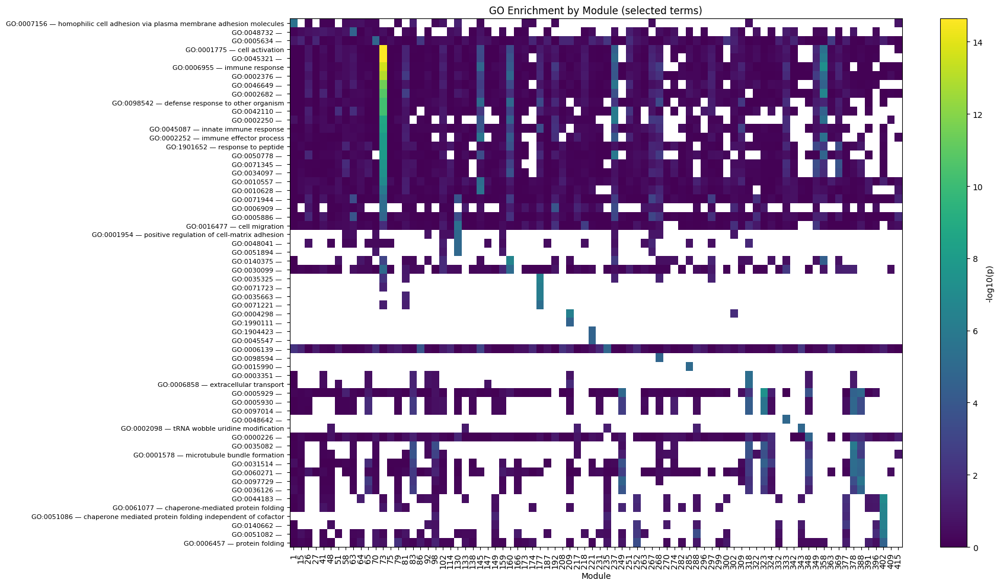

In [ ]:
cmap = plt.cm.viridis.copy()
cmap.set_bad(color="white")

fig, ax = plt.subplots(figsize=(18, 10))
im = ax.imshow(mat.values, aspect="auto", interpolation="nearest", cmap=cmap)
cbar = fig.colorbar(im, ax=ax, label="-log10(p)")
ax.set_yticks(range(len(row_labels)))
ax.set_yticklabels(row_labels, fontsize=8)
ax.set_xticks(range(mat.shape[1]))
ax.set_xticklabels(mat.columns.astype(str), rotation=90)
ax.set_xlabel("Module")
ax.set_title("GO Enrichment by Module (selected terms)")
fig.tight_layout()
fig.savefig("go_enrichment_heatmap_full.png", dpi=220, bbox_inches="tight")
plt.show()


In [ ]:
p_for_hover = sub_p.T.loc[mat.index, mat.columns] 

hover_text = []
for i, term in enumerate(mat.index):
    row = []
    for j, mod in enumerate(mat.columns):
        val = mat.iloc[i, j]
        p   = p_for_hover.iloc[i, j]
        if pd.isna(val):
            row.append(f"Term: {pretty_label(term)}<br>Module: {mod}<br>p = 1.0 (no enrichment)")
        else:
            row.append(f"Term: {pretty_label(term)}<br>Module: {mod}<br>-log10(p) = {val:.2f}<br>p ≈ {10**(-val):.2e}")
    hover_text.append(row)

fig = go.Figure(data=go.Heatmap(
    z=mat.values,
    x=[str(c) for c in mat.columns],
    y=row_labels,
    text=hover_text,
    hoverinfo="text",
    coloraxis="coloraxis",
))
fig.update_layout(
    title="GO Enrichment by Module (selected terms)",
    xaxis_title="Module",
    yaxis_title="GO term",
    coloraxis=dict(colorbar=dict(title="-log10(p)")),
    height=700
)
fig.show()


In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

DATA_DIR = "."

GO_PMAT_TSV = f"{DATA_DIR}/go_pmat_rosmap_full.tsv"
GO_BP_CSV   = f"{DATA_DIR}/go_bp_tab_rosmap_full.csv"
GO_CC_CSV   = f"{DATA_DIR}/go_cc_tab_rosmap_full.csv"
GO_MF_CSV   = f"{DATA_DIR}/go_mf_tab_rosmap_full.csv"

KEGG_LONG_CSV = f"{DATA_DIR}/kegg_rosmap_full.csv"

MODULES_DETAILS = f"/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
OUT_DIR = Path(DATA_DIR) / "plots_signed_heatmaps"
OUT_DIR.mkdir(parents=True, exist_ok=True)

def read_csv_any(path, sep=None):
    try:
        if sep is not None:
            return pd.read_csv(path, sep=sep)
        return pd.read_csv(path)
    except Exception:
        try:
            return pd.read_csv(path, engine="python", on_bad_lines="skip")
        except Exception as e:
            raise e

def plot_signed_heatmap(mat_signed_T, title, out_png, cap=10.0, ylabels=None):
    """
    mat_signed_T: DataFrame (rows=terms, cols=modules) של signed -log10(p) אחרי מיון.
    """
    fig, ax = plt.subplots(figsize=(18, 10))
    im = ax.imshow(mat_signed_T.values, aspect="auto", interpolation="nearest",
                   vmin=-cap, vmax=cap)  
    cbar = fig.colorbar(im, ax=ax, label="signed −log10(p)  (under ⟵ 0 ⟶ over)")
    ax.set_yticks(range(mat_signed_T.shape[0]))
    ax.set_yticklabels(ylabels if ylabels is not None else mat_signed_T.index.tolist(), fontsize=8)
    ax.set_xticks(range(mat_signed_T.shape[1]))
    ax.set_xticklabels(mat_signed_T.columns.astype(str), rotation=90)
    ax.set_xlabel("Module")
    ax.set_title(title)
    fig.tight_layout()
    fig.savefig(out_png, dpi=220, bbox_inches="tight")
    plt.show()
    return fig


In [ ]:
def _read_go_long_table(path):
    df = read_csv_any(path, sep=None)
    cols = {c.lower(): c for c in df.columns}
    get = lambda *cand: next((cols[c] for c in cand if c in cols), None)
    return df.rename(columns={ 
        get("module","cluster","cluster id","cluster_id"): "module",
        get("nmodgenesinterm","overlap","k.in.term","k_term"): "x",
        get("modsize","k","module_size"): "k",
        get("bkgrtermsize","m","term_size"): "m",
        get("bkgrmodsize","n","background_size","bgsize"): "N",
        get("fracofbkgrtermsize"): "m_over_N",
        get("fracofbkgrmodsize"): "k_over_N",
        get("termid","id","go_id","goid"): "termID",
        get("termname","description","name"): "termName"
    })

def _concat_go_longs(bp_csv, cc_csv, mf_csv):
    frames = []
    for p in [bp_csv, cc_csv, mf_csv]:
        try:
            frames.append(_read_go_long_table(p))
        except Exception:
            pass
    long = pd.concat(frames, ignore_index=True).dropna(subset=["module","termID"])
    long["module"] = pd.to_numeric(long["module"], errors="coerce")
    for c in ["x","k","m","N","m_over_N","k_over_N"]:
        if c in long.columns:
            long[c] = pd.to_numeric(long[c], errors="coerce")
    long = long.dropna(subset=["module"])
    long["termID"] = long["termID"].astype(str)
    return long

def _go_direction_map(long_df):
    if "N" not in long_df.columns or long_df["N"].isna().all():
        N_est1 = np.where(long_df["m"].notna() & long_df["m_over_N"].notna() & (long_df["m_over_N"]>0),
                          long_df["m"]/long_df["m_over_N"], np.nan)
        N_est2 = np.where(long_df["k"].notna() & long_df["k_over_N"].notna() & (long_df["k_over_N"]>0),
                          long_df["k"]/long_df["k_over_N"], np.nan)
        long_df = long_df.copy()
        long_df["N_est"] = pd.Series(N_est1).fillna(pd.Series(N_est2))
        N_vec = long_df["N_est"]
    else:
        N_vec = long_df["N"]

    obs_prop = (long_df["x"] / long_df["k"]).astype(float)
    bg_prop  = (long_df["m"] / N_vec).astype(float)
    sign = np.sign(obs_prop - bg_prop)
    dir_map = {(int(mod), term): s for mod, term, s in zip(long_df["module"], long_df["termID"], sign)
               if pd.notna(mod) and pd.notna(s)}
    return dir_map

def _go_id_to_name_map(bp_csv, cc_csv, mf_csv):
    frames = []
    for path in [bp_csv, cc_csv, mf_csv]:
        try:
            df = read_csv_any(path, sep=None)
        except Exception:
            continue
        cols = {c.lower(): c for c in df.columns}
        id_col  = next((cols[c] for c in ["termid","id","go_id","goid"] if c in cols), None)
        name_col= next((cols[c] for c in ["termname","description","name"] if c in cols), None)
        if id_col and name_col:
            frames.append(df[[id_col, name_col]].rename(columns={id_col:"GO", name_col:"Term"}))
    if not frames:
        return {}
    mapping = pd.concat(frames, ignore_index=True).dropna().drop_duplicates()
    return dict(zip(mapping["GO"].astype(str), mapping["Term"].astype(str)))

def build_go_signed_matrix(
    go_pmat_tsv=GO_PMAT_TSV,
    go_bp_csv=GO_BP_CSV, go_cc_csv=GO_CC_CSV, go_mf_csv=GO_MF_CSV, modules_details=MODULES_DETAILS,
    cap=10.0, selection="global_top", K_GLOBAL=60, N_PER_MODULE=4, P_THRESH=0.05, clean_TS=True
):
    pmat = read_csv_any(go_pmat_tsv, sep="\t")
    if clean_TS:
        mod_details = read_csv_any(modules_details, sep="\t")
        print(mod_details.columns)
        pmat = pmat[pmat.index.isin(mod_details[mod_details["Cluster Type"] == "CT"]["Cluster ID"])]
    if "module" in pmat.columns:
        pmat = pmat.set_index("module")
    pmat.index = pd.to_numeric(pmat.index, errors="coerce")
    pmat = pmat.sort_index()
    pmat = pmat.apply(pd.to_numeric, errors="coerce")
    pmat.columns = pmat.columns.astype(str)

    long_df = _concat_go_longs(go_bp_csv, go_cc_csv, go_mf_csv)
    dir_map = _go_direction_map(long_df)
    if selection == "global_top":
        terms = pmat.min(axis=0).nsmallest(K_GLOBAL).index.tolist()
    elif selection == "per_module":
        terms = set()
        for mod, row in pmat.iterrows():
            sig = row[row < P_THRESH].nsmallest(N_PER_MODULE)
            if sig.empty:
                sig = row.nsmallest(N_PER_MODULE)
            terms.update(sig.index.tolist())
        terms = list(terms)
        if len(terms) > K_GLOBAL:
            terms = pmat[terms].min(axis=0).nsmallest(K_GLOBAL).index.tolist()
    else:
        raise ValueError("selection must be 'global_top' or 'per_module'.")

    sub = pmat[terms].copy()

    EPS = np.nextafter(0, 1)
    signed = sub.copy()
    for c in signed.columns:
        p = signed[c].astype(float)
        v = -np.log10(np.clip(p, EPS, 1.0))
        v = np.minimum(v, cap)
        s = [dir_map.get((int(mod), str(c)), 0.0) for mod in signed.index]
        signed[c] = v * np.array(s)

    mat_T = signed.T
    peak_mod = mat_T.idxmax(axis=1)
    peak_val = mat_T.max(axis=1)
    mat_T["__peak_mod__"] = peak_mod
    mat_T["__peak_val__"] = peak_val
    mat_T = mat_T.sort_values(by=["__peak_mod__", "__peak_val__"], ascending=[True, False])
    mat_T = mat_T.drop(columns=["__peak_mod__", "__peak_val__"])

    id2name = _go_id_to_name_map(go_bp_csv, go_cc_csv, go_mf_csv)
    ylabels = [f"{go} — {id2name.get(go, '')}".strip(" —") for go in mat_T.index]

    return mat_T, ylabels


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import matplotlib.patheffects as pe

def build_go_logp_matrix(
    go_pmat_tsv,               
    go_terms_csv=None,           
    modules_details=None,        
    clean_TS=True,
    cap=6.0,                    
    selection="global_top",  
    K_GLOBAL=60,             
    N_PER_MODULE=4,              
    P_THRESH=0.05,               
    alpha_levels=((1e-3,"***"), (1e-2,"**"), (5e-2,"*")),  
):
    pmat = pd.read_csv(go_pmat_tsv, sep="\t")
    if "module" in pmat.columns:
        pmat = pmat.set_index("module")
    pmat.index = pd.to_numeric(pmat.index, errors="coerce")
    pmat = pmat.sort_index().apply(pd.to_numeric, errors="coerce")
    pmat.columns = pmat.columns.astype(str).str.strip().str.upper()

    if clean_TS and modules_details is not None:
        md = pd.read_csv(modules_details, sep="\t")
        ct_ids = md.loc[md["Cluster Type"].eq("TS"), "Cluster ID"].astype(int).tolist()
        pmat = pmat[pmat.index.astype(int).isin(ct_ids)]

    import re

    def _norm_id(x):
        return str(x).strip().upper()

    def _detect_go_cols(df):
        cols = {c.lower(): c for c in df.columns}

        id_keys   = ["termid","id","go_id","goid","go.id","go"] 
        name_keys = ["termname","description","name","term", "bkgrTermSize"]

        id_col = next((cols[k] for k in id_keys if k in cols), None)
        name_col = next((cols[k] for k in name_keys if k in cols), None)

        if id_col is None:
            obj_cols = [c for c in df.columns if df[c].dtype == 'object']
            best, best_frac = None, 0.0
            for c in obj_cols:
                s = df[c].astype(str).str.strip()
                frac = s.str.match(r"^GO:\d{4,9}$", na=False).mean()
                if frac > best_frac:
                    best, best_frac = c, frac
            if best_frac >= 0.3: 
                id_col = best

        if name_col is None:
            cand = []
            for c in df.columns:
                if c == id_col: 
                    continue
                s = df[c].astype(str)
                if s.str.match(r"^GO:\d{4,9}$", na=False).mean() > 0.2:
                    continue
                avg_len = s.str.len().mean()
                nan_frac = s.isna().mean()
                cand.append((avg_len - 20*nan_frac, c))
            if cand:
                name_col = max(cand)[1]

        return id_col, name_col
    id2name = {}
    if go_terms_csv is not None:
        terms = pd.read_csv(go_terms_csv, engine="python", on_bad_lines="skip")
        id_col, name_col = _detect_go_cols(terms)

        if id_col is not None:
            terms[id_col] = terms[id_col].map(_norm_id)

            keep_ids  = set(terms[id_col].dropna().unique())
            keep_cols = [c for c in pmat.columns if _norm_id(c) in keep_ids]
            if len(keep_cols) > 0:
                pmat = pmat[keep_cols]

            if name_col is not None:
                id2name = (terms[[id_col, name_col]]
                        .dropna()
                        .drop_duplicates(id_col)
                        .assign(**{id_col: lambda d: d[id_col].map(_norm_id),
                                    name_col: lambda d: d[name_col].astype(str).str.strip()})
                        .set_index(id_col)[name_col]
                        .to_dict())

    pmat.columns = [ _norm_id(c) for c in pmat.columns ]

    if selection == "global_top":
        chosen = pmat.min(axis=0).nsmallest(K_GLOBAL).index.tolist()
    elif selection == "per_module":
        chosen_set = set()
        for _, row in pmat.iterrows():
            sig = row[row < P_THRESH].nsmallest(N_PER_MODULE)
            if sig.empty:
                sig = row.nsmallest(N_PER_MODULE)
            chosen_set.update(sig.index.tolist())
        chosen = list(chosen_set)
        if len(chosen) > K_GLOBAL:
            chosen = pmat[chosen].min(axis=0).nsmallest(K_GLOBAL).index.tolist()
    else:
        raise ValueError("selection must be 'global_top' או 'per_module'.")

    psub = pmat[chosen].copy()    

    EPS = np.nextafter(0, 1)
    logp_T = (-np.log10(np.clip(psub, EPS, 1.0))).T 
    logp_T = logp_T.clip(lower=0, upper=cap)

    def pretty(go):
        name = id2name.get(go, "")
        return f"{go} — {name}" if name else go
    logp_T.index = [pretty(go) for go in logp_T.index]

    max_val = logp_T.max(axis=1)
    peak_mod = logp_T.idxmax(axis=1)
    logp_T["__peak_mod__"] = peak_mod
    logp_T["__max__"] = max_val
    logp_T = logp_T.sort_values(by=["__peak_mod__", "__max__"], ascending=[True, False]) \
                   .drop(columns=["__peak_mod__", "__max__"])

    measure_df = psub.T.copy()
    measure_df.index = [pretty(go) for go in measure_df.index]
    measure_df = measure_df.reindex(index=logp_T.index, columns=logp_T.columns)

    def _stars(p):
        if not np.isfinite(p): return ""
        for thr, sym in alpha_levels:
            if p <= thr: return sym
        return ""
    stars_df = measure_df.applymap(_stars)

    return logp_T, measure_df, stars_df 


def plot_log_heatmap_with_stars(logp_df, stars_df=None, cap=6.0, title="GO −log10(p)"):
    fig, ax = plt.subplots(figsize=(18, 10))
    im = ax.imshow(logp_df.values, aspect="auto", vmin=0.0, vmax=cap) 
    fig.colorbar(im, ax=ax, label=f"−log10(p) (0..{cap})")

    ax.set_yticks(range(logp_df.shape[0])); ax.set_yticklabels(logp_df.index, fontsize=8)
    ax.set_xticks(range(logp_df.shape[1])); ax.set_xticklabels(logp_df.columns.astype(str), rotation=90)
    ax.set_xlabel("Module"); ax.set_title(title)

    if stars_df is not None:
        stars_df = stars_df.reindex(index=logp_df.index, columns=logp_df.columns)
        for i, term in enumerate(logp_df.index):
            for j, mod in enumerate(logp_df.columns):
                s = stars_df.loc[term, mod]
                if isinstance(s, str) and s:
                    ax.text(j, i, s, ha="center", va="center", fontsize=9, color="black")

    fig.tight_layout()
    return fig


/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_9341/885306414.py:137: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)


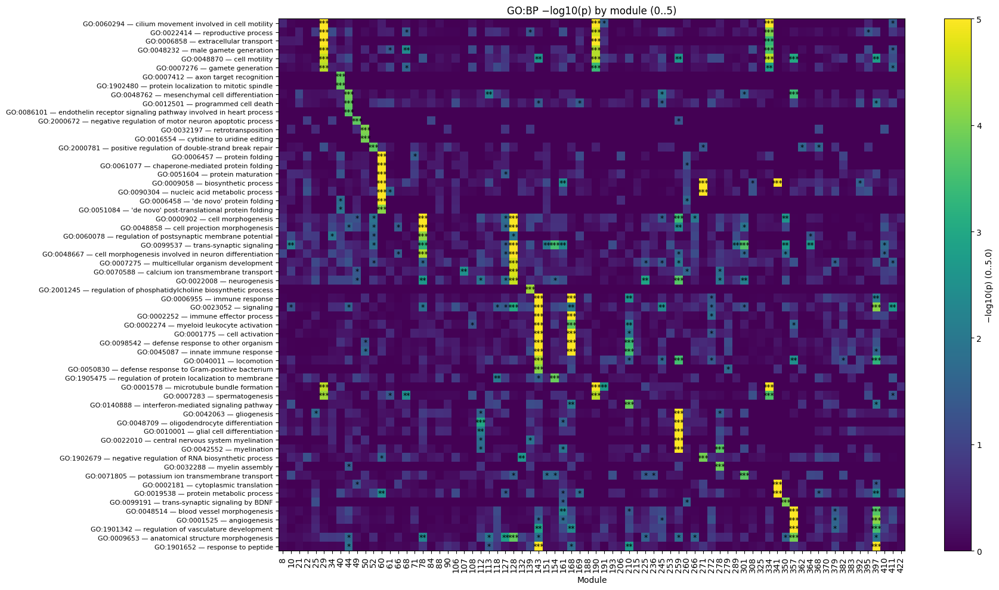

In [ ]:
GO_PMAT = "/Users/edeneldar/CoExpression_ReProduction/go_pmat_rosmap_full.tsv"
GO_BP   = "/Users/edeneldar/CoExpression_ReProduction/go_bp_tab_rosmap_full.csv"
GO_CC   = "/Users/edeneldar/CoExpression_ReProduction/go_cc_tab_rosmap_full.csv"
GO_MF   = "/Users/edeneldar/CoExpression_ReProduction/go_mf_tab_rosmap_full.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
logp_df, meas_df, stars_df = build_go_logp_matrix(
    GO_PMAT, go_terms_csv=GO_BP, modules_details=MODULES,
    clean_TS=True, selection="global_top", K_GLOBAL=60, cap=5.0
)

plot_log_heatmap_with_stars(logp_df, stars_df, cap=5.0,
                            title="GO:BP −log10(p) by module (0..5)")
plt.savefig("go_signed_heatmap_full_global_newTS.png", dpi=220, bbox_inches='tight')
plt.show()


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def build_kegg_logp_matrix(
    kegg_long_csv,           
    modules_details=None,   
    clean_TS=True,
    cap=6.0,                 
    selection="global_top", 
    K_GLOBAL=60,             
    N_PER_MODULE=4,             
    P_THRESH=0.05,              
    star_from="p",
    group = 'TS',
    alpha_levels=((0.0005,"***"), (0.005,"**"), (0.05,"*"))
):
    df = pd.read_csv(kegg_long_csv, engine="python", on_bad_lines="skip")
    assert "Cluster" in df.columns and "Description" in df.columns, "Missing Cluster/Description"

    df["Cluster"] = pd.to_numeric(df["Cluster"], errors="coerce").astype("Int64")
    df = df.dropna(subset=["Cluster"])
    df["Cluster"] = df["Cluster"].astype(int)
    df["Description"] = df["Description"].astype(str).str.strip()
    if "ID" in df.columns:
        df["ID"] = df["ID"].astype(str).str.strip()

    df["p"]      = pd.to_numeric(df.get("pvalue"),   errors="coerce")
    df["padj"]   = pd.to_numeric(df.get("p.adjust"), errors="coerce")
    df["qvalue"] = pd.to_numeric(df.get("qvalue"),   errors="coerce")

    if clean_TS and modules_details is not None:
        md = pd.read_csv(modules_details, sep="\t")
        ct_ids = md.loc[md["Cluster Type"].eq(group), "Cluster ID"].astype(int).tolist()
        df = df[df["Cluster"].isin(ct_ids)]
    

    agg = (df.groupby(["Description","Cluster"], as_index=False)
             .agg(p=("p","min"), padj=("padj","min"), qvalue=("qvalue","min")))
    pmat = agg.pivot(index="Description", columns="Cluster", values="p").astype(float)

    if selection == "global_top":
        chosen_terms = pmat.min(axis=1).nsmallest(K_GLOBAL).index.tolist()
    elif selection == "per_module":
        chosen = set()
        for c in pmat.columns:
            col = pmat[c]
            sig = col[col < P_THRESH].nsmallest(N_PER_MODULE)
            if sig.empty: sig = col.nsmallest(N_PER_MODULE)
            chosen.update(sig.index.tolist())
        chosen_terms = list(chosen)
        if len(chosen_terms) > K_GLOBAL:
            chosen_terms = pmat.loc[chosen_terms].min(axis=1).nsmallest(K_GLOBAL).index.tolist()
    else:
        raise ValueError("selection must be 'global_top' או 'per_module'.")

    psub = pmat.loc[chosen_terms] 

    EPS = np.nextafter(0, 1)
    logp_df = -np.log10(np.clip(psub, EPS, 1.0))
    logp_df = logp_df.clip(lower=0, upper=cap).fillna(0.0)

    if "ID" in df.columns:
        idmap = (df[["Description","ID"]].dropna().drop_duplicates()
                   .groupby("Description")["ID"].first())
        new_index = [f"{idmap.get(desc, '')} — {desc}".strip(" —") for desc in logp_df.index]
        logp_df.index = new_index

    if star_from == "padj":
        measure_mat = agg.pivot(index="Description", columns="Cluster", values="padj").astype(float)
    elif star_from in {"qvalue","q"}:
        measure_mat = agg.pivot(index="Description", columns="Cluster", values="qvalue").astype(float)
    else:
        measure_mat = pmat  

    measure_df = measure_mat.loc[psub.index, psub.columns]
    if "ID" in df.columns:
        measure_df.index = logp_df.index  

    def _stars(p):
        if not np.isfinite(p): return ""
        for thr, sym in alpha_levels:
            if p <= thr: return sym
        return ""
    stars_df = measure_df.applymap(_stars)

    max_val = logp_df.max(axis=1)
    peak_mod = logp_df.idxmax(axis=1)
    logp_df["__peak_mod__"] = peak_mod
    logp_df["__max__"] = max_val
    logp_df = logp_df.sort_values(by=["__peak_mod__", "__max__"], ascending=[True, False]) \
                     .drop(columns=["__peak_mod__", "__max__"])

    measure_df = measure_df.loc[logp_df.index, logp_df.columns]
    stars_df   = stars_df.loc[logp_df.index, logp_df.columns]

    return logp_df, measure_df, stars_df 


def plot_log_heatmap_with_stars(logp_df, stars_df=None, cap=6.0, title="KEGG −log10(p)"):
    fig, ax = plt.subplots(figsize=(18, 10))
    im = ax.imshow(logp_df.values, aspect="auto", vmin=0.0, vmax=cap)
    fig.colorbar(im, ax=ax, label=f"−log10(p) (0..{cap})")
    ax.set_yticks(range(logp_df.shape[0])); ax.set_yticklabels(logp_df.index, fontsize=8)
    ax.set_xticks(range(logp_df.shape[1])); ax.set_xticklabels(logp_df.columns.astype(str), rotation=90)
    ax.set_xlabel("Module"); ax.set_title(title)

    if stars_df is not None:
        stars_df = stars_df.reindex(index=logp_df.index, columns=logp_df.columns)
        for i, term in enumerate(logp_df.index):
            for j, mod in enumerate(logp_df.columns):
                s = stars_df.loc[term, mod]
                if isinstance(s, str) and s:
                    ax.text(j, i, s, ha="center", va="center", fontsize=9, color="red")

    fig.tight_layout()
    return fig


In [7]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- נירמול שמות עקבי ----
def _norm_label(x):
    if pd.isna(x):
        return np.nan
    return str(x).strip()

# ---- יצירת רצף צבעים גדול ועקבי ----
def _big_color_pool():
    return (list(plt.cm.tab20.colors) +
            list(plt.cm.tab20b.colors) +
            list(plt.cm.tab20c.colors) +
            list(plt.cm.Set3.colors)  +
            list(plt.cm.Pastel1.colors) +
            list(plt.cm.Accent.colors))

# ---- סטנדרטיזציה של שמות עמודות KEGG (כמו בקוד שלך) ----
def _std_cols(df):
    low = {c.lower(): c for c in df.columns}
    def pick(*keys):
        for k in keys:
            if k in low: return low[k]
        return None
    return {
        "Cluster":      pick("cluster"),
        "Description":  pick("description","pathway","term","name"),
        "ID":           pick("id"),
        "category":     pick("category","catagory"),
        "subcategory":  pick("subcategory","subcatagory","sub_category","sub-cat"),
    }

def build_kegg_annotation_palettes(kegg_full_csv,
                                   order="appearance",  # "appearance" או "alpha"
                                   to_json_path=None):
    """
    קורא את קובץ ה-KEGG המלא, בונה מיפוי צבעים קבוע ל-category ול-subcategory.
    החזר: (palette_cat, palette_sub) כמילונים: label -> (r,g,b)

    order="appearance": לפי סדר הופעה בקובץ (דטרמיניסטי)
    order="alpha":      לפי אלפבית
    """
    df = pd.read_csv(kegg_full_csv, engine="python", on_bad_lines="skip")
    cols = _std_cols(df)

    cat_col = cols["category"]
    sub_col = cols["subcategory"]

    cats = pd.Series(dtype=object)
    subs = pd.Series(dtype=object)

    if cat_col is not None:
        cats = df[cat_col].map(_norm_label).dropna()
    if sub_col is not None:
        subs = df[sub_col].map(_norm_label).dropna()

    if order == "alpha":
        uniq_cats = sorted(pd.unique(cats))
        uniq_subs = sorted(pd.unique(subs))
    else:
        uniq_cats = list(pd.unique(cats))
        uniq_subs = list(pd.unique(subs))

    pool = _big_color_pool()
    def assign(labels):
        return {lab: pool[i % len(pool)] for i, lab in enumerate(labels)}

    palette_cat = assign(uniq_cats)
    palette_sub = assign(uniq_subs)

    if to_json_path:
        with open(to_json_path, "w", encoding="utf-8") as f:
            json.dump({"category": palette_cat, "subcategory": palette_sub}, f, indent=2)

    return palette_cat, palette_sub

def load_kegg_annotation_palettes(json_path):
    with open(json_path, "r", encoding="utf-8") as f:
        d = json.load(f)
    # המרה ל-tuples אם נטען כרשימות
    pc = {k: tuple(v) for k, v in d.get("category", {}).items()}
    ps = {k: tuple(v) for k, v in d.get("subcategory", {}).items()}
    return pc, ps


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import to_rgb

def _std_cols(df):
    low = {c.lower(): c for c in df.columns}
    def pick(*keys):
        for k in keys:
            if k in low: return low[k]
        return None
    c_cluster    = pick("cluster")
    c_desc       = pick("description","pathway","term","name")
    c_id         = pick("id")
    c_category   = pick("category","catagory")      
    c_subcat     = pick("subcategory","subcatagory","sub_category","sub-cat")
    return {"Cluster":c_cluster,"Description":c_desc,"ID":c_id,
            "category":c_category,"subcategory":c_subcat}

def _extract_row_meta_from_kegg(kegg_long_csv, row_labels):
    """
    row_labels הם שמות השורות בהיטמאפ (יכולים להיות "ID — Description" או רק Description).
    מחזיר DataFrame עם אינדקס = row_labels ועמודות ['category','subcategory'] (ייתכנו NaN אם חסר).
    """
    df = pd.read_csv(kegg_long_csv, engine="python", on_bad_lines="skip")
    cols = _std_cols(df)
    if cols["Description"] is None:
        return pd.DataFrame(index=row_labels, columns=["category","subcategory"])
    desc_col = cols["Description"]
    id_col   = cols["ID"]
    cat_col  = cols["category"]
    sub_col  = cols["subcategory"]

    meta = (df.dropna(subset=[desc_col])
              .drop_duplicates([desc_col])
              .rename(columns={
                  desc_col:"Description",
                  cat_col:"category" if cat_col else "category",
                  sub_col:"subcategory" if sub_col else "subcategory"
              })[["Description","category","subcategory"]])

    def parse_desc(lbl):
        if "—" in lbl:
            return lbl.split("—", 1)[-1].strip()
        if " - " in lbl:
            return lbl.split(" - ", 1)[-1].strip()
        return lbl.strip()

    desc_series = pd.Series([parse_desc(x) for x in row_labels], index=row_labels, name="Description")
    row_meta = desc_series.to_frame().merge(meta, on="Description", how="left").set_index(desc_series.index)
    return row_meta[["category","subcategory"]]

def _palette(labels, base_colors=None):
    
    uniq = [x for x in pd.unique(pd.Series(labels)) if pd.notna(x)]
    if not uniq:
        return {}
    if base_colors is None:
        base_colors = (
            list(plt.cm.tab20.colors) +
            list(plt.cm.tab20b.colors) +
            list(plt.cm.tab20c.colors) +
            list(plt.cm.Set3.colors)
        )
    color_map = {lab: base_colors[i % len(base_colors)] for i, lab in enumerate(uniq)}
    return color_map
def plot_kegg_log_heatmap_with_annots(
    logp_df, stars_df=None, cap=6.0, title="KEGG −log10(p)",
    kegg_long_csv=None, row_meta=None, figsize=(20, 12),
    legend_fontsize=8
):
    if row_meta is None:
        if kegg_long_csv is not None:
            row_meta = _extract_row_meta_from_kegg(kegg_long_csv, logp_df.index.tolist())
        else:
            row_meta = pd.DataFrame(index=logp_df.index, columns=["category","subcategory"])

    rm = row_meta.copy()
    sub_order = pd.Categorical(rm["subcategory"], categories=pd.unique(rm["subcategory"].dropna()), ordered=True)
    cat_order = pd.Categorical(rm["category"],    categories=pd.unique(rm["category"].dropna()),    ordered=True)
    rm["_subo"] = sub_order
    rm["_cato"] = cat_order
    order_idx = rm.sort_values(by=["_subo","_cato"], na_position="last", kind="mergesort").index  # subcat -> cat

    logp_df  = logp_df.loc[order_idx]
    if stars_df is not None:
        stars_df = stars_df.reindex(index=order_idx, columns=logp_df.columns)
    row_meta = rm.loc[order_idx, ["category","subcategory"]]

    cat_map  = _palette(row_meta["category"])
    sub_map  = _palette(row_meta["subcategory"])
    cat_colors = np.array([to_rgb(cat_map.get(v, (0.9,0.9,0.9)))  for v in row_meta["category"]])
    sub_colors = np.array([to_rgb(sub_map.get(v, (0.95,0.95,0.95))) for v in row_meta["subcategory"]])

    fig = plt.figure(figsize=figsize, constrained_layout=False)
    gs = fig.add_gridspec(
        nrows=2, ncols=4,
        width_ratios=[1.00, 0.055, 0.055, 0.36],
        height_ratios=[1.00, 0.075],   
        wspace=0.015, hspace=0.08
    )

    ax_hm   = fig.add_subplot(gs[0,0])
    ax_cat  = fig.add_subplot(gs[0,1])
    ax_sub  = fig.add_subplot(gs[0,2])
    ax_leg  = fig.add_subplot(gs[0,3]); ax_leg.axis("off")
    ax_cbar = fig.add_subplot(gs[1,0])  

    im = ax_hm.imshow(logp_df.values, aspect="auto", vmin=0.0, vmax=cap)
    cb = fig.colorbar(im, cax=ax_cbar, orientation="horizontal")
    cb.set_label(f"−log10(p) (0..{cap})", labelpad=6)

    ax_hm.set_yticks(range(logp_df.shape[0])); ax_hm.set_yticklabels(logp_df.index, fontsize=8)
    ax_hm.set_xticks(range(logp_df.shape[1])); ax_hm.set_xticklabels(logp_df.columns.astype(str), rotation=90)
    ax_hm.set_xlabel("Module"); ax_hm.set_title(title)

    ax_cat.imshow(cat_colors.reshape(-1,1,3), aspect="auto")
    ax_sub.imshow(sub_colors.reshape(-1,1,3), aspect="auto")
    for ax in (ax_cat, ax_sub):
        ax.set_ylim(ax_hm.get_ylim())
        ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values():
            sp.set_visible(False)

    if stars_df is not None:
        for i, term in enumerate(logp_df.index):
            for j, mod in enumerate(logp_df.columns):
                s = stars_df.loc[term, mod]
                if isinstance(s, str) and s:
                    ax_hm.text(j, i, s, ha="center", va="center", fontsize=9, color="black")

    from matplotlib.patches import Patch
    handles_cat = [Patch(facecolor=cat_map[k], edgecolor='none', label=str(k)) for k in cat_map.keys()]
    handles_sub = [Patch(facecolor=sub_map[k], edgecolor='none', label=str(k)) for k in sub_map.keys()]

    def place_leg(ax, handles, title, y_top):
        if not handles: return y_top
        est_h = 0.035 * (len(handles) + 2)
        leg = ax.legend(handles=handles, title=title, loc="upper left",
                        bbox_to_anchor=(0.0, y_top), fontsize=legend_fontsize,
                        title_fontsize=legend_fontsize+1, frameon=False)
        ax.add_artist(leg)
        return max(0.02, y_top - est_h)

    y = 0.98
    y = place_leg(ax_leg, handles_cat, "Category", y)
    place_leg(ax_leg, handles_sub, "Subcategory", y)

    plt.subplots_adjust(left=0.05, right=0.98, top=0.95, bottom=0.06, wspace=0.015, hspace=0.08)
    fig.tight_layout(rect=[0.03, 0.06, 0.98, 0.96])  

    return fig


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
from matplotlib.patches import Patch
def plot_kegg_log_heatmap_with_annots(
    logp_df, stars_df=None, cap=6.0, title="KEGG −log10(p)",
    kegg_long_csv=None, row_meta=None, figsize=(20, 12),
    legend_fontsize=8,
    strip_width=0.018,     # ← פסים דקיקים מאוד
    left_margin=0.16       # ← אם יש חיתוך של תוויות, אפשר להגדיל מעט
):
    # --- מטה לשורות ---
    if row_meta is None:
        if kegg_long_csv is not None:
            row_meta = _extract_row_meta_from_kegg(kegg_long_csv, logp_df.index.tolist())
        else:
            row_meta = pd.DataFrame(index=logp_df.index, columns=["category","subcategory"])

    # מיון: קודם subcategory ואז category
    rm = row_meta.copy()
    sub_order = pd.Categorical(rm["subcategory"], categories=pd.unique(rm["subcategory"].dropna()), ordered=True)
    cat_order = pd.Categorical(rm["category"],    categories=pd.unique(rm["category"].dropna()),    ordered=True)
    rm["_subo"] = sub_order
    rm["_cato"] = cat_order
    order_idx = rm.sort_values(by=["_subo","_cato",], na_position="last", kind="mergesort").index

    logp_df  = logp_df.loc[order_idx]
    if stars_df is not None:
        stars_df = stars_df.reindex(index=order_idx, columns=logp_df.columns)
    row_meta = rm.loc[order_idx, ["category","subcategory"]]

    # מפות צבע
    cat_map  = _palette(row_meta["category"])
    sub_map  = _palette(row_meta["subcategory"])
    cat_colors = np.array([to_rgb(cat_map.get(v, (0.9,0.9,0.9)))  for v in row_meta["category"]])
    sub_colors = np.array([to_rgb(sub_map.get(v, (0.95,0.95,0.95))) for v in row_meta["subcategory"]])

    # --- פריסה: שתי שורות (סקאלה למטה)
    # עמודות: [Subcategory | Category | Heatmap | Legend]
    fig = plt.figure(figsize=figsize, constrained_layout=False)
    wr = [strip_width, strip_width, 1.0, 0.34]
    gs = fig.add_gridspec(
        nrows=2, ncols=len(wr),
        width_ratios=wr, height_ratios=[1.0, 0.09],
        wspace=0.004, hspace=0.08
    )

    ax_sub  = fig.add_subplot(gs[0,0])   # פס Subcategory + תוויות שורות
    ax_cat  = fig.add_subplot(gs[0,1])   # פס Category
    ax_hm   = fig.add_subplot(gs[0,2])   # ההיטמאפ
    ax_leg  = fig.add_subplot(gs[0,3]); ax_leg.axis("off")
    ax_cbar = fig.add_subplot(gs[1,2])   # סקלת צבע מתחת להיטמאפ

    # --- ההיטמאפ ---
    data = np.nan_to_num(logp_df.values, nan=0.0)  # כפול ביטחון
    im = ax_hm.imshow(data, aspect="auto", vmin=0.0, vmax=cap)
    cb = fig.colorbar(im, cax=ax_cbar, orientation="horizontal")
    cb.set_label(f"−log10(p) (0..{cap})", labelpad=6)

    ax_hm.set_yticks([])  # התוויות עוברות לציר ה־Subcategory
    ax_hm.set_xticks(range(logp_df.shape[1]))
    ax_hm.set_xticklabels(logp_df.columns.astype(str), rotation=90)
    ax_hm.set_xlabel("Module")
    ax_hm.set_title(title)

    # --- פס Subcategory עם תוויות צמודות (משמאל לפס) ---
    ax_sub.imshow(sub_colors.reshape(-1,1,3), aspect="auto")
    ax_sub.set_ylim(ax_hm.get_ylim())
    ax_sub.set_xticks([])
    ax_sub.set_yticks(range(logp_df.shape[0]))
    ax_sub.set_yticklabels(logp_df.index, fontsize=8)
    ax_sub.tick_params(axis="y", which="both", length=0, pad=1)  # pad קטן להצמדה
    for lab in ax_sub.get_yticklabels():
        lab.set_horizontalalignment("right")
    for sp in ax_sub.spines.values():
        sp.set_visible(False)

    # --- פס Category (צמוד ל־HM) ---
    ax_cat.imshow(cat_colors.reshape(-1,1,3), aspect="auto")
    ax_cat.set_ylim(ax_hm.get_ylim())
    ax_cat.set_xticks([]); ax_cat.set_yticks([])
    for sp in ax_cat.spines.values():
        sp.set_visible(False)

    # --- כוכביות (אם יש) ---
    if stars_df is not None:
        for i, term in enumerate(logp_df.index):
            for j, mod in enumerate(logp_df.columns):
                s = stars_df.loc[term, mod]
                if isinstance(s, str) and s:
                    ax_hm.text(j, i, s, ha="center", va="center", fontsize=9, color="red")

    # --- מקרא בימין ---
    handles_cat = [Patch(facecolor=cat_map[k], edgecolor='none', label=str(k)) for k in cat_map]
    handles_sub = [Patch(facecolor=sub_map[k], edgecolor='none', label=str(k)) for k in sub_map]

    def place_leg(ax, handles, title, y_top):
        if not handles: return y_top
        est_h = 0.035 * (len(handles) + 2)
        leg = ax.legend(handles=handles, title=title, loc="upper left",
                        bbox_to_anchor=(0.0, y_top), fontsize=legend_fontsize,
                        title_fontsize=legend_fontsize+1, frameon=False)
        ax.add_artist(leg)
        return max(0.02, y_top - est_h)

    y = 0.98
    y = place_leg(ax_leg, handles_cat, "Category", y)
    place_leg(ax_leg, handles_sub, "Subcategory", y)

    # מרווחים—השאר קצת מקום משמאל לתוויות (כוונן עם left_margin אם צריך)
    plt.subplots_adjust(left=left_margin, right=0.98, top=0.95, bottom=0.06, wspace=0.004, hspace=0.08)
    fig.tight_layout(rect=[left_margin, 0.06, 0.98, 0.96])

    return fig

In [6]:
from matplotlib.colors import to_rgb
from matplotlib.patches import Patch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_kegg_log_heatmap_with_annots_NEW(
    logp_df, stars_df=None, cap=6.0, title="KEGG −log10(p)",
    kegg_long_csv=None, row_meta=None, figsize=(20, 12),
    legend_fontsize=8,
    strip_width=0.018,
    left_margin=0.16,
    # --- חדש: מיפויים קבועים מהחוץ ---
    palette_cat=None,
    palette_sub=None,
):
    # --- מטא לשורות ---
    if row_meta is None:
        if kegg_long_csv is not None:
            row_meta = _extract_row_meta_from_kegg(kegg_long_csv, logp_df.index.tolist())
        else:
            row_meta = pd.DataFrame(index=logp_df.index, columns=["category","subcategory"])

    # מיון: subcategory -> category (כפי שרצית)
    rm = row_meta.copy()
    def _norm_series(s): return s.map(_norm_label)
    rm["subcategory"] = _norm_series(rm["subcategory"])
    rm["category"]    = _norm_series(rm["category"])

    sub_order = pd.Categorical(rm["subcategory"], categories=pd.unique(rm["subcategory"].dropna()), ordered=True)
    cat_order = pd.Categorical(rm["category"],    categories=pd.unique(rm["category"].dropna()),    ordered=True)
    rm["_subo"] = sub_order
    rm["_cato"] = cat_order
    order_idx = rm.sort_values(by=["_cato","_subo"], na_position="last", kind="mergesort").index

    logp_df  = logp_df.loc[order_idx]
    if stars_df is not None:
        stars_df = stars_df.reindex(index=order_idx, columns=logp_df.columns)
    row_meta = rm.loc[order_idx, ["category","subcategory"]]

    # --- בחירת מיפויים: אם סופקו מבחוץ – נשתמש; אחרת נבנה זמני (כמו קודם) ---
    def _palette_from(labels, fixed_map=None, default=(0.92,0.92,0.92)):
        if fixed_map is None or len(fixed_map) == 0:
            # פלטה זמנית לפי הופעה
            uniq = [x for x in pd.unique(labels) if pd.notna(x)]
            pool = _big_color_pool()
            cmap = {lab: pool[i % len(pool)] for i, lab in enumerate(uniq)}
            look = lambda v: to_rgb(cmap.get(v, default))
        else:
            # שימוש במיפוי הקבוע + דיפולט אפרפר לפריטים שלא קיימים
            # חשוב: נירמול מפתחות
            fkeys = { _norm_label(k): tuple(v) for k,v in fixed_map.items() }
            look = lambda v: to_rgb(fkeys.get(_norm_label(v), default))
            cmap = fixed_map  # לצורך מקרא
        color_arr = np.array([look(v) for v in labels])
        return cmap, color_arr

    cat_map, cat_colors = _palette_from(row_meta["category"], fixed_map=palette_cat)
    sub_map, sub_colors = _palette_from(row_meta["subcategory"], fixed_map=palette_sub)

    # --- פריסה: [Subcategory | Category | Heatmap | Legend] + סקאלה למטה ---
    fig = plt.figure(figsize=figsize, constrained_layout=False)
    wr = [strip_width, strip_width, 1.0, 0.34]
    gs = fig.add_gridspec(
        nrows=2, ncols=len(wr),
        width_ratios=wr, height_ratios=[1.0, 0.09],
        wspace=0.004, hspace=0.01
    )
    
    ax_cat  = fig.add_subplot(gs[0,1])   # פס Category
    ax_sub  = fig.add_subplot(gs[0,0])   # פס Subcategory + תוויות שורות
    ax_hm   = fig.add_subplot(gs[0,2])   # ההיטמאפ
    ax_leg  = fig.add_subplot(gs[0,3]); ax_leg.axis("off")
    ax_cbar = fig.add_subplot(gs[1,2])   # סקלת צבע מתחת להיטמאפ

    # --- ההיטמאפ ---
    data = np.nan_to_num(logp_df.values, nan=0.0)  # ביטחון: לבנים -> 0
    im = ax_hm.imshow(data, aspect="auto", vmin=0.0, vmax=cap,cmap='Blues')
    cb = fig.colorbar(im, cax=ax_cbar, orientation="horizontal")
    cb.set_label(f"−log10(p) (0..{cap})", labelpad=6)
    # change the color bar height by proportion



    ax_hm.set_yticks([])
    ax_hm.set_xticks(range(logp_df.shape[1]))
    ax_hm.set_xticklabels(logp_df.columns.astype(str), rotation=90)
    ax_hm.set_xlabel("Module")
    ax_hm.set_title(title)

    # --- פס Subcategory עם תוויות מודבקות משמאל ---
    ax_sub.imshow(sub_colors.reshape(-1,1,3), aspect="auto")
    ax_sub.set_ylim(ax_hm.get_ylim())
    ax_sub.set_xticks([])
    ax_sub.set_yticks(range(logp_df.shape[0]))
    ax_sub.set_yticklabels(logp_df.index, fontsize=8)
    ax_sub.tick_params(axis="y", which="both", length=0, pad=1)
    for lab in ax_sub.get_yticklabels():
        lab.set_horizontalalignment("right")
    for sp in ax_sub.spines.values():
        sp.set_visible(False)

    # --- פס Category צמוד להיטמאפ ---
    ax_cat.imshow(cat_colors.reshape(-1,1,3), aspect="auto")
    ax_cat.set_ylim(ax_hm.get_ylim())
    ax_cat.set_xticks([]); ax_cat.set_yticks([])
    for sp in ax_cat.spines.values():
        sp.set_visible(False)

    # --- כוכביות (אם יש) ---
    if stars_df is not None:
        for i, term in enumerate(logp_df.index):
            for j, mod in enumerate(logp_df.columns):
                s = stars_df.loc[term, mod]
                if isinstance(s, str) and s:
                    ax_hm.text(j, i, s, ha="center", va="center", fontsize=10, color="red")

    # --- מקרא בימין (לפי המיפויים שנבחרו) ---
    handles_cat = [Patch(facecolor=cat_map[k], edgecolor='none', label=str(k)) for k in cat_map]
    handles_sub = [Patch(facecolor=sub_map[k], edgecolor='none', label=str(k)) for k in sub_map]

    def place_leg(ax, handles, title, y_top):
        if not handles: return y_top
        est_h = 0.035 * (len(handles) + 2)
        leg = ax.legend(handles=handles, title=title, loc="upper left",
                        bbox_to_anchor=(0.0, y_top), fontsize=legend_fontsize,
                        title_fontsize=legend_fontsize+1, frameon=False)
        ax.add_artist(leg)
        return max(0.02, y_top - est_h)

    y = 0.98
    y = place_leg(ax_leg, handles_cat, "Category", y)
    place_leg(ax_leg, handles_sub, "Subcategory", y)

    # מרווחים
    plt.subplots_adjust(left=left_margin, right=0.98, top=0.95, bottom=0.06, wspace=0.004, hspace=0.08)
    fig.tight_layout(rect=[left_margin, 0.06, 0.98, 0.96])

    return fig


In [38]:
KEGG_CSV = "/media/psylab-6028/DATA1/Eden/kegg_rosmap_brains_se2.csv"

cat_map, sub_map = build_kegg_annotation_palettes(KEGG_CSV,
                                                  order="appearance",
                                                  to_json_path="kegg_palette_se2.json")
# בפעמים הבאות:
# cat_map, sub_map = load_kegg_annotation_palettes("/Users/edeneldar/CoExpression_ReProduction/keg_palette/kegg_palette.json")


/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_18516/3719114473.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_18516/695907336.py:137: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[left_margin, 0.06, 0.98, 0.96])


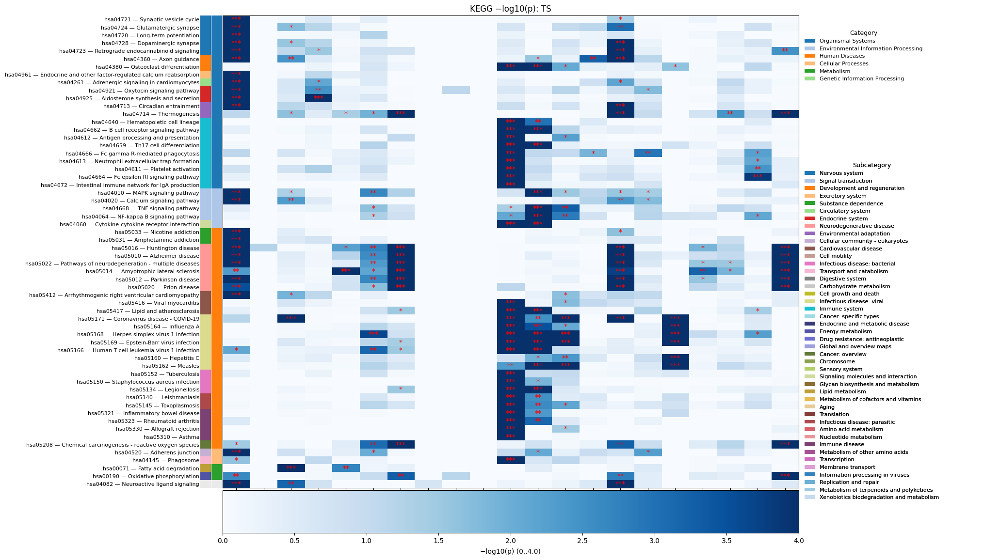

In [37]:
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/RNAseq_RISK_BrainRegions_STasaki/outputs/speakeasy_clusters/speakeasy_clusters_details_2.tsv"
KEGG_CSV = "/Volumes/Transcend/ROSMAP_WGCNA/kegg_rosmap_brains_se2_res2.csv"

logp_ts, meas_ts, stars_ts = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES,
    clean_TS=True,   # לפי הקוד שלך: מסנן ל-TS או ל-CT בהתאם לשם העמודה/תנאי
    cap=6.0, selection="global_top", K_GLOBAL=60, group='CT'
)
fig_ts = plot_kegg_log_heatmap_with_annots_NEW(
    logp_ts, stars_df=stars_ts, cap=4.0,
    title="KEGG −log10(p): TS",
    kegg_long_csv=KEGG_CSV,
    palette_cat=cat_map, palette_sub=sub_map,  # ← עקביות צבעים
)
plt.savefig("kegg_signed_se2_res2_heatmap_global60_newCT1412.png", dpi=220, bbox_inches='tight')
plt.show()

In [ ]:

# להרצה שנייה (CT) – משתמשים באותו mapping:
logp_ct, meas_ct, stars_ct = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES,
    clean_TS=True,  # או פילטר ל-CT לפי הקוד שלך (eq('CT'))
    cap=6.0, selection="global_top", K_GLOBAL=60
)
fig_ct = plot_kegg_log_heatmap_with_annots(
    logp_ct, stars_df=stars_ct, cap=6.0,
    title="KEGG −log10(p): CT",
    kegg_long_csv=KEGG_CSV,
    palette_cat=cat_map, palette_sub=sub_map,  # ← בדיוק אותם צבעים
)

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)


TypeError: plot_kegg_log_heatmap_with_annots() got an unexpected keyword argument 'palette_cat'

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2819507499.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[left_margin, 0.06, 0.98, 0.96])


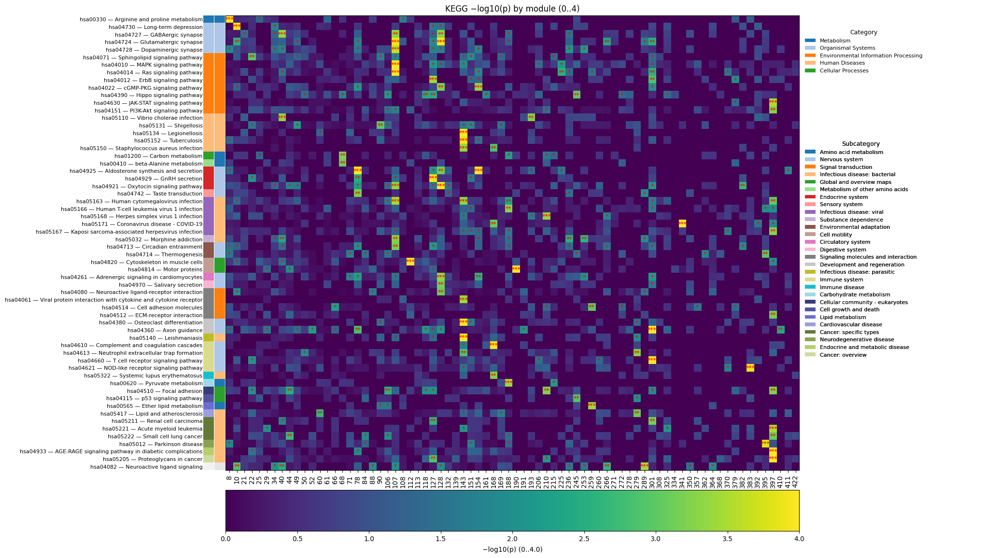

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
logp_kegg, meas_kegg, stars_kegg = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES, clean_TS=True,
    selection="global_top", K_GLOBAL=60,
    cap=4.0, star_from="p"
)


fig = plot_kegg_log_heatmap_with_annots(
    logp_kegg, stars_df=stars_kegg, cap=4.0,
    title="KEGG −log10(p) by module (0..4)",
    kegg_long_csv=KEGG_CSV,         
    legend_fontsize=8
)
plt.savefig("kegg_signed_heatmap_global60_new13.png", dpi=220, bbox_inches='tight')
plt.show()

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
logp_kegg, meas_kegg, stars_kegg = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES, clean_TS=True,
    selection="global_top", K_GLOBAL=60,
    cap=4.0, star_from="p"
)


fig = plot_kegg_log_heatmap_with_annots_new(
    logp_kegg, stars_df=stars_kegg, cap=4.0,
    title="KEGG −log10(p) by module (0..4)",
    kegg_long_csv=KEGG_CSV,         
    legend_fontsize=8
)
plt.savefig("kegg_signed_heatmap_global60_new13.png", dpi=220, bbox_inches='tight')
plt.show()

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)


NameError: name 'plot_kegg_log_heatmap_with_annots_new' is not defined

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_49828/2752551366.py:83: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_49828/2384282658.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[left_margin, 0.06, 0.98, 0.96])


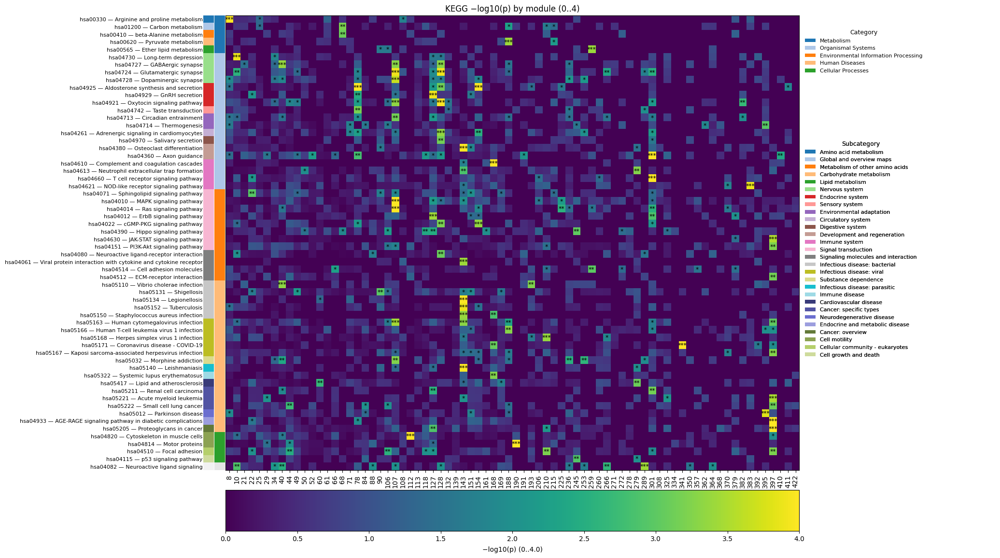

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"

logp_kegg, meas_kegg, stars_kegg = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES, clean_TS=True,
    selection="global_top", K_GLOBAL=60,
    cap=4.0,                  
    star_from="p"           
)

plot_kegg_log_heatmap_with_annots(
    logp_kegg, stars_df=stars_kegg, cap=4.0,
    title="KEGG −log10(p) by module (0..4)",
    kegg_long_csv=KEGG_CSV,
    legend_fontsize=8
)

plt.savefig("kegg_signed_heatmap_5000_global_new.png")
plt.show()

# NO labels

In [ ]:
from matplotlib.colors import to_rgb
from matplotlib.patches import Patch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_kegg_log_heatmap_with_annots_NEWW(
    logp_df, stars_df=None, cap=6.0, title="KEGG −log10(p)",
    kegg_long_csv=None, row_meta=None, figsize=(20, 30),
    legend_fontsize=8,
    strip_width=0.018,
    left_margin_with_labels=0.16,
    left_margin_no_labels=0.06,
    palette_cat=None,          # מילון קבוע: category -> צבע (r,g,b)
    palette_sub=None,          # מילון קבוע: subcategory -> צבע
    show_row_labels=True       # ← לכיבוי תוויות שורות
):
    # --- מטא לשורות ---
    if row_meta is None:
        if kegg_long_csv is not None:
            row_meta = _extract_row_meta_from_kegg(kegg_long_csv, logp_df.index.tolist())
        else:
            row_meta = pd.DataFrame(index=logp_df.index, columns=["category","subcategory"])

    # סידור לפי subcategory ואז category
    rm = row_meta.copy()
    def _norm_label(x): return np.nan if pd.isna(x) else str(x).strip()
    rm["subcategory"] = rm["subcategory"].map(_norm_label)
    rm["category"]    = rm["category"].map(_norm_label)

    sub_order = pd.Categorical(rm["subcategory"], categories=pd.unique(rm["subcategory"].dropna()), ordered=True)
    cat_order = pd.Categorical(rm["category"],    categories=pd.unique(rm["category"].dropna()),    ordered=True)
    rm["_subo"] = sub_order
    rm["_cato"] = cat_order
    order_idx = rm.sort_values(by=["_cato","_subo"], na_position="last", kind="mergesort").index

    logp_df  = logp_df.loc[order_idx]
    if stars_df is not None:
        stars_df = stars_df.reindex(index=order_idx, columns=logp_df.columns)
    row_meta = rm.loc[order_idx, ["category","subcategory"]]

    # בחירת מפות צבע (קבועות אם סופקו)
    def _palette_from(labels, fixed_map=None, default=(0.92,0.92,0.92)):
        if fixed_map is None or len(fixed_map) == 0:
            uniq = [x for x in pd.unique(labels) if pd.notna(x)]
            pool = (list(plt.cm.tab20.colors)+list(plt.cm.tab20b.colors)+
                    list(plt.cm.tab20c.colors)+list(plt.cm.Set3.colors))
            cmap = {lab: pool[i % len(pool)] for i, lab in enumerate(uniq)}
            lookup = lambda v: to_rgb(cmap.get(v, default))
        else:
            fixed_map = { _norm_label(k): tuple(v) for k,v in fixed_map.items() }
            cmap = fixed_map
            lookup = lambda v: to_rgb(fixed_map.get(_norm_label(v), default))
        arr = np.array([lookup(v) for v in labels])
        return cmap, arr

    cat_map, cat_colors = _palette_from(row_meta["category"],   fixed_map=palette_cat)
    sub_map, sub_colors = _palette_from(row_meta["subcategory"], fixed_map=palette_sub)

    # פריסה: [Subcategory | Category | Heatmap | Legend] + סקאלה למטה
    fig = plt.figure(figsize=figsize, constrained_layout=False)
    wr = [strip_width, strip_width, 1.0, 0.34]
    gs = fig.add_gridspec(
        nrows=2, ncols=len(wr),
        width_ratios=wr, height_ratios=[1.0, 0.01],
        wspace=0.004, hspace=0.08
    )

    ax_sub  = fig.add_subplot(gs[0,0])   # פס Subcategory (+ תוויות אם show_row_labels=True)
    ax_cat  = fig.add_subplot(gs[0,1])   # פס Category
    ax_hm   = fig.add_subplot(gs[0,2])   # ההיטמאפ
    ax_leg  = fig.add_subplot(gs[0,3]); ax_leg.axis("off")
    ax_cbar = fig.add_subplot(gs[1,2])   # סקלת צבע מתחת להיטמאפ

    # ההיטמאפ
    data = np.nan_to_num(logp_df.values, nan=0.0)
    im = ax_hm.imshow(data, aspect="auto", vmin=0.0, vmax=cap,cmap ='Blues')
    cb = fig.colorbar(im, cax=ax_cbar, orientation="horizontal")
    # Make a thiner colorbar
    cb.ax.tick_params(labelsize=8)
    cb.set_label(f"−log10(p) (0..{cap})", labelpad=6)

    ax_hm.set_yticks([])  # תוויות יופיעו בציר פס ה-Subcategory (אם בכלל)
    ax_hm.set_xticks(range(logp_df.shape[1]))
    ax_hm.set_xticklabels(logp_df.columns.astype(str), rotation=90)
    ax_hm.set_xlabel("Module")
    ax_hm.set_title(title)

    # פס Subcategory (עם/בלי תוויות)
    ax_sub.imshow(sub_colors.reshape(-1,1,3), aspect="auto")
    ax_sub.set_ylim(ax_hm.get_ylim())
    ax_sub.set_xticks([])
    if show_row_labels:
        ax_sub.set_yticks(range(logp_df.shape[0]))
        ax_sub.set_yticklabels(logp_df.index, fontsize=8)
        ax_sub.tick_params(axis="y", which="both", length=0, pad=1)
        for lab in ax_sub.get_yticklabels(): lab.set_horizontalalignment("right")
    else:
        ax_sub.set_yticks([])  # ← בלי שמות מסלולים
    for sp in ax_sub.spines.values(): sp.set_visible(False)

    # פס Category
    ax_cat.imshow(cat_colors.reshape(-1,1,3), aspect="auto")
    ax_cat.set_ylim(ax_hm.get_ylim())
    ax_cat.set_xticks([]); ax_cat.set_yticks([])
    for sp in ax_cat.spines.values(): sp.set_visible(False)

    # כוכביות
    if stars_df is not None:
        for i, term in enumerate(logp_df.index):
            for j, mod in enumerate(logp_df.columns):
                s = stars_df.loc[term, mod]
                if isinstance(s, str) and s:
                    ax_hm.text(j, i, s, ha="center", va="center", fontsize=9, color="red")

    # מקרא
    handles_cat = [Patch(facecolor=cat_map[k], edgecolor='none', label=str(k)) for k in cat_map]
    handles_sub = [Patch(facecolor=sub_map[k], edgecolor='none', label=str(k)) for k in sub_map]

    def place_leg(ax, handles, title, y_top):
        if not handles: return y_top
        est_h = 0.035 * (len(handles) + 2)
        leg = ax.legend(handles=handles, title=title, loc="upper left",
                        bbox_to_anchor=(0.0, y_top), fontsize=legend_fontsize,
                        title_fontsize=legend_fontsize+1, frameon=False)
        ax.add_artist(leg)
        return max(0.02, y_top - est_h)

    y = 0.98
    y = place_leg(ax_leg, handles_cat, "Category", y)
    place_leg(ax_leg, handles_sub, "Subcategory", y)

    # מרווח שמאלי קטן יותר כשאין תוויות
    left = left_margin_with_labels if show_row_labels else left_margin_no_labels
    plt.subplots_adjust(left=left, right=0.98, top=0.95, bottom=0.06, wspace=0.004, hspace=0.08)
    fig.tight_layout(rect=[left, 0.06, 0.98, 0.96])

    return fig


/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/3543185572.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[left, 0.06, 0.98, 0.96])


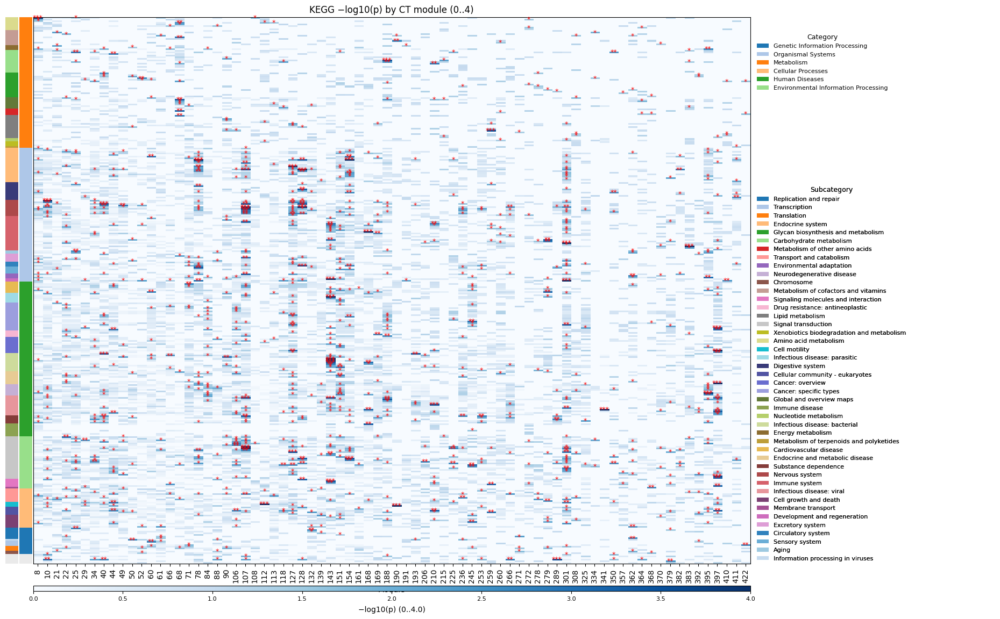

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
logp_kegg, meas_kegg, stars_kegg = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES, clean_TS=True,
    selection="global_top", K_GLOBAL=9999999999999,
    cap=4.0, star_from="p",
)


fig = plot_kegg_log_heatmap_with_annots_NEWW(
    logp_kegg, stars_df=stars_kegg, cap=4.0,
    title="KEGG −log10(p) by CT module (0..4)",
    kegg_long_csv=KEGG_CSV, figsize=(20, 12),
    legend_fontsize=8, show_row_labels=False,
    palette_cat=cat_map, palette_sub=sub_map  # ← עקביות צבעים

)
plt.savefig("kegg_signed_heatmap_global60_new15CT.png", dpi=220, bbox_inches='tight')
plt.show()

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/3543185572.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[left, 0.06, 0.98, 0.96])


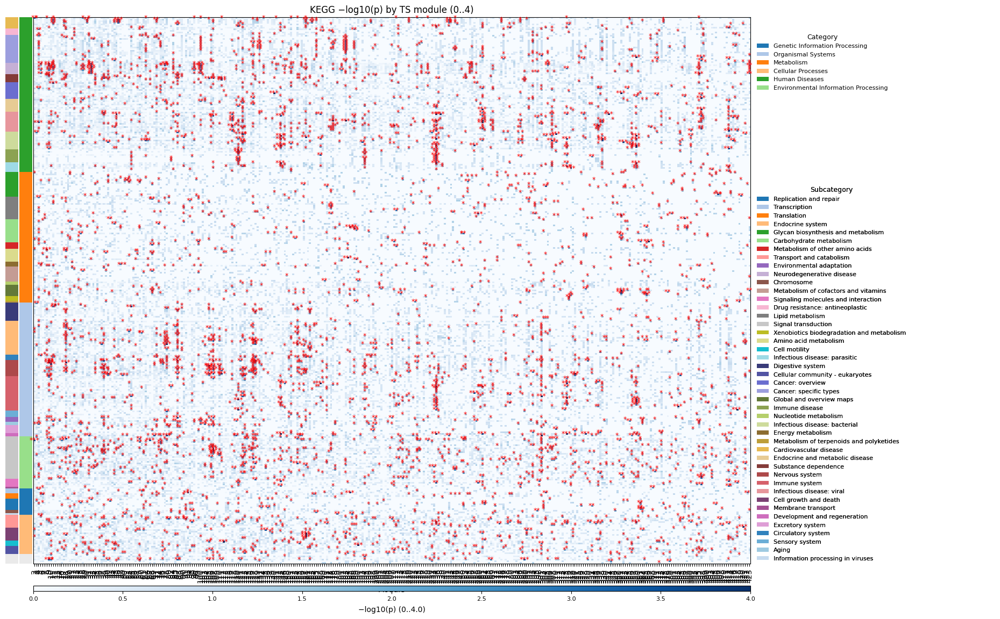

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full1.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
logp_kegg, meas_kegg, stars_kegg = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES, clean_TS=True,
    selection="global_top", K_GLOBAL=9999999999999,
    cap=4.0, star_from="p", group= 'TS'
)


fig = plot_kegg_log_heatmap_with_annots_NEWW(
    logp_kegg, stars_df=stars_kegg, cap=4.0,
    title="KEGG −log10(p) by TS module (0..4)",
    kegg_long_csv=KEGG_CSV, figsize=(20, 12),
    legend_fontsize=8, show_row_labels=False,
    palette_cat=cat_map, palette_sub=sub_map  # ← עקביות צבעים

)
plt.savefig("kegg_signed_heatmap_global60_new15TS.png", dpi=220, bbox_inches='tight')
plt.show()

In [ ]:
from matplotlib.colors import to_rgb
from matplotlib.patches import Patch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_kegg_log_heatmap_with_annots_clustered(
    logp_df, stars_df=None, cap=6.0, title="KEGG −log10(p)",
    kegg_long_csv=None, row_meta=None, figsize=(20, 30),
    legend_fontsize=8,
    strip_width=0.018,
    left_margin_with_labels=0.16,
    left_margin_no_labels=0.06,
    palette_cat=None,          # מילון קבוע: category -> (r,g,b)
    palette_sub=None,          # מילון קבוע: subcategory -> (r,g,b)
    show_row_labels=True,      # לכבות שמות מסלולים
    # ---- פרמטרים חדשים לקלאסטרינג ----
    cluster_cols=True,         # קלאסטרינג לעמודות (מודולים)
    fixed_col_order=None,      # אם מספקים, זה הסדר (אין קלאסטרינג לעמודות)
    col_metric="euclidean",
    col_method="average",
    cluster_rows=True,         # קלאסטרינג לשורות
    row_metric="euclidean",
    row_method="average",
    row_grouping=("category","subcategory")  # None => קלאסטרינג גלובלי; אחרת בתוך בלוקים
):
    """
    מחזיר: fig, row_order (list of row labels), col_order (list of column labels)
    """

    # --- מטא לשורות ---
    def _norm_label(x): return np.nan if pd.isna(x) else str(x).strip()

    if row_meta is None:
        if kegg_long_csv is not None:
            row_meta = _extract_row_meta_from_kegg(kegg_long_csv, logp_df.index.tolist())
        else:
            row_meta = pd.DataFrame(index=logp_df.index, columns=["category","subcategory"])

    rm = row_meta.copy()
    rm["subcategory"] = rm["subcategory"].map(_norm_label)
    rm["category"]    = rm["category"].map(_norm_label)

    # ---------- קלאסטרינג לעמודות (או סדר קבוע) ----------
    if fixed_col_order is not None:
        # מיישרים לעמודות הנתונות (ומתעלמים מ-cluster_cols)
        col_order = [c for c in fixed_col_order if c in logp_df.columns]
        if len(col_order) == 0:
            col_order = list(logp_df.columns)
    elif cluster_cols:
        # clustermap רק כדי לקבל סדר עמודות; לא מציגים
        gcol = sns.clustermap(
            np.nan_to_num(logp_df.values, nan=0.0),
            row_cluster=False, col_cluster=True,
            metric=col_metric, method=col_method,
            cmap="Blues", cbar=False, xticklabels=False, yticklabels=False
        )
        col_order = [logp_df.columns[i] for i in gcol.dendrogram_col.reordered_ind]
        plt.close(gcol.fig)
    else:
        col_order = list(logp_df.columns)

    # מיישרים את מטריצות הנתונים לעמודות החדשות
    logp_df = logp_df[col_order]
    if stars_df is not None:
        stars_df = stars_df.reindex(index=logp_df.index, columns=col_order)

    # ---------- קלאסטרינג לשורות ----------
    if cluster_rows:
        if row_grouping is None:
            # קלאסטרינג גלובלי לכל השורות
            grow = sns.clustermap(
                np.nan_to_num(logp_df.values, nan=0.0),
                row_cluster=True, col_cluster=False,
                metric=row_metric, method=row_method,
                cmap="Blues", cbar=False, xticklabels=False, yticklabels=False
            )
            row_order = [logp_df.index[i] for i in grow.dendrogram_row.reordered_ind]
            plt.close(grow.fig)
        else:
            # שומרים סדר בלוקים category->subcategory ומבצעים קלאסטרינג בתוך כל בלוק
            # סדר בלוקים דטרמיניסטי לפי הופעה
            rm["_subo"] = pd.Categorical(rm["subcategory"],
                                         categories=pd.unique(rm["subcategory"].dropna()),
                                         ordered=True)
            rm["_cato"] = pd.Categorical(rm["category"],
                                         categories=pd.unique(rm["category"].dropna()),
                                         ordered=True)
            grp_keys = list(row_grouping)  # למשל ["subcategory","category"]

            for k in grp_keys:
                cats = pd.unique(rm[k].dropna())
                rm[f"__ord_{k}__"] = pd.Categorical(rm[k], categories=cats, ordered=True)

            # ממיינים את rm לפי סדר המפתחות שציינת
            ord_cols = [f"__ord_{k}__" for k in grp_keys]
            sorted_rm = rm.sort_values(by=ord_cols, na_position="last", kind="mergesort")
            
            order_parts = []
            for keys, sub_rm in sorted_rm.groupby(grp_keys, sort=False):
                idxs = sub_rm.index
                sub = logp_df.loc[idxs]
                if len(sub) > 1:
                    g = sns.clustermap(
                        np.nan_to_num(sub.values, nan=0.0),
                        row_cluster=True, col_cluster=False,
                        metric=row_metric, method=row_method,
                        cmap="Blues", cbar=False, xticklabels=False, yticklabels=False
                    )
                    reord = [sub.index[i] for i in g.dendrogram_row.reordered_ind]
                    plt.close(g.fig)
                    order_parts.extend(reord)
                else:
                    order_parts.extend(list(idxs))
            row_order = order_parts
    else:
        row_order = list(logp_df.index)

    # יישור סופי
    logp_df = logp_df.loc[row_order, col_order]
    if stars_df is not None:
        stars_df = stars_df.reindex(index=row_order, columns=col_order)
    rm = rm.loc[row_order, ["category","subcategory"]]

    # ---------- מפות צבע (קבועות אם סופקו) ----------
    def _palette_from(labels, fixed_map=None, default=(0.92,0.92,0.92)):
        if fixed_map is None or len(fixed_map) == 0:
            uniq = [x for x in pd.unique(labels) if pd.notna(x)]
            pool = (list(plt.cm.tab20.colors)+list(plt.cm.tab20b.colors)+
                    list(plt.cm.tab20c.colors)+list(plt.cm.Set3.colors))
            cmap = {lab: pool[i % len(pool)] for i, lab in enumerate(uniq)}
            lookup = lambda v: to_rgb(cmap.get(v, default))
        else:
            fixed_map = { _norm_label(k): tuple(v) for k,v in fixed_map.items() }
            cmap = fixed_map
            lookup = lambda v: to_rgb(fixed_map.get(_norm_label(v), default))
        arr = np.array([lookup(v) for v in labels])
        return cmap, arr

    cat_map, cat_colors = _palette_from(rm["category"],   fixed_map=palette_cat)
    sub_map, sub_colors = _palette_from(rm["subcategory"], fixed_map=palette_sub)

    # ---------- פריסה וציור ----------
    fig = plt.figure(figsize=figsize, constrained_layout=False)
    wr = [strip_width, strip_width, 1.0, 0.34]
    gs = fig.add_gridspec(
        nrows=2, ncols=len(wr),
        width_ratios=wr, height_ratios=[1.0, 0.01],
        wspace=0.004, hspace=0.08
    )

    ax_sub  = fig.add_subplot(gs[0,0])   # פס Subcategory (+ תוויות אם show_row_labels=True)
    ax_cat  = fig.add_subplot(gs[0,1])   # פס Category
    ax_hm   = fig.add_subplot(gs[0,2])   # ההיטמאפ
    ax_leg  = fig.add_subplot(gs[0,3]); ax_leg.axis("off")
    ax_cbar = fig.add_subplot(gs[1,2])   # סקלת צבע מתחת להיטמאפ

    # ההיטמאפ
    data = np.nan_to_num(logp_df.values, nan=0.0)
    im = ax_hm.imshow(data, aspect="auto", vmin=0.0, vmax=cap, cmap='Blues')
    cb = fig.colorbar(im, cax=ax_cbar, orientation="horizontal")
    cb.ax.tick_params(labelsize=8)
    cb.set_label(f"−log10(p) (0..{cap})", labelpad=6)

    ax_hm.set_yticks([])  # תוויות יופיעו בפס ה-Subcategory אם show_row_labels=True
    ax_hm.set_xticks(range(logp_df.shape[1]))
    ax_hm.set_xticklabels(logp_df.columns.astype(str), rotation=90)
    ax_hm.set_xlabel("Module")
    ax_hm.set_title(title)

    # פס Subcategory (עם/בלי תוויות)
    ax_sub.imshow(sub_colors.reshape(-1,1,3), aspect="auto")
    ax_sub.set_ylim(ax_hm.get_ylim())
    ax_sub.set_xticks([])
    if show_row_labels:
        ax_sub.set_yticks(range(logp_df.shape[0]))
        ax_sub.set_yticklabels(logp_df.index, fontsize=8)
        ax_sub.tick_params(axis="y", which="both", length=0, pad=1)
        for lab in ax_sub.get_yticklabels(): lab.set_horizontalalignment("right")
    else:
        ax_sub.set_yticks([])
    for sp in ax_sub.spines.values(): sp.set_visible(False)

    # פס Category
    ax_cat.imshow(cat_colors.reshape(-1,1,3), aspect="auto")
    ax_cat.set_ylim(ax_hm.get_ylim())
    ax_cat.set_xticks([]); ax_cat.set_yticks([])
    for sp in ax_cat.spines.values(): sp.set_visible(False)

    # כוכביות
    if stars_df is not None:
        for i, term in enumerate(logp_df.index):
            for j, mod in enumerate(logp_df.columns):
                s = stars_df.loc[term, mod]
                if isinstance(s, str) and s:
                    ax_hm.text(j, i, s, ha="center", va="center", fontsize=11, color="red")

    # מקרא
    handles_cat = [Patch(facecolor=cat_map[k], edgecolor='none', label=str(k)) for k in cat_map]
    handles_sub = [Patch(facecolor=sub_map[k], edgecolor='none', label=str(k)) for k in sub_map]

    def place_leg(ax, handles, title, y_top):
        if not handles: return y_top
        est_h = 0.035 * (len(handles) + 2)
        leg = ax.legend(handles=handles, title=title, loc="upper left",
                        bbox_to_anchor=(0.0, y_top), fontsize=legend_fontsize,
                        title_fontsize=legend_fontsize+1, frameon=False)
        ax.add_artist(leg)
        return max(0.02, y_top - est_h)

    y = 0.98
    y = place_leg(ax_leg, handles_cat, "Category", y)
    place_leg(ax_leg, handles_sub, "Subcategory", y)

    # מרווח שמאלי קטן יותר כשאין תוויות
    left = left_margin_with_labels if show_row_labels else left_margin_no_labels
    plt.subplots_adjust(left=left, right=0.98, top=0.95, bottom=0.06, wspace=0.004, hspace=0.08)
    fig.tight_layout(rect=[left, 0.06, 0.98, 0.96])

    return fig, row_order, col_order


/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performa

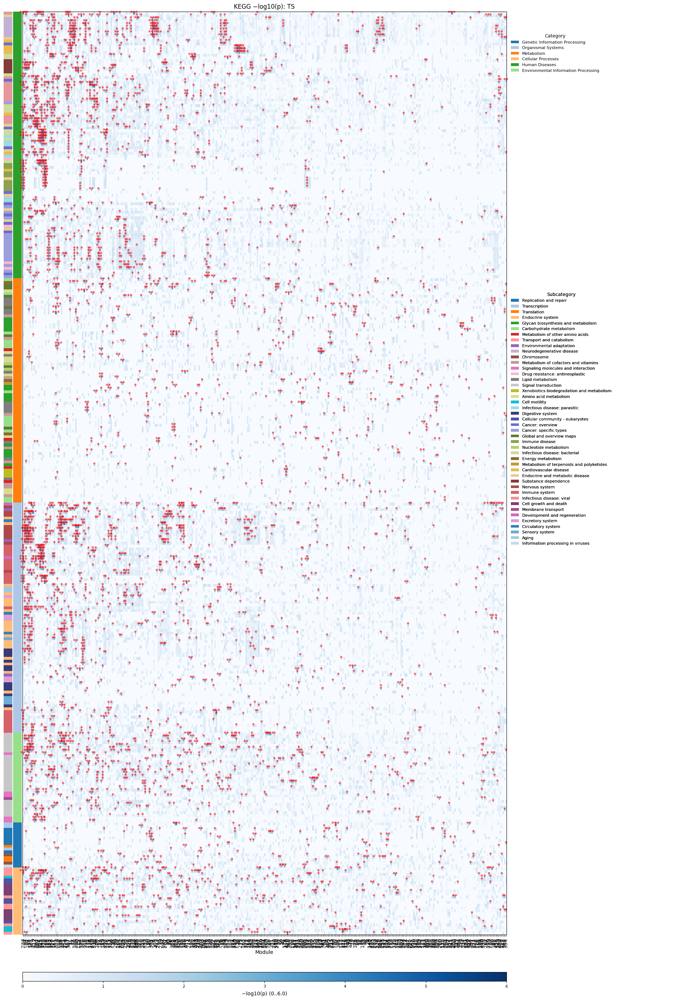

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full1.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
logp_kegg, meas_kegg, stars_kegg = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES, clean_TS=True,
    selection="global_top", K_GLOBAL=9999999999999,
    cap=4.0, star_from="p", group= 'TS'
)

fig, row_order, col_order = plot_kegg_log_heatmap_with_annots_clustered(
    logp_kegg, stars_df=stars_kegg, cap=6.0, title="KEGG −log10(p): TS",
    kegg_long_csv=KEGG_CSV,
    palette_cat=cat_map, palette_sub=sub_map,
    cluster_cols=True, cluster_rows=True,show_row_labels=False,
    row_grouping=(['category']),   # או None לקלאסטר גלובלי
)

plt.savefig("kegg_signed_heatmap_global60_new16TSClusteredCat123.png", dpi=330, bbox_inches='tight')
plt.show()

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/3738274594.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clusters[c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0)


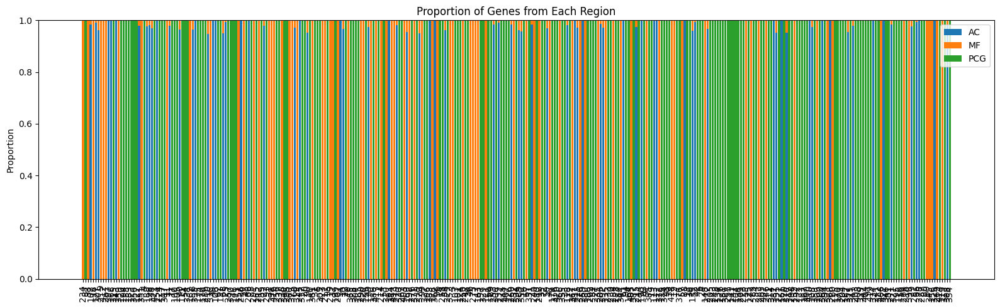

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import plotly.express as px
import plotly.graph_objects as go

KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full1.csv"
kegg_ids = pd.read_csv(KEGG_CSV, engine="python", on_bad_lines="skip")["Cluster"].unique().tolist()

cluster_details_full = pd.read_csv("/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv", sep="\t")

cluster_details_full_ct = cluster_details_full[cluster_details_full['Cluster Type'] == 'TS']

cluster_details_full_ct = cluster_details_full_ct[cluster_details_full_ct['Cluster ID'].isin(kegg_ids)]

clusters = cluster_details_full_ct[["Cluster ID", "AC", "MF", "PCG"]]

for c in ["AC", "MF", "PCG"]:
    clusters[c] = pd.to_numeric(clusters[c], errors='coerce').fillna(0)

clusters = clusters.sort_values(by="Cluster ID").reset_index(drop=True)

counts = clusters[["AC", "MF", "PCG"]]
props = counts.div(counts.sum(axis=1).replace(0, np.nan), axis=0).fillna(0)
props.insert(0, 'Cluster ID', clusters['Cluster ID'].astype(int).values)
# Make sure types match
col_order = [int(c) for c in col_order]  # or str(c) if yours are strings

# Keep only IDs present in props, and append any missing at the end (optional)
present = set(props['Cluster ID'].tolist())
ordered_ids = [c for c in col_order if c in present]
ordered_ids += [c for c in props['Cluster ID'] if c not in ordered_ids]

# Reorder props by the heatmap order
props_ord = props.set_index('Cluster ID').loc[ordered_ids].reset_index()

# Plot with the new order
fig, ax = plt.subplots(figsize=(16,5))
x = np.arange(len(props_ord))
ax.bar(x, props_ord['AC'], label='AC')
ax.bar(x, props_ord['MF'], bottom=props_ord['AC'], label='MF')
ax.bar(x, props_ord['PCG'], bottom=props_ord['AC'] + props_ord['MF'], label='PCG')
ax.set_xticks(x)
ax.set_xticklabels(props_ord['Cluster ID'].astype(str).tolist(), rotation=90)
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Genes from Each Region')
ax.legend(loc='upper right')
fig.tight_layout()
fig.savefig("rosmap_gene_proportionsTSclustCat.png", dpi=220, bbox_inches='tight')
plt.show()

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_49828/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_49828/3697407351.py:219: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[left, 0.06, 0.98, 0.96])


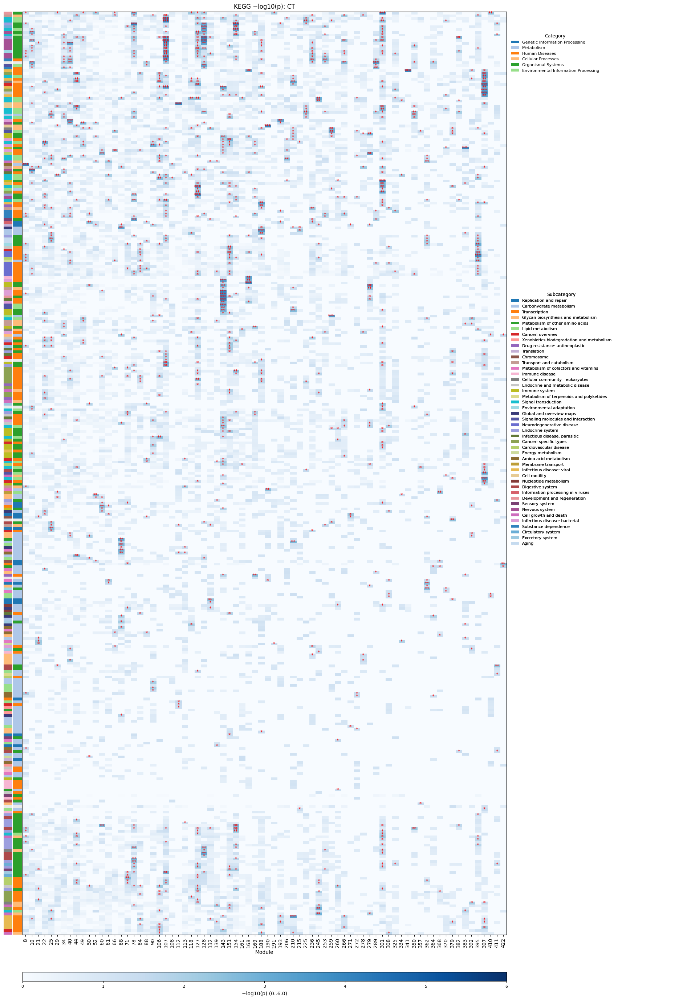

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full1.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
logp_kegg, meas_kegg, stars_kegg = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES, clean_TS=True,
    selection="global_top", K_GLOBAL=9999999999999,
    cap=4.0, star_from="p", group= 'TS'
)

fig, row_order, col_order = plot_kegg_log_heatmap_with_annots_clustered(
    logp_kegg, stars_df=stars_kegg, cap=6.0, title="KEGG −log10(p): CT",
    kegg_long_csv=KEGG_CSV,
    palette_cat=cat_map, palette_sub=sub_map,
    cluster_cols=False, cluster_rows=True,show_row_labels=False,
    row_grouping=None,   # או None לקלאסטר גלובלי
)

plt.savefig("kegg_signed_heatmap_global60_new16TS.png", dpi=220, bbox_inches='tight')
plt.show()

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_49828/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_49828/3697407351.py:219: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[left, 0.06, 0.98, 0.96])


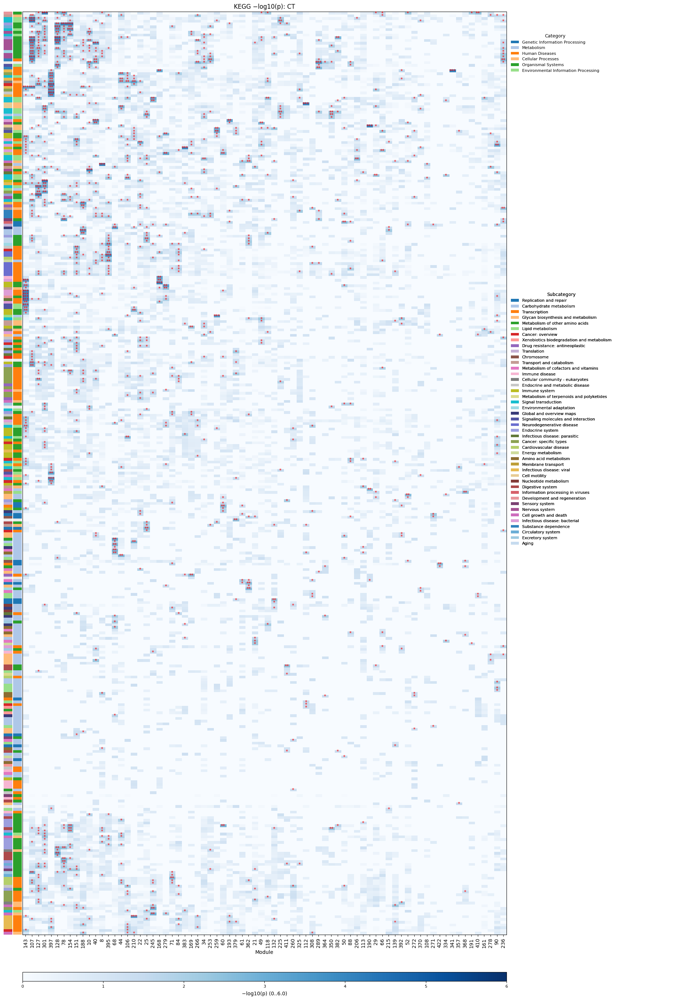

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
logp_kegg, meas_kegg, stars_kegg = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES, clean_TS=True,
    selection="global_top", K_GLOBAL=9999999999999,
    cap=4.0, star_from="p", group= 'TS'
)

fig, row_order, col_order = plot_kegg_log_heatmap_with_annots_clustered(
    logp_kegg, stars_df=stars_kegg, cap=6.0, title="KEGG −log10(p): CT",
    kegg_long_csv=KEGG_CSV,
    palette_cat=cat_map, palette_sub=sub_map,
    cluster_cols=True, cluster_rows=True,show_row_labels=False,
    row_grouping=None,   # או None לקלאסטר גלובלי
)

plt.savefig("kegg_signed_heatmap_global60_new16TS.png", dpi=220, bbox_inches='tight')
plt.show()

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2571248091.py:219: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[left, 0.06, 0.98, 0.96])


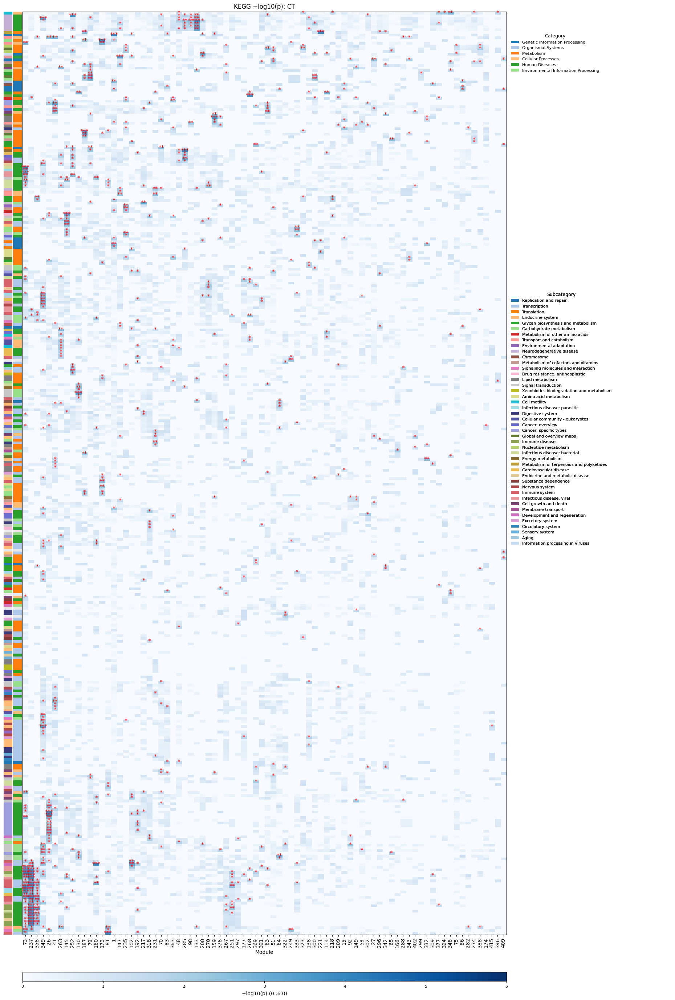

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full1.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"
logp_kegg, meas_kegg, stars_kegg = build_kegg_logp_matrix(
    KEGG_CSV,
    modules_details=MODULES, clean_TS=True,
    selection="global_top", K_GLOBAL=9999999999999,
    cap=4.0, star_from="p", group= 'CT'
)

fig, row_order, col_order = plot_kegg_log_heatmap_with_annots_clustered(
    logp_kegg, stars_df=stars_kegg, cap=6.0, title="KEGG −log10(p): CT",
    kegg_long_csv=KEGG_CSV,
    palette_cat=cat_map, palette_sub=sub_map,
    cluster_cols=True, cluster_rows=True,show_row_labels=False,
    row_grouping=None,   # או None לקלאסטר גלובלי
)

plt.savefig("kegg_signed_heatmap_global60_new16CT1.png", dpi=220, bbox_inches='tight')
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
from matplotlib.patches import Patch
import seaborn as sns

# ------------------------------
# 1) עזר: חילוץ מטא לשיוך קטגוריה/סאבקטגוריה לשמות שורות
# ------------------------------
def _std_cols(df):
    low = {c.lower(): c for c in df.columns}
    def pick(*keys):
        for k in keys:
            if k in low: return low[k]
        return None
    return {
        "Cluster":    pick("cluster"),
        "Description":pick("description","pathway","term","name"),
        "ID":         pick("id"),
        "category":   pick("category","catagory"),
        "subcategory":pick("subcategory","subcatagory","sub_category","sub-cat")
    }

def _extract_row_meta_from_kegg(kegg_long_csv, row_labels):
    """row_labels הם תוויות השורות (יכול להיות 'ID — Description' או רק Description)."""
    df = pd.read_csv(kegg_long_csv, engine="python", on_bad_lines="skip")
    cols = _std_cols(df)
    if cols["Description"] is None:
        return pd.DataFrame(index=row_labels, columns=["category","subcategory"])

    desc_col = cols["Description"]; cat_col = cols["category"]; sub_col = cols["subcategory"]

    meta = (df.dropna(subset=[desc_col])
              .drop_duplicates([desc_col])
              .rename(columns={
                  desc_col:"Description",
                  (cat_col or "category"):"category",
                  (sub_col or "subcategory"):"subcategory"
              })[["Description","category","subcategory"]])

    def parse_desc(lbl):
        if "—" in lbl: return lbl.split("—", 1)[-1].strip()
        if " - " in lbl: return lbl.split(" - ", 1)[-1].strip()
        return lbl.strip()

    desc_series = pd.Series([parse_desc(x) for x in row_labels], index=row_labels, name="Description")
    row_meta = desc_series.to_frame().merge(meta, on="Description", how="left").set_index(desc_series.index)
    return row_meta[["category","subcategory"]]

# ------------------------------
# 2) עזר: בניית מפות צבעים קבועות מה-KEGG המלא
# ------------------------------
def build_annotation_palettes_from_kegg(kegg_long_csv, base_pal=None):
    """
    מחזיר שני מילונים: (palette_cat, palette_sub) כך שהצבעים עקביים בין TS/CT.
    """
    df = pd.read_csv(kegg_long_csv, engine="python", on_bad_lines="skip")
    cols = _std_cols(df)
    cat = df[cols["category"]] if cols["category"] in df.columns else pd.Series(dtype=object)
    sub = df[cols["subcategory"]] if cols["subcategory"] in df.columns else pd.Series(dtype=object)

    def _uniq(vals):
        return [x for x in pd.unique(vals.astype(str).str.strip()) if (x!='nan') and (x!='None')]

    uniq_cat = _uniq(cat) if not cat.empty else []
    uniq_sub = _uniq(sub) if not sub.empty else []

    if base_pal is None:
        pool = (list(plt.cm.tab20.colors)+list(plt.cm.tab20b.colors)+
                list(plt.cm.tab20c.colors)+list(plt.cm.Set3.colors))
    else:
        pool = list(base_pal)

    palette_cat = {lab: pool[i % len(pool)] for i, lab in enumerate(uniq_cat)}
    palette_sub = {lab: pool[i % len(pool)] for i, lab in enumerate(uniq_sub)}
    return palette_cat, palette_sub

# ------------------------------
# 3) עזר: סדרי קלאסטרינג (עם/בלי חלוקה לבלוקים לפי קטגוריה/סאבקטגוריה)
# ------------------------------
def _cluster_orders(logp_df, row_meta,
                    cluster_cols=True, col_metric="euclidean", col_method="average",
                    cluster_rows=True, row_metric="euclidean", row_method="average",
                    row_grouping=("category","subcategory")):
    """מחזיר row_order, col_order וגם נקודות חוצץ לקווי הפרדה בין קטגוריות."""
    # ---- עמודות ----
    if cluster_cols:
        gcol = sns.clustermap(
            np.nan_to_num(logp_df.values, nan=0.0),
            row_cluster=False, col_cluster=True,
            metric=col_metric, method=col_method,
            cmap="Blues", cbar=False, xticklabels=False, yticklabels=False
        )
        col_order = [logp_df.columns[i] for i in gcol.dendrogram_col.reordered_ind]
        plt.close(gcol.fig)
    else:
        col_order = list(logp_df.columns)

    # ---- שורות ----
    rm = row_meta.copy()
    def _norm(x): return np.nan if pd.isna(x) else str(x).strip()
    rm["category"]    = rm["category"].map(_norm)
    rm["subcategory"] = rm["subcategory"].map(_norm)

    sep_positions = []  # חוצצים בין קטגוריות (לאורך ציר y) להדגשה

    if not cluster_rows:
        row_order = list(logp_df.index)
    else:
        if row_grouping is None:
            grow = sns.clustermap(
                np.nan_to_num(logp_df.values, nan=0.0),
                row_cluster=True, col_cluster=False,
                metric=row_metric, method=row_method,
                cmap="Blues", cbar=False, xticklabels=False, yticklabels=False
            )
            row_order = [logp_df.index[i] for i in grow.dendrogram_row.reordered_ind]
            plt.close(grow.fig)
        else:
            # סדר בלוקים לפי הופעה, קלאסטרינג בתוך כל בלוק
            keys = list(row_grouping)
            for k in keys:
                cats = pd.unique(rm[k].dropna())
                rm[f"__ord_{k}__"] = pd.Categorical(rm[k], categories=cats, ordered=True)

            sorted_rm = rm.sort_values(by=[f"__ord_{k}__" for k in keys],
                                       na_position="last", kind="mergesort")

            row_order = []
            last_cat = None; cum_len = 0
            for grp_keys, sub_rm in sorted_rm.groupby(keys, sort=False):
                idxs = sub_rm.index
                sub  = logp_df.loc[idxs]
                if len(sub) > 1:
                    g = sns.clustermap(
                        np.nan_to_num(sub.values, nan=0.0),
                        row_cluster=True, col_cluster=False,
                        metric=row_metric, method=row_method,
                        cmap="Blues", cbar=False, xticklabels=False, yticklabels=False
                    )
                    reord = [sub.index[i] for i in g.dendrogram_row.reordered_ind]
                    plt.close(g.fig)
                else:
                    reord = list(idxs)
                # קווי הפרדה בין קטגוריות ראשיות:
                curr_cat = sub_rm["category"].iloc[0]
                if last_cat is None:
                    last_cat = curr_cat
                elif curr_cat != last_cat:
                    sep_positions.append(cum_len - 0.5)  # קו בין בלוקים
                    last_cat = curr_cat
                row_order.extend(reord)
                cum_len += len(reord)

    return row_order, col_order, sep_positions

# ------------------------------
# 4) עזר: גודל מודולים מה-Cluster Details (כדי לצייר היסט מעל ההיטמאפ)
# ------------------------------
def _read_module_sizes(modules_details_tsv):
    """
    מחזיר Series: index=Cluster ID (int), value=module size (מספר גנים).
    מנסה קודם 'Cluster Size'; אם אין – סכום AC+MF+PCG.
    """
    md = pd.read_csv(modules_details_tsv, sep="\t")
    id_col = "Cluster ID"
    size_col = None
    for cand in ["Cluster Size","Size","Genes","Gene Count","N_genes","total"]:
        if cand in md.columns:
            size_col = cand; break

    if size_col is None and all(c in md.columns for c in ["AC","MF","PCG"]):
        sizes = (pd.to_numeric(md["AC"], errors="coerce").fillna(0) +
                 pd.to_numeric(md["MF"], errors="coerce").fillna(0) +
                 pd.to_numeric(md["PCG"], errors="coerce").fillna(0))
    elif size_col is not None:
        sizes = pd.to_numeric(md[size_col], errors="coerce").fillna(0)
    else:
        # fallback
        sizes = pd.Series([0]*len(md))

    out = pd.Series(sizes.values, index=pd.to_numeric(md[id_col], errors="coerce").astype("Int64")).dropna()
    out.index = out.index.astype(int)
    return out

# ------------------------------
# 5) הפונקציה הראשית: יצוא PDF עם שני היטמאפים (TS ו-CT) בעמוד אחד
# ------------------------------
def export_kegg_ts_ct_enrichment_pdf(
    kegg_long_csv,
    modules_details_tsv,
    pdf_path="kegg_TS_CT_enrichment.pdf",
    # פרמטרים לבניית המטריצות
    selection="global_top", K_GLOBAL=60, N_PER_MODULE=4, P_THRESH=0.05,
    cap=6.0, star_from="p",
    # קלאסטרינג
    cluster_cols=True,  col_metric="euclidean", col_method="average",
    cluster_rows=True,  row_metric="euclidean", row_method="average",
    row_grouping=("category","subcategory"),    # None -> גלובלי
    # קוסמטיקה
    show_row_labels=False, legend_fontsize=8,
    strip_width=0.018,
    # היסט מעל כל היטמאפ
    add_hist=True, bar_color="#4477AA", bar_width=0.85, hist_height_ratio=0.18,
    # צבעים קבועים לאנוטציות (אם לא סופק – ייבנה מהקובץ המלא)
    palette_cat=None, palette_sub=None,
    # פונקציה לבניית מטריצת KEGG (יש לך אותה כבר)
    build_matrix_fn=None,
    # קבוצות הסינון
    ts_group="TS", ct_group="CT"
):
    """
    יוצר קובץ PDF בעמוד אחד:
      [היסט TS מעל | היטמאפ TS + פסי אנוטציה] || [היסט CT מעל | היטמאפ CT + פסי אנוטציה] || מקרא ימני
    מחזיר: (fig, ts_row_order, ts_col_order, ct_row_order, ct_col_order)
    """
    assert build_matrix_fn is not None, "אנא ספק את build_kegg_logp_matrix דרך הפרמטר build_matrix_fn"

    # --- בנייה ל-TS ול-CT ---
    logp_ts, meas_ts, stars_ts = build_matrix_fn(
        kegg_long_csv, modules_details=modules_details_tsv, clean_TS=True,
        cap=cap, selection=selection, K_GLOBAL=K_GLOBAL,
        N_PER_MODULE=N_PER_MODULE, P_THRESH=P_THRESH,
        star_from=star_from, group=ts_group
    )
    logp_ct, meas_ct, stars_ct = build_matrix_fn(
        kegg_long_csv, modules_details=modules_details_tsv, clean_TS=True,
        cap=cap, selection=selection, K_GLOBAL=K_GLOBAL,
        N_PER_MODULE=N_PER_MODULE, P_THRESH=P_THRESH,
        star_from=star_from, group=ct_group
    )

    # --- מטא לשורות ---
    row_meta_ts = _extract_row_meta_from_kegg(kegg_long_csv, logp_ts.index.tolist())
    row_meta_ct = _extract_row_meta_from_kegg(kegg_long_csv, logp_ct.index.tolist())

    # --- מפות צבע קבועות (אם לא נמסרו) ---
    if palette_cat is None or palette_sub is None:
        palette_cat_all, palette_sub_all = build_annotation_palettes_from_kegg(kegg_long_csv)
        if palette_cat is None: palette_cat = palette_cat_all
        if palette_sub is None: palette_sub = palette_sub_all

    # --- קלאסטרינג + קווי הפרדה בין קטגוריות (אם רלוונטי) ---
    ts_row_order, ts_col_order, ts_seps = _cluster_orders(
        logp_ts, row_meta_ts, cluster_cols, col_metric, col_method,
        cluster_rows, row_metric, row_method, row_grouping=row_grouping
    )
    ct_row_order, ct_col_order, ct_seps = _cluster_orders(
        logp_ct, row_meta_ct, cluster_cols, col_metric, col_method,
        cluster_rows, row_metric, row_method, row_grouping=row_grouping
    )

    # יישור לפי סדרים
    logp_ts = logp_ts.loc[ts_row_order, ts_col_order]
    logp_ct = logp_ct.loc[ct_row_order, ct_col_order]
    if stars_ts is not None: stars_ts = stars_ts.reindex(index=ts_row_order, columns=ts_col_order)
    if stars_ct is not None: stars_ct = stars_ct.reindex(index=ct_row_order, columns=ct_col_order)
    row_meta_ts = row_meta_ts.loc[ts_row_order]
    row_meta_ct = row_meta_ct.loc[ct_row_order]

    # --- צבעי אנוטציה לפי מפות קבועות ---
    def _arr_from_palette(labels, pal, default=(0.92,0.92,0.92)):
        def lk(v):
            if pd.isna(v): return default
            vv = str(v).strip()
            return pal.get(vv, default)
        return np.array([to_rgb(lk(v)) for v in labels])

    ts_cat_colors = _arr_from_palette(row_meta_ts["category"], palette_cat)
    ts_sub_colors = _arr_from_palette(row_meta_ts["subcategory"], palette_sub)
    ct_cat_colors = _arr_from_palette(row_meta_ct["category"], palette_cat)
    ct_sub_colors = _arr_from_palette(row_meta_ct["subcategory"], palette_sub)

    # --- היסטוגרמות מודולים (אופציונלי) ---
    mod_sizes = _read_module_sizes(modules_details_tsv) if add_hist else None
    ts_sizes = mod_sizes.reindex(pd.Index(ts_col_order).astype(int)).fillna(0).values if add_hist else None
    ct_sizes = mod_sizes.reindex(pd.Index(ct_col_order).astype(int)).fillna(0).values if add_hist else None

    # --- פריסת פיגרה: 3 שורות (Hist, HM, Cbar) × 7 עמודות (TS-sub, TS-cat, TS-HM, Gap, CT-sub, CT-cat, CT-HM) + Legend
    # פסים דקים לאנוטציה:
    strip = strip_width
    gap   = 0.05
    legend_w = 0.35
    # יחס גבהים
    hr_hist = hist_height_ratio if add_hist else 0.01
    hr_hm   = 1.00
    hr_cbar = 0.08

    fig = plt.figure(figsize=(22, 12), constrained_layout=False)
    gs = fig.add_gridspec(
        nrows=3, ncols=8,
        width_ratios=[strip, strip, 1.0, gap, strip, strip, 1.0, legend_w],
        height_ratios=[hr_hist, hr_hm, hr_cbar],
        wspace=0.02, hspace=0.12
    )

    # --- צירי TS ---
    ax_ts_hist = fig.add_subplot(gs[0,2]) if add_hist else fig.add_subplot(gs[0,2], frame_on=False)
    ax_ts_sub  = fig.add_subplot(gs[1,0]); ax_ts_cat = fig.add_subplot(gs[1,1]); ax_ts_hm = fig.add_subplot(gs[1,2])
    ax_ts_cbar = fig.add_subplot(gs[2,2])

    # --- צירי CT ---
    ax_ct_hist = fig.add_subplot(gs[0,6]) if add_hist else fig.add_subplot(gs[0,6], frame_on=False)
    ax_ct_sub  = fig.add_subplot(gs[1,4]); ax_ct_cat = fig.add_subplot(gs[1,5]); ax_ct_hm = fig.add_subplot(gs[1,6])
    ax_ct_cbar = fig.add_subplot(gs[2,6])

    # --- מקרא משותף ---
    ax_leg = fig.add_subplot(gs[:,7]); ax_leg.axis("off")

    # ---- ציור TS ----
    data_ts = np.nan_to_num(logp_ts.values, nan=0.0)
    im_ts = ax_ts_hm.imshow(data_ts, aspect="auto", vmin=0.0, vmax=cap, cmap="Blues")
    cb_ts = fig.colorbar(im_ts, cax=ax_ts_cbar, orientation="horizontal")
    cb_ts.ax.tick_params(labelsize=8)
    cb_ts.set_label(f"−log10(p) (0..{cap})", labelpad=5)

    ax_ts_hm.set_xticks(range(logp_ts.shape[1])); ax_ts_hm.set_xticklabels(logp_ts.columns.astype(str), rotation=90)
    ax_ts_hm.set_yticks([]); ax_ts_hm.set_title("TS KEGG enrichment")

    # קווי הפרדה בין קטגוריות (אם קלאסטרינג-בתוך-קטגוריות)
    if row_grouping is not None and len(ts_seps) > 0:
        for y in ts_seps:
            ax_ts_hm.hlines(y, -0.5, logp_ts.shape[1]-0.5, colors="k", linewidth=0.4, alpha=0.4)

    ax_ts_sub.imshow(ts_sub_colors.reshape(-1,1,3), aspect="auto")
    ax_ts_cat.imshow(ts_cat_colors.reshape(-1,1,3), aspect="auto")
    for ax in (ax_ts_sub, ax_ts_cat):
        ax.set_ylim(ax_ts_hm.get_ylim()); ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)

    # היסטוגרמה מעל TS
    if add_hist:
        x = np.arange(len(ts_col_order))
        ax_ts_hist.bar(x, ts_sizes, width=bar_width, color=bar_color)
        ax_ts_hist.set_xlim(-0.5, len(x)-0.5); ax_ts_hist.set_xticks([])
        ax_ts_hist.set_ylabel("Genes", fontsize=9)

    # ---- ציור CT ----
    data_ct = np.nan_to_num(logp_ct.values, nan=0.0)
    im_ct = ax_ct_hm.imshow(data_ct, aspect="auto", vmin=0.0, vmax=cap, cmap="Blues")
    cb_ct = fig.colorbar(im_ct, cax=ax_ct_cbar, orientation="horizontal")
    cb_ct.ax.tick_params(labelsize=8)
    cb_ct.set_label(f"−log10(p) (0..{cap})", labelpad=5)

    ax_ct_hm.set_xticks(range(logp_ct.shape[1])); ax_ct_hm.set_xticklabels(logp_ct.columns.astype(str), rotation=90)
    ax_ct_hm.set_yticks([]); ax_ct_hm.set_title("CT KEGG enrichment")

    if row_grouping is not None and len(ct_seps) > 0:
        for y in ct_seps:
            ax_ct_hm.hlines(y, -0.5, logp_ct.shape[1]-0.5, colors="k", linewidth=0.4, alpha=0.4)

    ax_ct_sub.imshow(ct_sub_colors.reshape(-1,1,3), aspect="auto")
    ax_ct_cat.imshow(ct_cat_colors.reshape(-1,1,3), aspect="auto")
    for ax in (ax_ct_sub, ax_ct_cat):
        ax.set_ylim(ax_ct_hm.get_ylim()); ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)

    if add_hist:
        x = np.arange(len(ct_col_order))
        ax_ct_hist.bar(x, ct_sizes, width=bar_width, color=bar_color)
        ax_ct_hist.set_xlim(-0.5, len(x)-0.5); ax_ct_hist.set_xticks([])
        ax_ct_hist.set_ylabel("Genes", fontsize=9)

    # ---- מקרא משותף (קטגוריות ואז סאבקטגוריות) ----
    handles_cat = [Patch(facecolor=palette_cat[k], edgecolor='none', label=str(k)) for k in palette_cat]
    handles_sub = [Patch(facecolor=palette_sub[k], edgecolor='none', label=str(k)) for k in palette_sub]

    def place_leg(ax, handles, title, y_top, fs):
        if not handles: return y_top
        est_h = 0.035 * (len(handles) + 2)
        leg = ax.legend(handles=handles, title=title, loc="upper left",
                        bbox_to_anchor=(0.0, y_top), fontsize=fs, title_fontsize=fs+1, frameon=False)
        ax.add_artist(leg)
        return max(0.02, y_top - est_h)

    y = 0.98
    y = place_leg(ax_leg, handles_cat, "Category", y, legend_fontsize)
    place_leg(ax_leg, handles_sub, "Subcategory", y, legend_fontsize)

    # מרווחים וניקיון
    plt.subplots_adjust(left=0.05, right=0.98, top=0.95, bottom=0.06, wspace=0.02, hspace=0.12)

    # שמירה ל-PDF
    fig.savefig(pdf_path, dpi=300, bbox_inches="tight")
    return fig, ts_row_order, ts_col_order, ct_row_order, ct_col_order


/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better perform

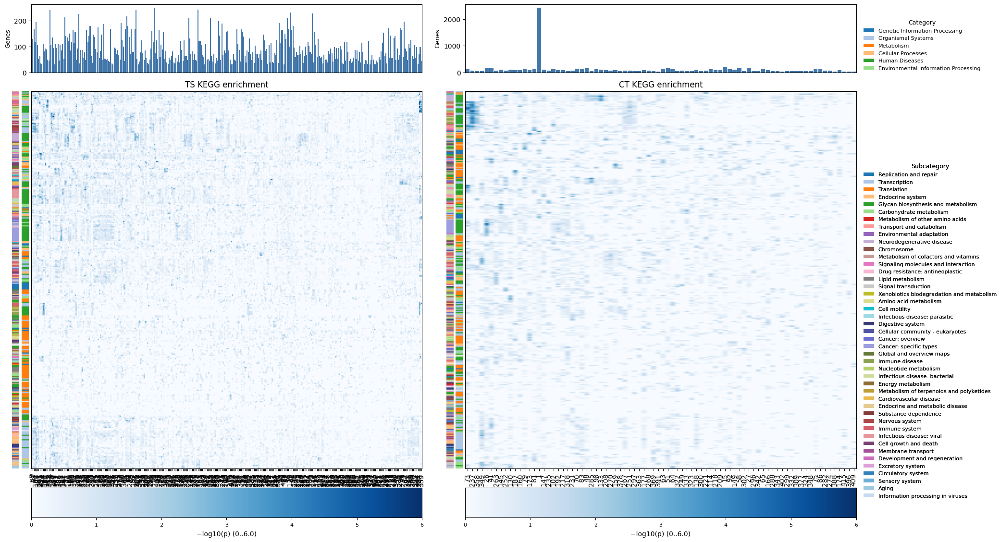

In [ ]:
KEGG_CSV = "/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full1.csv"
MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"

# נניח ש- build_kegg_logp_matrix היא הפונקציה שלך (עם הפרמטר group='TS'/'CT')
fig, ts_rows, ts_cols, ct_rows, ct_cols = export_kegg_ts_ct_enrichment_pdf(
    kegg_long_csv= KEGG_CSV,
    modules_details_tsv= MODULES,
    pdf_path="kegg_TS_CT_enrichmentNone123231.pdf",
    selection="global_top", K_GLOBAL=9999999999, cap=6.0,
    cluster_cols=True, cluster_rows=True,
    row_grouping=(None),   # קלאסטרינג בתוך קטגוריות + קווי הפרדה דקים
    add_hist=True,                             # היסט מעל כל היטמאפ
    build_matrix_fn=build_kegg_logp_matrix     # ← הפונקציה שלך לבניית המטריצות
)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
from matplotlib.patches import Patch
import seaborn as sns

# ---------- helpers you already have ----------
# _std_cols, _extract_row_meta_from_kegg, build_annotation_palettes_from_kegg,
# _cluster_orders, _read_module_sizes
# (משתמשים בהן כמו קודם – אל תמחק)

# ---- חדש: קריאת קומפוזיציית אזורים לכל מודול (AC/MF/PCG) ----

def _read_region_counts(modules_details_tsv, region_cols=("AC","MF","PCG")):
    """
    מחזיר DataFrame: index=Cluster ID (int), columns=region_cols, values=int (0 אם חסר),
    עם טיפול במודולים כפולים ויישור אינדקסים נכון.
    """
    md = pd.read_csv(modules_details_tsv, sep="\t")
    id_col = "Cluster ID"
    if id_col not in md.columns:
        raise ValueError("בקובץ MODULES חסרה עמודה 'Cluster ID'.")

    # אינדקס מודולים כספרות שלמות
    cid = pd.to_numeric(md[id_col], errors="coerce").astype("Int64")
    md = md.loc[cid.notna()].copy()
    cid = cid.loc[cid.notna()].astype(int)

    # בונים טבלה עם אינדקס = Cluster ID והעמודות המבוקשות (אם חסרה עמודה – מאפסים)
    data = {}
    for c in region_cols:
        if c in md.columns:
            vals = pd.to_numeric(md[c], errors="coerce").fillna(0).astype(int)
        else:
            vals = pd.Series(0, index=md.index, dtype="int64")
        data[c] = vals

    df = pd.DataFrame(data)

    # איחוד כפילויות של אותו מודול (אם יש) באמצעות סכימה
    df = df.groupby(level=0).sum()

    # טיפוסים סופיים וניקיון
    df.index = df.index.astype(int)
    for c in df.columns:
        df[c] = df[c].astype(int)

    return df

# ---- עזר: נרמול רשימות מודולים להסרה ----
def _normalize_mod_set(lst):
    if lst is None: return set()
    norm = set()
    for x in lst:
        try:
            norm.add(int(x))
        except Exception:
            # אם למשל " 12 " או "12a" – נתעלם ממה שלא ניתן להמיר
            try:
                norm.add(int(str(x).strip()))
            except Exception:
                pass
    return norm

# ------------------------------
#  הפונקציה הראשית: PDF עם TS ו-CT + אופציית הסרת מודולים + היסטוגרמה stacked
# ------------------------------
def export_kegg_ts_ct_enrichment_pdf(
    kegg_long_csv,
    modules_details_tsv,
    pdf_path="kegg_TS_CT_enrichment.pdf",
    # פרמטרים לבניית המטריצות
    selection="global_top", K_GLOBAL=60, N_PER_MODULE=4, P_THRESH=0.05,
    cap=6.0, star_from="p",
    # קלאסטרינג
    cluster_cols=True,  col_metric="euclidean", col_method="average",
    cluster_rows=True,  row_metric="euclidean", row_method="average",
    row_grouping=("category","subcategory"),    # None -> גלובלי
    # קוסמטיקה
    show_row_labels=False, legend_fontsize=8,
    strip_width=0.018,
    # היסט מעל כל היטמאפ
    add_hist=True, bar_color="#4477AA", bar_width=0.85, hist_height_ratio=0.18,
    # היסטוגרמה stacked לפי אזורים (AC/MF/PCG) במקום טוטאל
    hist_stacked_regions=False,
    hist_regions_cols=("AC","MF","PCG"),
    hist_region_colors=None,  # dict כמו {"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"}
    # צבעים קבועים לאנוטציות (אם לא סופק – ייבנה מהקובץ המלא)
    palette_cat=None, palette_sub=None,
    # פונקציה לבניית מטריצת KEGG (יש לך אותה כבר)
    build_matrix_fn=None,
    # קבוצות הסינון
    ts_group="TS", ct_group="CT",
    # ---- חדש: הסרת מודולים מרשימה (לפי IDs) לכל אחת מהקבוצות ----
    ts_exclude_modules=None,
    ct_exclude_modules=None
):
    """
    יוצר קובץ PDF בעמוד אחד עם היטמאפים ל-TS ול-CT.
    תוספות:
      - הסרת מודולים לפי רשימות (ts_exclude_modules / ct_exclude_modules)
      - היסטוגרמה Stacked לפי אזורים (hist_stacked_regions=True)
    מחזיר: (fig, ts_row_order, ts_col_order, ct_row_order, ct_col_order)
    """
    assert build_matrix_fn is not None, "אנא ספק את build_kegg_logp_matrix דרך הפרמטר build_matrix_fn"

    # --- בנייה ל-TS ול-CT ---
    logp_ts, meas_ts, stars_ts = build_matrix_fn(
        kegg_long_csv, modules_details=modules_details_tsv, clean_TS=True,
        cap=cap, selection=selection, K_GLOBAL=K_GLOBAL,
        N_PER_MODULE=N_PER_MODULE, P_THRESH=P_THRESH,
        star_from=star_from, group=ts_group
    )
    logp_ct, meas_ct, stars_ct = build_matrix_fn(
        kegg_long_csv, modules_details=modules_details_tsv, clean_TS=True,
        cap=cap, selection=selection, K_GLOBAL=K_GLOBAL,
        N_PER_MODULE=N_PER_MODULE, P_THRESH=P_THRESH,
        star_from=star_from, group=ct_group
    )

    # --- הסרת מודולים לפי רשימה (לפני קלאסטרינג) ---
    def _drop_cols(df, drop_set):
        if not drop_set: return df
        keep = []
        for c in df.columns:
            try:
                ci = int(c)
            except Exception:
                try:
                    ci = int(str(c).strip())
                except Exception:
                    ci = None
            if (ci is None) or (ci not in drop_set):
                keep.append(c)
        return df[keep] if len(keep) else df.iloc[:, :0]

    ts_drop = _normalize_mod_set(ts_exclude_modules)
    ct_drop = _normalize_mod_set(ct_exclude_modules)
    if len(ts_drop) > 0:
        logp_ts   = _drop_cols(logp_ts, ts_drop)
        if stars_ts is not None: stars_ts = stars_ts.reindex(index=logp_ts.index, columns=logp_ts.columns)
    if len(ct_drop) > 0:
        logp_ct   = _drop_cols(logp_ct, ct_drop)
        if stars_ct is not None: stars_ct = stars_ct.reindex(index=logp_ct.index, columns=logp_ct.columns)

    # --- מטא לשורות ---
    row_meta_ts = _extract_row_meta_from_kegg(kegg_long_csv, logp_ts.index.tolist())
    row_meta_ct = _extract_row_meta_from_kegg(kegg_long_csv, logp_ct.index.tolist())

    # --- מפות צבע קבועות (אם לא נמסרו) ---
    if palette_cat is None or palette_sub is None:
        palette_cat_all, palette_sub_all = build_annotation_palettes_from_kegg(kegg_long_csv)
        if palette_cat is None: palette_cat = palette_cat_all
        if palette_sub is None: palette_sub = palette_sub_all

    # --- קלאסטרינג + קווי הפרדה בין קטגוריות (אם רלוונטי) ---
    ts_row_order, ts_col_order, ts_seps = _cluster_orders(
        logp_ts, row_meta_ts, cluster_cols, col_metric, col_method,
        cluster_rows, row_metric, row_method, row_grouping=row_grouping
    )
    ct_row_order, ct_col_order, ct_seps = _cluster_orders(
        logp_ct, row_meta_ct, cluster_cols, col_metric, col_method,
        cluster_rows, row_metric, row_method, row_grouping=row_grouping
    )

    # יישור לפי סדרים
    logp_ts = logp_ts.loc[ts_row_order, ts_col_order]
    logp_ct = logp_ct.loc[ct_row_order, ct_col_order]
    if stars_ts is not None: stars_ts = stars_ts.reindex(index=ts_row_order, columns=ts_col_order)
    if stars_ct is not None: stars_ct = stars_ct.reindex(index=ct_row_order, columns=ct_col_order)
    row_meta_ts = row_meta_ts.loc[ts_row_order]
    row_meta_ct = row_meta_ct.loc[ct_row_order]

    # --- צבעי אנוטציה לפי מפות קבועות ---
    def _arr_from_palette(labels, pal, default=(0.92,0.92,0.92)):
        def lk(v):
            if pd.isna(v): return default
            vv = str(v).strip()
            return pal.get(vv, default)
        return np.array([to_rgb(lk(v)) for v in labels])

    ts_cat_colors = _arr_from_palette(row_meta_ts["category"], palette_cat)
    ts_sub_colors = _arr_from_palette(row_meta_ts["subcategory"], palette_sub)
    ct_cat_colors = _arr_from_palette(row_meta_ct["category"], palette_cat)
    ct_sub_colors = _arr_from_palette(row_meta_ct["subcategory"], palette_sub)

    # --- נתוני היסטוגרמות ---
    region_df = _read_region_counts(modules_details_tsv, hist_regions_cols) if add_hist and hist_stacked_regions else None
    mod_sizes = _read_module_sizes(modules_details_tsv) if add_hist and not hist_stacked_regions else None

    # --- פריסה כללית ---
    strip = strip_width; gap = 0.05; legend_w = 0.35
    hr_hist = (0.18 if add_hist else 0.01)
    hr_hm, hr_cbar = 1.00, 0.08

    fig = plt.figure(figsize=(22, 12), constrained_layout=False)
    gs = fig.add_gridspec(
        nrows=3, ncols=8,
        width_ratios=[strip, strip, 1.0, gap, strip, strip, 1.0, legend_w],
        height_ratios=[hr_hist, hr_hm, hr_cbar],
        wspace=0.02, hspace=0.12
    )

    # --- צירי TS ---
    ax_ts_hist = fig.add_subplot(gs[0,2]) if add_hist else fig.add_subplot(gs[0,2], frame_on=False)
    ax_ts_sub  = fig.add_subplot(gs[1,0]); ax_ts_cat = fig.add_subplot(gs[1,1]); ax_ts_hm = fig.add_subplot(gs[1,2])
    ax_ts_cbar = fig.add_subplot(gs[2,2])

    # --- צירי CT ---
    ax_ct_hist = fig.add_subplot(gs[0,6]) if add_hist else fig.add_subplot(gs[0,6], frame_on=False)
    ax_ct_sub  = fig.add_subplot(gs[1,4]); ax_ct_cat = fig.add_subplot(gs[1,5]); ax_ct_hm = fig.add_subplot(gs[1,6])
    ax_ct_cbar = fig.add_subplot(gs[2,6])

    # --- מקרא משותף ---
    ax_leg = fig.add_subplot(gs[:,7]); ax_leg.axis("off")

    # ---- ציור TS ----
    data_ts = np.nan_to_num(logp_ts.values, nan=0.0)
    im_ts = ax_ts_hm.imshow(data_ts, aspect="auto", vmin=0.0, vmax=cap, cmap="Blues")
    cb_ts = fig.colorbar(im_ts, cax=ax_ts_cbar, orientation="horizontal")
    cb_ts.ax.tick_params(labelsize=8)
    cb_ts.set_label(f"−log10(p) (0..{cap})", labelpad=5)

    ax_ts_hm.set_xticks(range(logp_ts.shape[1])); ax_ts_hm.set_xticklabels(logp_ts.columns.astype(str), rotation=90)
    ax_ts_hm.set_yticks([]); ax_ts_hm.set_title("TS KEGG enrichment")

    if row_grouping is not None and len(ts_seps) > 0:
        for y in ts_seps:
            ax_ts_hm.hlines(y, -0.5, logp_ts.shape[1]-0.5, colors="k", linewidth=0.4, alpha=0.4)

    ax_ts_sub.imshow(ts_sub_colors.reshape(-1,1,3), aspect="auto")
    ax_ts_cat.imshow(ts_cat_colors.reshape(-1,1,3), aspect="auto")
    for ax in (ax_ts_sub, ax_ts_cat):
        ax.set_ylim(ax_ts_hm.get_ylim()); ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)

    # היסטוגרמה TS
    if add_hist:
        x = np.arange(len(logp_ts.columns))
        if hist_stacked_regions and region_df is not None:
            # סדר עמודות לפי ts_col_order
            rsel = region_df.reindex(pd.Index(logp_ts.columns).astype(int)).fillna(0)
            # צבעים
            if hist_region_colors is None:
                hist_region_colors = {"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"}
            bottom = np.zeros(len(x))
            for rc in hist_regions_cols:
                vals = rsel[rc].values if rc in rsel.columns else np.zeros(len(x))
                ax_ts_hist.bar(x, vals, width=bar_width, color=hist_region_colors.get(rc, None), bottom=bottom, label=rc)
                bottom += vals
            ax_ts_hist.legend(frameon=False, fontsize=8, ncol=len(hist_regions_cols))
        else:
            sizes = (mod_sizes.reindex(pd.Index(logp_ts.columns).astype(int)).fillna(0).values
                     if mod_sizes is not None else np.zeros(len(x)))
            ax_ts_hist.bar(x, sizes, width=bar_width, color=bar_color)
        ax_ts_hist.set_xlim(-0.5, len(x)-0.5); ax_ts_hist.set_xticks([]); ax_ts_hist.set_ylabel("Genes", fontsize=9)

    # ---- ציור CT ----
    data_ct = np.nan_to_num(logp_ct.values, nan=0.0)
    im_ct = ax_ct_hm.imshow(data_ct, aspect="auto", vmin=0.0, vmax=cap, cmap="Blues")
    cb_ct = fig.colorbar(im_ct, cax=ax_ct_cbar, orientation="horizontal")
    cb_ct.ax.tick_params(labelsize=8)
    cb_ct.set_label(f"−log10(p) (0..{cap})", labelpad=5)

    ax_ct_hm.set_xticks(range(logp_ct.shape[1])); ax_ct_hm.set_xticklabels(logp_ct.columns.astype(str), rotation=90)
    ax_ct_hm.set_yticks([]); ax_ct_hm.set_title("CT KEGG enrichment")

    if row_grouping is not None and len(ct_seps) > 0:
        for y in ct_seps:
            ax_ct_hm.hlines(y, -0.5, logp_ct.shape[1]-0.5, colors="k", linewidth=0.4, alpha=0.4)

    ax_ct_sub.imshow(ct_sub_colors.reshape(-1,1,3), aspect="auto")
    ax_ct_cat.imshow(ct_cat_colors.reshape(-1,1,3), aspect="auto")
    for ax in (ax_ct_sub, ax_ct_cat):
        ax.set_ylim(ax_ct_hm.get_ylim()); ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)

    if add_hist:
        x = np.arange(len(logp_ct.columns))
        if hist_stacked_regions and region_df is not None:
            rsel = region_df.reindex(pd.Index(logp_ct.columns).astype(int)).fillna(0)
            if hist_region_colors is None:
                hist_region_colors = {"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"}
            bottom = np.zeros(len(x))
            for rc in hist_regions_cols:
                vals = rsel[rc].values if rc in rsel.columns else np.zeros(len(x))
                ax_ct_hist.bar(x, vals, width=bar_width, color=hist_region_colors.get(rc, None), bottom=bottom, label=rc)
                bottom += vals
            ax_ct_hist.legend(frameon=False, fontsize=8, ncol=len(hist_regions_cols))
        else:
            sizes = (mod_sizes.reindex(pd.Index(logp_ct.columns).astype(int)).fillna(0).values
                     if mod_sizes is not None else np.zeros(len(x)))
            ax_ct_hist.bar(x, sizes, width=bar_width, color=bar_color)
        ax_ct_hist.set_xlim(-0.5, len(x)-0.5); ax_ct_hist.set_xticks([]); ax_ct_hist.set_ylabel("Genes", fontsize=9)

    # ---- מקרא משותף (קטגוריות ואז סאבקטגוריות) ----
    handles_cat = [Patch(facecolor=palette_cat[k], edgecolor='none', label=str(k)) for k in palette_cat]
    handles_sub = [Patch(facecolor=palette_sub[k], edgecolor='none', label=str(k)) for k in palette_sub]

    def place_leg(ax, handles, title, y_top, fs):
        if not handles: return y_top
        est_h = 0.035 * (len(handles) + 2)
        leg = ax.legend(handles=handles, title=title, loc="upper left",
                        bbox_to_anchor=(0.0, y_top), fontsize=fs, title_fontsize=fs+1, frameon=False)
        ax.add_artist(leg)
        return max(0.02, y_top - est_h)

    ax_leg = fig.axes[-1]  # כבר הוגדר למעלה
    y = 0.98
    y = place_leg(ax_leg, handles_cat, "Category", y, legend_fontsize)
    place_leg(ax_leg, handles_sub, "Subcategory", y, legend_fontsize)

    # מרווחים וניקיון
    plt.subplots_adjust(left=0.05, right=0.98, top=0.95, bottom=0.06, wspace=0.02, hspace=0.12)

    # שמירה ל-PDF
    fig.savefig(pdf_path, dpi=300, bbox_inches="tight")
    return fig, ts_row_order, ts_col_order, ct_row_order, ct_col_order


In [ ]:
palette_cat, palette_sub = build_annotation_palettes_from_kegg(KEGG_CSV)

fig, ts_rows, ts_cols, ct_rows, ct_cols = export_kegg_ts_ct_enrichment_pdf(
    kegg_long_csv=KEGG_CSV,
    modules_details_tsv=MODULES,
    pdf_path="kegg_TS_CT_enrichment_No_one_NONE14123.pdf",
    selection="global_top", K_GLOBAL=99999999, cap=6.0,
    cluster_cols=True, cluster_rows=True, row_grouping=(None),
    add_hist=True,
    hist_stacked_regions=True,                 # ← היסטוגרמה מוערמת לפי AC/MF/PCG
    hist_regions_cols=(["AC","MF","PCG"]),hist_as_proportion=True,show_region_legend=True,
    hist_region_colors={"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"},
    palette_cat=palette_cat, palette_sub=palette_sub,
    build_matrix_fn=build_kegg_logp_matrix,
    ts_exclude_modules=[],            # ← לדוגמה: להסיר מודולים מה-TS
    ct_exclude_modules=[1]                 # ← ולהסיר אחרים מה-CT
)


TypeError: export_kegg_ts_ct_enrichment_pdf() got an unexpected keyword argument 'hist_as_proportion'

In [ ]:
def export_kegg_ts_ct_enrichment_pdf(
    kegg_long_csv,
    modules_details_tsv,
    pdf_path="kegg_TS_CT_enrichment.pdf",
    selection="global_top", K_GLOBAL=60, N_PER_MODULE=4, P_THRESH=0.05,
    cap=6.0, star_from="p",
    cluster_cols=True,  col_metric="euclidean", col_method="average",
    cluster_rows=True,  row_metric="euclidean", row_method="average",
    row_grouping=("category","subcategory"),
    show_row_labels=False, legend_fontsize=8,
    strip_width=0.018,
    add_hist=True, bar_color="#4477AA", bar_width=0.85, hist_height_ratio=0.18,
    hist_stacked_regions=False,
    hist_regions_cols=("AC","MF","PCG"),
    hist_region_colors=None,   # {"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"}
    palette_cat=None, palette_sub=None,
    build_matrix_fn=None,
    ts_group="TS", ct_group="CT",
    ts_exclude_modules=None,
    ct_exclude_modules=None
):
    assert build_matrix_fn is not None, "אנא ספק את build_kegg_logp_matrix דרך הפרמטר build_matrix_fn"

    # ----- מיפוי צבעים עקבי לאזורים (AC/MF/PCG) -----
    regions = [str(r).strip() for r in hist_regions_cols]
    if hist_region_colors is None:
        # צבעי ברירת מחדל עקביים
        hist_region_colors = {"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"}
    # השלמת צבעים חסרים (אם הועבר מילון חלקי)
    default_pool = list(plt.cm.Set2.colors)
    region_color_map = {}
    for i, r in enumerate(regions):
        region_color_map[r] = hist_region_colors.get(r, default_pool[i % len(default_pool)])

    # --- בנייה ל-TS ול-CT (ללא שינוי) ---
    logp_ts, meas_ts, stars_ts = build_matrix_fn(
        kegg_long_csv, modules_details=modules_details_tsv, clean_TS=True,
        cap=cap, selection=selection, K_GLOBAL=K_GLOBAL,
        N_PER_MODULE=N_PER_MODULE, P_THRESH=P_THRESH,
        star_from=star_from, group=ts_group
    )
    logp_ct, meas_ct, stars_ct = build_matrix_fn(
        kegg_long_csv, modules_details=modules_details_tsv, clean_TS=True,
        cap=cap, selection=selection, K_GLOBAL=K_GLOBAL,
        N_PER_MODULE=N_PER_MODULE, P_THRESH=P_THRESH,
        star_from=star_from, group=ct_group
    )

    # --- הסרת מודולים (כמו אצלך) ---
    def _drop_cols(df, drop_set):
        if not drop_set: return df
        keep = []
        for c in df.columns:
            try:
                ci = int(c)
            except Exception:
                try:
                    ci = int(str(c).strip())
                except Exception:
                    ci = None
            if (ci is None) or (ci not in drop_set):
                keep.append(c)
        return df[keep] if len(keep) else df.iloc[:, :0]

    ts_drop = _normalize_mod_set(ts_exclude_modules)
    ct_drop = _normalize_mod_set(ct_exclude_modules)
    if len(ts_drop) > 0:
        logp_ts   = _drop_cols(logp_ts, ts_drop)
        if stars_ts is not None: stars_ts = stars_ts.reindex(index=logp_ts.index, columns=logp_ts.columns)
    if len(ct_drop) > 0:
        logp_ct   = _drop_cols(logp_ct, ct_drop)
        if stars_ct is not None: stars_ct = stars_ct.reindex(index=logp_ct.index, columns=logp_ct.columns)

    # --- מטא, פלטות, קלאסטרינג, יישור (כמו אצלך) ---
    row_meta_ts = _extract_row_meta_from_kegg(kegg_long_csv, logp_ts.index.tolist())
    row_meta_ct = _extract_row_meta_from_kegg(kegg_long_csv, logp_ct.index.tolist())
    if palette_cat is None or palette_sub is None:
        palette_cat_all, palette_sub_all = build_annotation_palettes_from_kegg(kegg_long_csv)
        if palette_cat is None: palette_cat = palette_cat_all
        if palette_sub is None: palette_sub = palette_sub_all
        # --- NEW: סדר הופעה גלובלי לקטגוריות/סאבקטגוריות מתוך ה-KEGG המלא ---
        cat_order, sub_order = _appearance_orders_from_kegg(kegg_long_csv)

        # --- קלאסטרינג + קווי הפרדה, תוך שמירה על סדר הופעה גלובלי ---
        ts_row_order, ts_col_order, ts_seps = _cluster_orders(
            logp_ts, row_meta_ts, cluster_cols, col_metric, col_method,
            cluster_rows, row_metric, row_method, row_grouping=row_grouping,
            cat_order=cat_order, sub_order=sub_order
        )
        ct_row_order, ct_col_order, ct_seps = _cluster_orders(
            logp_ct, row_meta_ct, cluster_cols, col_metric, col_method,
            cluster_rows, row_metric, row_method, row_grouping=row_grouping,
            cat_order=cat_order, sub_order=sub_order
        )

    logp_ts = logp_ts.loc[ts_row_order, ts_col_order]
    logp_ct = logp_ct.loc[ct_row_order, ct_col_order]
    if stars_ts is not None: stars_ts = stars_ts.reindex(index=ts_row_order, columns=ts_col_order)
    if stars_ct is not None: stars_ct = stars_ct.reindex(index=ct_row_order, columns=ct_col_order)
    row_meta_ts = row_meta_ts.loc[ts_row_order]
    row_meta_ct = row_meta_ct.loc[ct_row_order]

    def _arr_from_palette(labels, pal, default=(0.92,0.92,0.92)):
        def lk(v):
            if pd.isna(v): return default
            vv = str(v).strip()
            return pal.get(vv, default)
        return np.array([to_rgb(lk(v)) for v in labels])

    ts_cat_colors = _arr_from_palette(row_meta_ts["category"], palette_cat)
    ts_sub_colors = _arr_from_palette(row_meta_ts["subcategory"], palette_sub)
    ct_cat_colors = _arr_from_palette(row_meta_ct["category"], palette_cat)
    ct_sub_colors = _arr_from_palette(row_meta_ct["subcategory"], palette_sub)

    # --- נתוני היסטוגרמות ---
    region_df = _read_region_counts(modules_details_tsv, regions) if add_hist and hist_stacked_regions else None
    mod_sizes = _read_module_sizes(modules_details_tsv) if add_hist and not hist_stacked_regions else None

    # --- פריסה וציור (כמו אצלך) ---
    strip = strip_width; gap = 0.05; legend_w = 0.35
    hr_hist = (0.18 if add_hist else 0.01); hr_hm, hr_cbar = 1.00, 0.08

    fig = plt.figure(figsize=(22, 12), constrained_layout=False)
    gs = fig.add_gridspec(
        nrows=3, ncols=8,
        width_ratios=[strip, strip, 1.0, gap, strip, strip, 1.0, legend_w],
        height_ratios=[hr_hist, hr_hm, hr_cbar],
        wspace=0.02, hspace=0.12
    )

    ax_ts_hist = fig.add_subplot(gs[0,2]) if add_hist else fig.add_subplot(gs[0,2], frame_on=False)
    ax_ts_sub  = fig.add_subplot(gs[1,0]); ax_ts_cat = fig.add_subplot(gs[1,1]); ax_ts_hm = fig.add_subplot(gs[1,2])
    ax_ts_cbar = fig.add_subplot(gs[2,2])

    ax_ct_hist = fig.add_subplot(gs[0,6]) if add_hist else fig.add_subplot(gs[0,6], frame_on=False)
    ax_ct_sub  = fig.add_subplot(gs[1,4]); ax_ct_cat = fig.add_subplot(gs[1,5]); ax_ct_hm = fig.add_subplot(gs[1,6])
    ax_ct_cbar = fig.add_subplot(gs[2,6])

    ax_leg = fig.add_subplot(gs[:,7]); ax_leg.axis("off")

    # ---- TS heatmap ----
    data_ts = np.nan_to_num(logp_ts.values, nan=0.0)
    im_ts = ax_ts_hm.imshow(data_ts, aspect="auto", vmin=0.0, vmax=cap, cmap="Blues")
    cb_ts = fig.colorbar(im_ts, cax=ax_ts_cbar, orientation="horizontal")
    cb_ts.ax.tick_params(labelsize=8); cb_ts.set_label(f"−log10(p) (0..{cap})", labelpad=5)
    ax_ts_hm.set_xticks(range(logp_ts.shape[1])); ax_ts_hm.set_xticklabels(logp_ts.columns.astype(str), rotation=90)
    ax_ts_hm.set_yticks([]); ax_ts_hm.set_title("TS KEGG enrichment")

    if row_grouping is not None and len(ts_seps) > 0:
        for y in ts_seps:
            ax_ts_hm.hlines(y, -0.5, logp_ts.shape[1]-0.5, colors="k", linewidth=0.4, alpha=0.4)

    ax_ts_sub.imshow(ts_sub_colors.reshape(-1,1,3), aspect="auto")
    ax_ts_cat.imshow(ts_cat_colors.reshape(-1,1,3), aspect="auto")
    for ax in (ax_ts_sub, ax_ts_cat):
        ax.set_ylim(ax_ts_hm.get_ylim()); ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)

    # ---- היסטוגרמה TS (stacked עם צבעים עקביים) ----
    if add_hist:
        x = np.arange(len(logp_ts.columns))
        if hist_stacked_regions and region_df is not None:
            rsel = region_df.reindex(pd.Index(logp_ts.columns).astype(int)).fillna(0)
            bottom = np.zeros(len(x))
            for rc in regions:
                vals = rsel[rc].values if rc in rsel.columns else np.zeros(len(x))
                ax_ts_hist.bar(x, vals, width=bar_width, color=region_color_map[rc], bottom=bottom, label=rc)
                bottom += vals
        else:
            sizes = (mod_sizes.reindex(pd.Index(logp_ts.columns).astype(int)).fillna(0).values
                     if mod_sizes is not None else np.zeros(len(x)))
            ax_ts_hist.bar(x, sizes, width=bar_width, color=bar_color)
        ax_ts_hist.set_xlim(-0.5, len(x)-0.5); ax_ts_hist.set_xticks([]); ax_ts_hist.set_ylabel("Genes", fontsize=9)

    # ---- CT heatmap ----
    data_ct = np.nan_to_num(logp_ct.values, nan=0.0)
    im_ct = ax_ct_hm.imshow(data_ct, aspect="auto", vmin=0.0, vmax=cap, cmap="Blues")
    cb_ct = fig.colorbar(im_ct, cax=ax_ct_cbar, orientation="horizontal")
    cb_ct.ax.tick_params(labelsize=8); cb_ct.set_label(f"−log10(p) (0..{cap})", labelpad=5)
    ax_ct_hm.set_xticks(range(logp_ct.shape[1])); ax_ct_hm.set_xticklabels(logp_ct.columns.astype(str), rotation=90)
    ax_ct_hm.set_yticks([]); ax_ct_hm.set_title("CT KEGG enrichment")

    if row_grouping is not None and len(ct_seps) > 0:
        for y in ct_seps:
            ax_ct_hm.hlines(y, -0.5, logp_ct.shape[1]-0.5, colors="k", linewidth=0.4, alpha=0.4)

    ax_ct_sub.imshow(ct_sub_colors.reshape(-1,1,3), aspect="auto")
    ax_ct_cat.imshow(ct_cat_colors.reshape(-1,1,3), aspect="auto")
    for ax in (ax_ct_sub, ax_ct_cat):
        ax.set_ylim(ax_ct_hm.get_ylim()); ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)

    # ---- היסטוגרמה CT (אותו מיפוי צבעים בדיוק) ----
    if add_hist:
        x = np.arange(len(logp_ct.columns))
        if hist_stacked_regions and region_df is not None:
            rsel = region_df.reindex(pd.Index(logp_ct.columns).astype(int)).fillna(0)
            bottom = np.zeros(len(x))
            for rc in regions:
                vals = rsel[rc].values if rc in rsel.columns else np.zeros(len(x))
                ax_ct_hist.bar(x, vals, width=bar_width, color=region_color_map[rc], bottom=bottom, label=rc)
                bottom += vals
        else:
            sizes = (mod_sizes.reindex(pd.Index(logp_ct.columns).astype(int)).fillna(0).values
                     if mod_sizes is not None else np.zeros(len(x)))
            ax_ct_hist.bar(x, sizes, width=bar_width, color=bar_color)
        ax_ct_hist.set_xlim(-0.5, len(x)-0.5); ax_ct_hist.set_xticks([]); ax_ct_hist.set_ylabel("Genes", fontsize=9)

    # ---- מקרא משותף: קטגוריות/סאבקטגוריות + אזורים (AC/MF/PCG) ----
    handles_cat = [Patch(facecolor=palette_cat[k], edgecolor='none', label=str(k)) for k in palette_cat]
    handles_sub = [Patch(facecolor=palette_sub[k], edgecolor='none', label=str(k)) for k in palette_sub]
    # חדש: מקרא אזורים מה־region_color_map
    handles_regions = [Patch(facecolor=region_color_map[r], edgecolor='none', label=str(r)) for r in regions]

    def place_leg(ax, handles, title, y_top, fs):
        if not handles: return y_top
        est_h = 0.035 * (len(handles) + 2)
        leg = ax.legend(handles=handles, title=title, loc="upper left",
                        bbox_to_anchor=(0.0, y_top), fontsize=fs, title_fontsize=fs+1, frameon=False)
        ax.add_artist(leg)
        return max(0.02, y_top - est_h)

    y = 0.98
    y = place_leg(ax_leg, handles_cat,     "Category",     y, legend_fontsize)
    y = place_leg(ax_leg, handles_sub,     "Subcategory",  y, legend_fontsize)
    _ = place_leg(ax_leg, handles_regions, "Regions (hist)", y, legend_fontsize)

    plt.subplots_adjust(left=0.05, right=0.98, top=0.95, bottom=0.06, wspace=0.02, hspace=0.12)
    fig.savefig(pdf_path, dpi=300, bbox_inches="tight")
    return fig, ts_row_order, ts_col_order, ct_row_order, ct_col_order


In [ ]:
palette_cat, palette_sub = build_annotation_palettes_from_kegg(KEGG_CSV)

fig, ts_rows, ts_cols, ct_rows, ct_cols = export_kegg_ts_ct_enrichment_pdf(
    kegg_long_csv=KEGG_CSV,
    modules_details_tsv=MODULES,
    pdf_path="kegg_TS_CT_enrichment_STACK_No_one_NONE23.pdf",
    selection="global_top", K_GLOBAL=99999999, cap=6.0,
    cluster_cols=True, cluster_rows=True, row_grouping=(['category']),
    add_hist=True,
    hist_stacked_regions=True,
    hist_regions_cols=("AC","MF","PCG"),
    hist_region_colors={"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"},
    palette_cat=palette_cat, palette_sub=palette_sub,
    build_matrix_fn=build_kegg_logp_matrix,
    ts_exclude_modules=[],            # ← לדוגמה: להסיר מודולים מה-TS
    ct_exclude_modules=[1]                 # ← ולהסיר אחרים מה-CT
)


/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/2893945345.py:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)


UnboundLocalError: cannot access local variable 'ts_row_order' where it is not associated with a value

In [ ]:
# === NEW: סדר הופעה גלובלי מתוך קובץ ה-KEGG המלא ===
def _appearance_orders_from_kegg(kegg_long_csv):
    df = pd.read_csv(kegg_long_csv, engine="python", on_bad_lines="skip")
    cols = _std_cols(df)
    def _clean_series(s):
        if s is None or s not in df.columns:
            return []
        ss = df[s].astype(str).str.strip()
        uniq = [x for x in pd.unique(ss) if x and x.lower() not in ("nan","none")]
        return uniq
    cat_order = _clean_series(cols["category"])
    sub_order = _clean_series(cols["subcategory"])
    return cat_order, sub_order


In [ ]:
# === UPDATED: _cluster_orders מקבל סדרים גלובליים ושומר עליהם כשמקלסטרים בתוך בלוקים ===
def _cluster_orders(logp_df, row_meta,
                    cluster_cols=True, col_metric="euclidean", col_method="average",
                    cluster_rows=True, row_metric="euclidean", row_method="average",
                    row_grouping=("category","subcategory"),
                    cat_order=None, sub_order=None):
    """מחזיר row_order, col_order וגם sep_positions לקווי הפרדה בין קטגוריות."""
    # ---- עמודות ----
    if cluster_cols:
        gcol = sns.clustermap(
            np.nan_to_num(logp_df.values, nan=0.0),
            row_cluster=False, col_cluster=True,
            metric=col_metric, method=col_method,
            cmap="Blues", cbar=False, xticklabels=False, yticklabels=False
        )
        col_order = [logp_df.columns[i] for i in gcol.dendrogram_col.reordered_ind]
        plt.close(gcol.fig)
    else:
        col_order = list(logp_df.columns)

    # ---- שורות ----
    rm = row_meta.copy()
    def _norm(x): return np.nan if pd.isna(x) else str(x).strip()
    rm["category"]    = rm["category"].map(_norm)
    rm["subcategory"] = rm["subcategory"].map(_norm)

    sep_positions = []

    if not cluster_rows:
        row_order = list(logp_df.index)
    else:
        if row_grouping is None:
            grow = sns.clustermap(
                np.nan_to_num(logp_df.values, nan=0.0),
                row_cluster=True, col_cluster=False,
                metric=row_metric, method=row_method,
                cmap="Blues", cbar=False, xticklabels=False, yticklabels=False
            )
            row_order = [logp_df.index[i] for i in grow.dendrogram_row.reordered_ind]
            plt.close(grow.fig)
        else:
            # קובעים סדר קטגוריות/סאבקטגוריות לפי הופעה גלובלית (אם סופק),
            # ואז מוסיפים כל ערך "חדש" שלא הופיע, לפי סדר הופעתו המקומית
            def _cats_for(col_name, global_order):
                seen_local = [x for x in pd.unique(rm[col_name].dropna())]
                if global_order:
                    return list(global_order) + [x for x in seen_local if x not in global_order]
                return seen_local

            cat_cats = _cats_for("category",    cat_order)
            sub_cats = _cats_for("subcategory", sub_order)

            # בונים עמודות סדר דטרמיניסטיות בהתאם למפתחות המבוקשים
            keys = list(row_grouping)
            for k in keys:
                if k == "category":
                    cats = cat_cats
                elif k == "subcategory":
                    cats = sub_cats
                else:
                    cats = [x for x in pd.unique(rm[k].dropna())]
                rm[f"__ord_{k}__"] = pd.Categorical(rm[k], categories=cats, ordered=True)

            sorted_rm = rm.sort_values(by=[f"__ord_{k}__" for k in keys],
                                       na_position="last", kind="mergesort")

            row_order = []
            last_cat = None; cum_len = 0
            for grp_keys, sub_rm in sorted_rm.groupby(keys, sort=False):
                idxs = sub_rm.index
                sub  = logp_df.loc[idxs]
                if len(sub) > 1:
                    g = sns.clustermap(
                        np.nan_to_num(sub.values, nan=0.0),
                        row_cluster=True, col_cluster=False,
                        metric=row_metric, method=row_method,
                        cmap="Blues", cbar=False, xticklabels=False, yticklabels=False
                    )
                    reord = [sub.index[i] for i in g.dendrogram_row.reordered_ind]
                    plt.close(g.fig)
                else:
                    reord = list(idxs)
                # חוצץ בין קטגוריות-על
                curr_cat = sub_rm["category"].iloc[0]
                if last_cat is None:
                    last_cat = curr_cat
                elif curr_cat != last_cat:
                    sep_positions.append(cum_len - 0.5)
                    last_cat = curr_cat
                row_order.extend(reord)
                cum_len += len(reord)

    return row_order, col_order, sep_positions



In [ ]:
import matplotlib.patheffects as pe

def export_kegg_ts_ct_enrichment_pdf(
    kegg_long_csv,
    modules_details_tsv,
    pdf_path="kegg_TS_CT_enrichment.pdf",
    selection="global_top", K_GLOBAL=60, N_PER_MODULE=4, P_THRESH=0.05,
    cap=6.0, star_from="p",
    cluster_cols=True,  col_metric="euclidean", col_method="average",
    cluster_rows=True,  row_metric="euclidean", row_method="average",
    row_grouping=("category","subcategory"),
    show_row_labels=False, legend_fontsize=8,
    star_color="crimson", star_fontsize=10, star_outline=True,
    strip_width=0.018,
    add_hist=True, bar_color="#4477AA", bar_width=0.85, hist_height_ratio=0.18,
    hist_stacked_regions=False,
    show_region_legend=None,        # חדש: None => מציגים רק אם stacked
    hist_regions_cols=("AC","MF","PCG"),
    hist_region_colors=None,   # {"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"}
    palette_cat=None, palette_sub=None,
    build_matrix_fn=None,
    ts_group="TS", ct_group="CT",
    ts_exclude_modules=None,
    ct_exclude_modules=None,
    hist_as_proportion = False
):
    assert build_matrix_fn is not None, "אנא ספק את build_kegg_logp_matrix דרך הפרמטר build_matrix_fn"
    if show_region_legend is None:
        show_region_legend = bool(add_hist and hist_stacked_regions)
    # ----- מיפוי צבעים עקבי לאזורים (AC/MF/PCG) -----
    regions = [str(r).strip() for r in hist_regions_cols]
    if hist_region_colors is None:
        # צבעי ברירת מחדל עקביים
        hist_region_colors = {"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"}
    # השלמת צבעים חסרים (אם הועבר מילון חלקי)
    default_pool = list(plt.cm.Set2.colors)
    region_color_map = {}
    for i, r in enumerate(regions):
        region_color_map[r] = hist_region_colors.get(r, default_pool[i % len(default_pool)])

    # --- בנייה ל-TS ול-CT (ללא שינוי) ---
    logp_ts, meas_ts, stars_ts = build_matrix_fn(
        kegg_long_csv, modules_details=modules_details_tsv, clean_TS=True,
        cap=cap, selection=selection, K_GLOBAL=K_GLOBAL,
        N_PER_MODULE=N_PER_MODULE, P_THRESH=P_THRESH,
        star_from=star_from, group=ts_group
    )
    logp_ct, meas_ct, stars_ct = build_matrix_fn(
        kegg_long_csv, modules_details=modules_details_tsv, clean_TS=True,
        cap=cap, selection=selection, K_GLOBAL=K_GLOBAL,
        N_PER_MODULE=N_PER_MODULE, P_THRESH=P_THRESH,
        star_from=star_from, group=ct_group
    )

    # --- הסרת מודולים (כמו אצלך) ---
    def _drop_cols(df, drop_set):
        if not drop_set: return df
        keep = []
        for c in df.columns:
            try:
                ci = int(c)
            except Exception:
                try:
                    ci = int(str(c).strip())
                except Exception:
                    ci = None
            if (ci is None) or (ci not in drop_set):
                keep.append(c)
        return df[keep] if len(keep) else df.iloc[:, :0]

    ts_drop = _normalize_mod_set(ts_exclude_modules)
    ct_drop = _normalize_mod_set(ct_exclude_modules)
    if len(ts_drop) > 0:
        logp_ts   = _drop_cols(logp_ts, ts_drop)
        if stars_ts is not None: stars_ts = stars_ts.reindex(index=logp_ts.index, columns=logp_ts.columns)
    if len(ct_drop) > 0:
        logp_ct   = _drop_cols(logp_ct, ct_drop)
        if stars_ct is not None: stars_ct = stars_ct.reindex(index=logp_ct.index, columns=logp_ct.columns)

    # --- מטא, פלטות, קלאסטרינג, יישור (כמו אצלך) ---
    row_meta_ts = _extract_row_meta_from_kegg(kegg_long_csv, logp_ts.index.tolist())
    row_meta_ct = _extract_row_meta_from_kegg(kegg_long_csv, logp_ct.index.tolist())
    if palette_cat is None or palette_sub is None:
        palette_cat_all, palette_sub_all = build_annotation_palettes_from_kegg(kegg_long_csv)
        if palette_cat is None: palette_cat = palette_cat_all
        if palette_sub is None: palette_sub = palette_sub_all
        # --- NEW: סדר הופעה גלובלי לקטגוריות/סאבקטגוריות מתוך ה-KEGG המלא ---
    cat_order, sub_order = _appearance_orders_from_kegg(kegg_long_csv)

    # --- קלאסטרינג + קווי הפרדה, תוך שמירה על סדר הופעה גלובלי ---
    ts_row_order, ts_col_order, ts_seps = _cluster_orders(
        logp_ts, row_meta_ts, cluster_cols, col_metric, col_method,
        cluster_rows, row_metric, row_method, row_grouping=row_grouping,
        cat_order=cat_order, sub_order=sub_order
    )
    ct_row_order, ct_col_order, ct_seps = _cluster_orders(
        logp_ct, row_meta_ct, cluster_cols, col_metric, col_method,
        cluster_rows, row_metric, row_method, row_grouping=row_grouping,
        cat_order=cat_order, sub_order=sub_order
    )

    logp_ts = logp_ts.loc[ts_row_order, ts_col_order]
    logp_ct = logp_ct.loc[ct_row_order, ct_col_order]
    if stars_ts is not None: stars_ts = stars_ts.reindex(index=ts_row_order, columns=ts_col_order)
    if stars_ct is not None: stars_ct = stars_ct.reindex(index=ct_row_order, columns=ct_col_order)
    row_meta_ts = row_meta_ts.loc[ts_row_order]
    row_meta_ct = row_meta_ct.loc[ct_row_order]

    def _arr_from_palette(labels, pal, default=(0.92,0.92,0.92)):
        def lk(v):
            if pd.isna(v): return default
            vv = str(v).strip()
            return pal.get(vv, default)
        return np.array([to_rgb(lk(v)) for v in labels])

    ts_cat_colors = _arr_from_palette(row_meta_ts["category"], palette_cat)
    ts_sub_colors = _arr_from_palette(row_meta_ts["subcategory"], palette_sub)
    ct_cat_colors = _arr_from_palette(row_meta_ct["category"], palette_cat)
    ct_sub_colors = _arr_from_palette(row_meta_ct["subcategory"], palette_sub)

    # --- נתוני היסטוגרמות ---
    region_df = _read_region_counts(modules_details_tsv, regions) if add_hist and hist_stacked_regions else None
    mod_sizes = _read_module_sizes(modules_details_tsv) if add_hist and not hist_stacked_regions else None

    # --- פריסה וציור (כמו אצלך) ---
    strip = strip_width; gap = 0.05; legend_w = 0.35
    hr_hist = (0.18 if add_hist else 0.01); hr_hm, hr_cbar = 1.00, 0.02

    fig = plt.figure(figsize=(22, 12), constrained_layout=False)
    gs = fig.add_gridspec(
        nrows=3, ncols=8,
        width_ratios=[strip, strip, 1.0, gap, strip, strip, 1.0, legend_w],
        height_ratios=[hr_hist, hr_hm, hr_cbar],
        wspace=0.02, hspace=0.12
    )

    ax_ts_hist = fig.add_subplot(gs[0,2]) if add_hist else fig.add_subplot(gs[0,2], frame_on=False)
    ax_ts_sub  = fig.add_subplot(gs[1,0]); ax_ts_cat = fig.add_subplot(gs[1,1]); ax_ts_hm = fig.add_subplot(gs[1,2])
    ax_ts_cbar = fig.add_subplot(gs[2,2])

    ax_ct_hist = fig.add_subplot(gs[0,6]) if add_hist else fig.add_subplot(gs[0,6], frame_on=False)
    ax_ct_sub  = fig.add_subplot(gs[1,4]); ax_ct_cat = fig.add_subplot(gs[1,5]); ax_ct_hm = fig.add_subplot(gs[1,6])
    ax_ct_cbar = fig.add_subplot(gs[2,6])

    ax_leg = fig.add_subplot(gs[:,7]); ax_leg.axis("off")

    # ---- TS heatmap ----
    data_ts = np.nan_to_num(logp_ts.values, nan=0.0)
    im_ts = ax_ts_hm.imshow(data_ts, aspect="auto", vmin=0.0, vmax=cap, cmap="Blues")
    cb_ts = fig.colorbar(im_ts, cax=ax_ts_cbar, orientation="horizontal")
    cb_ts.ax.tick_params(labelsize=8); cb_ts.set_label(f"−log10(p) (0..{cap})", labelpad=5)
    ax_ts_hm.set_xticks(range(logp_ts.shape[1])); ax_ts_hm.set_xticklabels(logp_ts.columns.astype(str), rotation=90)
    ax_ts_hm.set_yticks([]); ax_ts_hm.set_title("TS KEGG enrichment")

    if row_grouping is not None and len(ts_seps) > 0:
        for y in ts_seps:
            ax_ts_hm.hlines(y, -0.5, logp_ts.shape[1]-0.5, colors="k", linewidth=0.4, alpha=0.4)

    ax_ts_sub.imshow(ts_sub_colors.reshape(-1,1,3), aspect="auto")
    ax_ts_cat.imshow(ts_cat_colors.reshape(-1,1,3), aspect="auto")
    for ax in (ax_ts_sub, ax_ts_cat):
        ax.set_ylim(ax_ts_hm.get_ylim()); ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)
    # --- כוכביות TS ---
    if stars_ts is not None and stars_ts.size:
        S = stars_ts.reindex(index=logp_ts.index, columns=logp_ts.columns)
        for i, row in enumerate(S.values):
            for j, sym in enumerate(row):
                if isinstance(sym, str) and sym:
                    ax_ts_hm.text(
                        j, i, sym, ha="center", va="center",
                        color=star_color, fontsize=star_fontsize, zorder=10,
                        path_effects=[pe.Stroke(linewidth=1.4, foreground="white"), pe.Normal()] if star_outline else None
                    )

    # ---- היסטוגרמה TS (stacked עם צבעים עקביים) ----
    # ---- היסטוגרמה TS (stacked: קומפוזיציה יחסית אם hist_as_proportion=True) ----
    if add_hist:
        x = np.arange(len(logp_ts.columns))
        if hist_stacked_regions and region_df is not None:
            # סדר העמודות לפי heatmap
            rsel = region_df.reindex(pd.Index(logp_ts.columns).astype(int)).fillna(0)[regions]
            if hist_as_proportion:
                totals = rsel.sum(axis=1).replace(0, np.nan)
                rsel = rsel.div(totals, axis=0).fillna(0.0)  # כל מודול מסוכם ל-1

            bottom = np.zeros(len(x))
            for rc in regions:   # סדר קבוע ועקבי
                vals = rsel[rc].to_numpy() if rc in rsel.columns else np.zeros(len(x))
                ax_ts_hist.bar(x, vals, width=bar_width, color=region_color_map[rc], bottom=bottom, label=rc)
                bottom += vals

            # ציר y ותיוג
            ax_ts_hist.set_xlim(-0.5, len(x)-0.5); ax_ts_hist.set_xticks([])
            if hist_as_proportion:
                ax_ts_hist.set_ylim(0, 1)
                ax_ts_hist.set_yticks([0, 0.5, 1.0])
                ax_ts_hist.set_yticklabels(["0%", "50%", "100%"])
                ax_ts_hist.set_ylabel("Region %", fontsize=9)
            else:
                ax_ts_hist.set_ylabel("Genes", fontsize=9)

            # מקרא קטן רק בתוך ההיסט TS כשצריך (סביר לוותר, יש מקרא ימני משותף)
            # ax_ts_hist.legend(frameon=False, fontsize=8, ncol=len(regions))
        else:
            sizes = (mod_sizes.reindex(pd.Index(logp_ts.columns).astype(int)).fillna(0).values
                    if mod_sizes is not None else np.zeros(len(x)))
            ax_ts_hist.bar(x, sizes, width=bar_width, color=bar_color)
            ax_ts_hist.set_xlim(-0.5, len(x)-0.5); ax_ts_hist.set_xticks([])
            ax_ts_hist.set_ylabel("Genes", fontsize=9)

    # ---- CT heatmap ----
    data_ct = np.nan_to_num(logp_ct.values, nan=0.0)
    im_ct = ax_ct_hm.imshow(data_ct, aspect="auto", vmin=0.0, vmax=cap, cmap="Blues")
    cb_ct = fig.colorbar(im_ct, cax=ax_ct_cbar, orientation="horizontal")
    cb_ct.ax.tick_params(labelsize=8); cb_ct.set_label(f"−log10(p) (0..{cap})", labelpad=5)
    ax_ct_hm.set_xticks(range(logp_ct.shape[1])); ax_ct_hm.set_xticklabels(logp_ct.columns.astype(str), rotation=90)
    ax_ct_hm.set_yticks([]); ax_ct_hm.set_title("CT KEGG enrichment")

    if row_grouping is not None and len(ct_seps) > 0:
        for y in ct_seps:
            ax_ct_hm.hlines(y, -0.5, logp_ct.shape[1]-0.5, colors="k", linewidth=0.4, alpha=0.4)

    ax_ct_sub.imshow(ct_sub_colors.reshape(-1,1,3), aspect="auto")
    ax_ct_cat.imshow(ct_cat_colors.reshape(-1,1,3), aspect="auto")
    for ax in (ax_ct_sub, ax_ct_cat):
        ax.set_ylim(ax_ct_hm.get_ylim()); ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)
    # --- כוכביות CT ---
    if stars_ct is not None and stars_ct.size:
        S = stars_ct.reindex(index=logp_ct.index, columns=logp_ct.columns)
        for i, row in enumerate(S.values):
            for j, sym in enumerate(row):
                if isinstance(sym, str) and sym:
                    ax_ct_hm.text(
                        j, i, sym, ha="center", va="center",
                        color=star_color, fontsize=star_fontsize, zorder=10,
                        path_effects=[pe.Stroke(linewidth=1.4, foreground="white"), pe.Normal()] if star_outline else None
                    )

    # ---- היסטוגרמה CT (אותו מיפוי צבעים בדיוק) ----
    # ---- היסטוגרמה CT (אותו מיפוי צבעים בדיוק) ----
    if add_hist:
        x = np.arange(len(logp_ct.columns))
        if hist_stacked_regions and region_df is not None:
            rsel = region_df.reindex(pd.Index(logp_ct.columns).astype(int)).fillna(0)[regions]
            if hist_as_proportion:
                totals = rsel.sum(axis=1).replace(0, np.nan)
                rsel = rsel.div(totals, axis=0).fillna(0.0)

            bottom = np.zeros(len(x))
            for rc in regions:
                vals = rsel[rc].to_numpy() if rc in rsel.columns else np.zeros(len(x))
                ax_ct_hist.bar(x, vals, width=bar_width, color=region_color_map[rc], bottom=bottom, label=rc)
                bottom += vals

            ax_ct_hist.set_xlim(-0.5, len(x)-0.5); ax_ct_hist.set_xticks([])
            if hist_as_proportion:
                ax_ct_hist.set_ylim(0, 1)
                ax_ct_hist.set_yticks([0, 0.5, 1.0])
                ax_ct_hist.set_yticklabels(["0%", "50%", "100%"])
                ax_ct_hist.set_ylabel("Region %", fontsize=9)
            else:
                ax_ct_hist.set_ylabel("Genes", fontsize=9)

            # ax_ct_hist.legend(frameon=False, fontsize=8, ncol=len(regions))
        else:
            sizes = (mod_sizes.reindex(pd.Index(logp_ct.columns).astype(int)).fillna(0).values
                    if mod_sizes is not None else np.zeros(len(x)))
            ax_ct_hist.bar(x, sizes, width=bar_width, color=bar_color)
            ax_ct_hist.set_xlim(-0.5, len(x)-0.5); ax_ct_hist.set_xticks([])
            ax_ct_hist.set_ylabel("Genes", fontsize=9)

    # ---- מקרא משותף: קטגוריות/סאבקטגוריות + אזורים (AC/MF/PCG) ----
    handles_cat = [Patch(facecolor=palette_cat[k], edgecolor='none', label=str(k)) for k in palette_cat]
    handles_sub = [Patch(facecolor=palette_sub[k], edgecolor='none', label=str(k)) for k in palette_sub]
    
    def place_leg(ax, handles, title, y_top, fs):
        if not handles: return y_top
        est_h = 0.035 * (len(handles) + 2)
        leg = ax.legend(handles=handles, title=title, loc="upper left",
                        bbox_to_anchor=(0.0, y_top), fontsize=fs, title_fontsize=fs+1, frameon=False)
        ax.add_artist(leg)
        return max(0.02, y_top - est_h)

    y = 0.98
    y = place_leg(ax_leg, handles_cat,     "Category",     y, legend_fontsize)
    y = place_leg(ax_leg, handles_sub,     "Subcategory",  y, legend_fontsize)
    if show_region_legend:
        handles_regions = [Patch(facecolor=region_color_map[r], edgecolor='none', label=str(r)) for r in regions]
        _ = place_leg(ax_leg, handles_regions, "Regions (hist)", y, legend_fontsize)


    plt.subplots_adjust(left=0.05, right=0.98, top=0.95, bottom=0.06, wspace=0.02, hspace=0.12)
    fig.savefig(pdf_path, dpi=300, bbox_inches="tight")
    return fig, ts_row_order, ts_col_order, ct_row_order, ct_col_order


/Users/edeneldar/CoExpression_ReProduction/enrichmentViz.py:578: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/Users/edeneldar/CoExpression_ReProduction/enrichmentViz.py:578: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  stars_df = measure_df.applymap(_stars)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anac

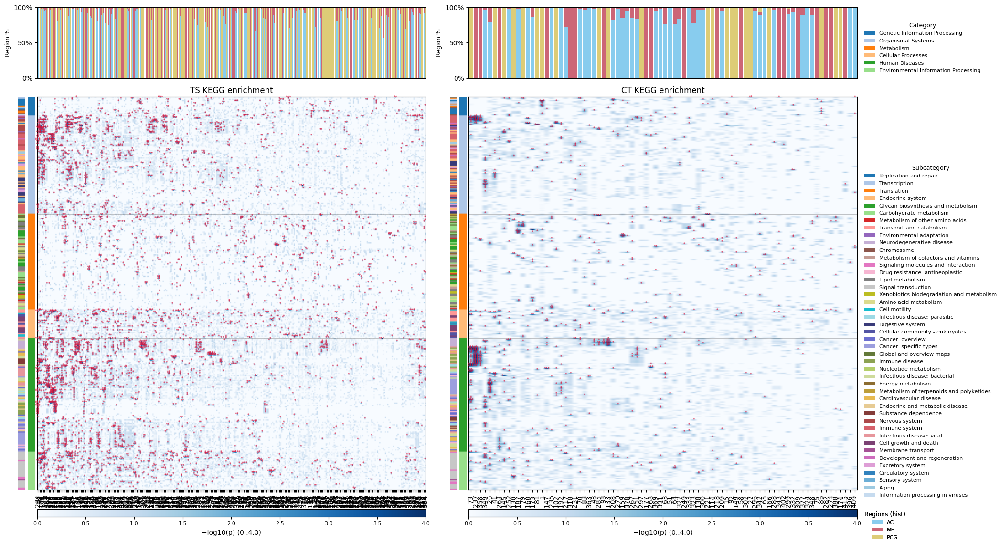

In [ ]:
from enrichmentViz import build_kegg_logp_matrix, build_annotation_palettes_from_kegg, export_kegg_ts_ct_enrichment_pdf

KEGG_CSV = r"/Users/edeneldar/CoExpression_ReProduction/kegg_rosmap_full1.csv"

MODULES = "/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_details.tsv"

palette_cat, palette_sub = build_annotation_palettes_from_kegg(KEGG_CSV)

fig, ts_rows, ts_cols, ct_rows, ct_cols = export_kegg_ts_ct_enrichment_pdf(
    kegg_long_csv=KEGG_CSV,
    modules_details_tsv=MODULES,
    pdf_path="kegg_TS_CT_enrichment_between_no_one_category121131.pdf",
    selection="global_top", K_GLOBAL=99999999, cap=4.0,
    cluster_cols=True, cluster_rows=True, row_grouping=(['category']),
    add_hist=True,
    hist_stacked_regions=True,
    hist_regions_cols=(["AC","MF","PCG"]),
    hist_region_colors={"AC":"#88CCEE","MF":"#CC6677","PCG":"#DDCC77"},
    palette_cat=palette_cat, palette_sub=palette_sub,
    build_matrix_fn=build_kegg_logp_matrix,
    ts_exclude_modules=[],            # ← לדוגמה: להסיר מודולים מה-TS
    ct_exclude_modules=[],
    star_color="crimson", star_fontsize=6, star_outline=False, hist_as_proportion=True
)


In [ ]:
import polars as pl

modules_table = (
    pl.scan_csv(
        r"/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/Shared drives/is-SomekhLab/inter_tissue_coexpression/proccessed_data/ROSMAP_full_outputs/xwgcna_rosmap_autobeta_run4_Cluster_table.tsv",
        separator="\t"
    )
    .with_columns(
        pl.col("Cluster ID")
          .cast(pl.Utf8)
          .str.replace_all(r"\s+", " ")
          .str.replace_all(r"^\s+|\s+$", "")
          .cast(pl.Int32)
    )
    .filter(pl.col("Cluster ID") == 4)
    .select(
        pl.col("Gene Symbol").str.split("_").list.get(1)
    )
    .collect()
)

modules_table

Gene Symbol
str
"""ENSG00000002822.15"""
"""ENSG00000003147.17"""
"""ENSG00000003989.17"""
"""ENSG00000004897.11"""
"""ENSG00000006534.15"""
…
"""ENSG00000278238.1"""
"""ENSG00000279400.1"""
"""ENSG00000279673.1"""


In [ ]:
pl.scan_csv(
    r"/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/RNAseq_RISK_BrainRegions_STasaki/data/gene_info.tsv",
    separator="\t"
).columns

/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_10796/782274044.py:4: PerformanceWarning: Determining the column names of a LazyFrame requires resolving its schema, which is a potentially expensive operation. Use `LazyFrame.collect_schema().names()` to get the column names without this warning.
  ).columns


['chr',
 'txStart',
 'txEnd',
 'width',
 'strand',
 'gene_type',
 'symbol',
 'ensgene',
 'geneid',
 'probeid']

In [ ]:
pl.scan_csv(
    r"/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/RNAseq_RISK_BrainRegions_STasaki/data/gene_info.tsv",
    separator="\t"
).select(pl.col("ensgene")).filter(pl.col("ensgene").is_in(modules_table["Gene Symbol"])).collect()

ensgene
str
"""ENSG00000008405.11"""
"""ENSG00000086544.2"""
"""ENSG00000086598.10"""
"""ENSG00000086730.16"""
"""ENSG00000087086.14"""
…
"""ENSG00000277125.1"""
"""ENSG00000278784.1"""
"""ENSG00000279536.1"""


In [ ]:
genes_table = modules_table.join(
    pl.scan_csv(
        r"/Users/edeneldar/Library/CloudStorage/GoogleDrive-edenede2@gmail.com/My Drive/ROSMAP_Data/RNAseq_RISK_BrainRegions_STasaki/data/gene_info.tsv",
        separator="\t"
    ).select(pl.col("symbol"), pl.col("ensgene")).collect(),
    left_on="Gene Symbol",
    right_on="ensgene"
)

In [ ]:
symbols = genes_table.select(pl.col("symbol"))

In [ ]:
symbols.to_series().to_list()

['MAD1L1',
 'ICA1',
 'SLC7A2',
 'CDC27',
 'ALDH3B1',
 'CSDE1',
 'REV3L',
 'ZNF800',
 'ARID4B',
 'RASSF1',
 'TBC1D2',
 'CYP2D6',
 'TNRC6B',
 'KIAA0930',
 'EP300',
 'POLR3H',
 'PSMC6',
 'VTI1B',
 'PCK2',
 'NKAIN4',
 'GPR143',
 'CHRDL1',
 'CEP152',
 'SNRNP70',
 'NOP53',
 'SP4',
 'ZNHIT1',
 'AK1',
 'PLGRKT',
 'KCNT1',
 'PTGDS',
 'LAMTOR3',
 'CCND1',
 'VWF',
 'COQ5',
 'SF3B1',
 'PLCD4',
 'ZNHIT6',
 'HMGCL',
 'NSUN4',
 'NSL1',
 'CREB1',
 'ALDH6A1',
 'GPR75',
 'FAM98A',
 'NFYB',
 'EPHX2',
 'CSMD2',
 'ZRANB3',
 'DDX39A',
 'TTC21B',
 'ZNF45',
 'BBS2',
 'EIF2S2',
 'NSRP1',
 'AKAP12',
 'SNRPA1',
 'RPA1',
 'FLOT2',
 'DPH2',
 'MPRIP',
 'CSNK1G2',
 'PDZD2',
 'HSD17B4',
 'ZFC3H1',
 'RNF122',
 'CTIF',
 'CAMK1',
 'AGO4',
 'C5AR2',
 'CCDC102A',
 'EGLN1',
 'SLC41A2',
 'LRCH1',
 'CCM2',
 'ADAMTS7',
 'MARCH7',
 'KCTD3',
 'SMPD4',
 'IMP4',
 'KIAA0368',
 'TUBB2B',
 'FLOT1',
 'ADCY3',
 'CYP2C8',
 'SENP7',
 'B4GALNT3',
 'SRP14',
 'IGF1R',
 'ZSCAN32',
 'PRDM16',
 'METTL21A',
 'RETREG2',
 'IGSF11',
 'TMEM108',
 

In [ ]:
for sym in symbols.to_series().to_list():
    print(sym)

MAD1L1
ICA1
SLC7A2
CDC27
ALDH3B1
CSDE1
REV3L
ZNF800
ARID4B
RASSF1
TBC1D2
CYP2D6
TNRC6B
KIAA0930
EP300
POLR3H
PSMC6
VTI1B
PCK2
NKAIN4
GPR143
CHRDL1
CEP152
SNRNP70
NOP53
SP4
ZNHIT1
AK1
PLGRKT
KCNT1
PTGDS
LAMTOR3
CCND1
VWF
COQ5
SF3B1
PLCD4
ZNHIT6
HMGCL
NSUN4
NSL1
CREB1
ALDH6A1
GPR75
FAM98A
NFYB
EPHX2
CSMD2
ZRANB3
DDX39A
TTC21B
ZNF45
BBS2
EIF2S2
NSRP1
AKAP12
SNRPA1
RPA1
FLOT2
DPH2
MPRIP
CSNK1G2
PDZD2
HSD17B4
ZFC3H1
RNF122
CTIF
CAMK1
AGO4
C5AR2
CCDC102A
EGLN1
SLC41A2
LRCH1
CCM2
ADAMTS7
MARCH7
KCTD3
SMPD4
IMP4
KIAA0368
TUBB2B
FLOT1
ADCY3
CYP2C8
SENP7
B4GALNT3
SRP14
IGF1R
ZSCAN32
PRDM16
METTL21A
RETREG2
IGSF11
TMEM108
MED12L
TIFA
IQGAP2
YIPF5
SLC25A48
PRSS35
RARS2
GPR107
PAMR1
SESN3
HYOU1
TKFC
PRSS53
ACAD8
CCDC175
CACUL1
C18orf25
FARP1
HNRNPDL
RAD17
SREK1
ANKFN1
IMPACT
ANKH
ACSS1
FBXL18
LRP8
DHRS1
DPYSL5
BABAM2
UBXN11
HTR6
SPATC1L
LARP4
PLPP3
JAK1
ZNF326
REL
DPY30
LMOD1
NMNAT3
SGMS2
POC1A
CTSB
NFIL3
HDX
HIF1AN
MSS51
TK2
FAM96B
NEMP1
SNRPD1
CDK12
TBC1D16
TTYH1
POLR2G
KIAA1586
GLYCTK
ADAM9
AHCY

In [ ]:
source("/media/psylab-6028/DATA/Eden/CoExpression_ReProduction/old_scripts/ClusteringBuilding.R")

Loading required package: dynamicTreeCut

Loading required package: fastcluster


Attaching package: ‘fastcluster’


The following object is masked from ‘package:stats’:

    hclust





Attaching package: ‘WGCNA’


The following object is masked from ‘package:stats’:

    cor




Allowing multi-threading with up to 32 threads.
Allowing multi-threading with up to 32 threads.


In [ ]:
# read rds file
TOM_mat <- readRDS("/media/psylab-6028/DATA/Eden/CoExpression_ReProduction/xwgcna_rosmap_autobeta_run2_drop__TOM.rds")

In [ ]:

message("Clustering on TOM...")
clusters_table <- Clusters_Table(
    TOM_mat,
    minClusterSize = 30L,
    plot_heatmap = TRUE,
    tissue_names = c("AC","MFBA9BA46","PCGBA23"),
    tissue_expr_file_names = rosmap_files <- c(
    "/media/psylab-6028/DATA/Eden/CoExpression_ReProduction/ROSMAP_fixed_AC.csv",
    "/media/psylab-6028/DATA/Eden/CoExpression_ReProduction/ROSMAP_fixed_MFBA9BA46.csv",
    "/media/psylab-6028/DATA/Eden/CoExpression_ReProduction/ROSMAP_fixed_PCGBA23.csv"
),
    group = "tryRosmap"
)


clusters_details <- Clusters_Details(
    clusters_table,
    cluster_type_thr = 0.95
)

write.table(
    clusters_table,
    file = paste0("tryRosmap", "_Cluster_table1.txt"),
    quote = FALSE,
    sep = "\t",
    row.names = FALSE
)

write.table(
    clusters_details,
    file = paste0("tryRosmap", "_Cluster_details1.txt"),
    quote = FALSE,
    sep = "\t",
    row.names = FALSE
)
# res <- run_kME_and_core_bridge(
#   tissue_names = tissue_names,
#   tissue_expr_file_names = tissue_expr_file_names,
#   clusters_table = clusters_table,       
#   cor_method = "pearson", unsigned_kME = TRUE,
#   out_prefix = "xwgcna_mycohort"
# )
clusters_table <- as.data.frame(clusters_table, stringsAsFactors = FALSE)
clusters_details <- as.data.frame(clusters_details, stringsAsFactors = FALSE)


Clustering on TOM...

Warning message in labels2colors(dynamicMods):
“labels2colors: Number of labels exceeds number of avilable colors. Some colors will be repeated 2 times.”
Plot heatmap46445

Warning message in plot.window(...):
“"moduleColors" is not a graphical parameter”
Warning message in plot.xy(xy, type, ...):
“"moduleColors" is not a graphical parameter”
Warning message in title(...):
“"moduleColors" is not a graphical parameter”


In [ ]:

clusters_details <- Clusters_Details(
clusters_table,
cluster_type_thr = 0.95
)

write.table(
clusters_table,
file = paste0("tryRosmap", "_Cluster_table1.txt"),
quote = FALSE,
sep = "\t",
row.names = FALSE
)

write.table(
clusters_details,
file = paste0("tryRosmap", "_Cluster_details1.txt"),
quote = FALSE,
sep = "\t",
row.names = FALSE
)

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv("/media/psylab-6028/DATA1/Eden/speakeasyR/SLabPL/speakeasy_clusters/speakeasy_clusters_details_1.tsv", sep="\t")

In [5]:
df.columns

Index(['Resolution', 'Cluster.ID', 'Cluster.Size', 'Cluster.Type',
       'Dominant.Tissue', 'Dominant.Prop', 'Cluster.Tissues',
       'TissueCount..AC', 'TissueCount..MFBA9BA46', 'TissueCount..PCGBA23'],
      dtype='object')

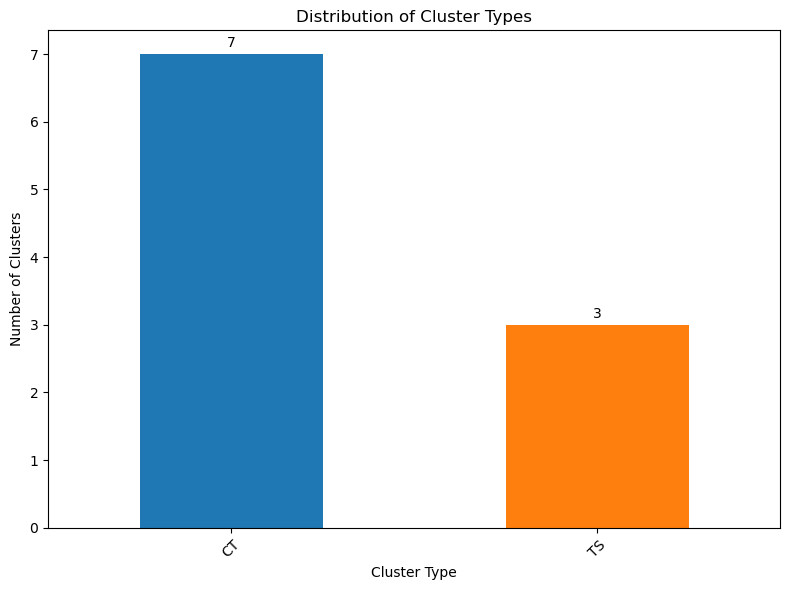

In [7]:
# generate a bar plot of the Cluster Type column
cluster_type_counts = df['Cluster.Type'].value_counts()
plt.figure(figsize=(8,6))
cmap = plt.get_cmap('tab10')
colors = [cmap(i) for i in range(len(cluster_type_counts))]
cluster_type_counts.plot(kind='bar', color=colors)
plt.title('Distribution of Cluster Types')
plt.xlabel('Cluster Type')
plt.ylabel('Number of Clusters')
plt.xticks(rotation=45)
ax = plt.gca()
for p in ax.patches:
    h = p.get_height()
    ax.annotate(f"{int(h)}",
                xy=(p.get_x() + p.get_width() / 2, h),
                xytext=(0, 3), textcoords="offset points",
                ha="center", va="bottom", fontsize=10)
plt.tight_layout()
plt.savefig("cluster_type_distribution1.png", dpi=300)
plt.show()
